In [1]:
import os, sys
print(sys.executable) # works this time
print(sys.version)
print(sys.version_info)
import scanpy as sc
from sklearn.cross_decomposition import CCA
from sklearn.manifold import TSNE
from scipy.sparse import csr_matrix
from scipy.sparse import csr_matrix
import numpy as np
import umap.umap_ as umap
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pandas as pd
import random

I:\mutiomics\pythonProject\.venv\Scripts\python.exe
3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)]
sys.version_info(major=3, minor=10, micro=11, releaselevel='final', serial=0)


In [2]:
adata1 = sc.read_h5ad("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\GC\\A2.h5ad")
adata2 = sc.read_h5ad("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\GC\\A1.h5ad")

In [3]:
import anndata
import pandas as pd

# 读取 h5ad 文件

# 提取表达矩阵和位置信息
expression_matrix = adata2.X
positions = pd.DataFrame({
    '0': adata2.obs["spatialX"],
    '1': adata2.obs["spatialY"]
})  # 假设位置信息在 obs 中，列名为 'x' 和 'y'
cluster = adata2.obs["clusters"]
# 将数据保存为 CSV 文件，方便在 R 中读取
#pd.DataFrame(expression_matrix.toarray()).to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\B2_expression.csv", index=False)
#pd.DataFrame(positions).to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\B2_position.csv", index=False)
#pd.DataFrame(cluster).to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\B2_cluster.csv", index=False)


In [4]:
adata1.obs["leiden"] = adata1.obs["clusters"]
adata2.obs["leiden"] = adata2.obs["clusters"]

In [5]:
import matplotlib.pyplot as plt
sc.pl.spatial(adata1, img_key = "hires", color="clusters", size=1.5, show=False)
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\m3_9AA_VisiumArray_plot.pdf")
sc.pl.spatial(adata2, img_key = "hires", color="clusters", size=1.5, show=False)
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\m3_visium_ctrl.pdf")

ValueError: When .uns['spatial'][library_id] does not exist, spot_size must be provided directly.

In [6]:
adata1

AnnData object with n_obs × n_vars = 1000 × 2499
    obs: 'barcode', 'in_tissue', 'array_row', 'array_col', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'leiden', 'clusters'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'moranI', 'neighbors', 'pca', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [7]:
print(adata1.X.shape)
print(adata1.obsm["spatial"].shape)

(1000, 2499)
(1000, 2)


In [8]:
data1_pca_results = adata1.obsm['spatial']  # PCA 结果
pca_leiden = adata1.obs["leiden"]
data1_leiden_str = pca_leiden.to_numpy()

data2_pca_results = adata2.obsm['X_umap']  # PCA 结果
pca_leiden = adata2.obs["leiden"]
data2_leiden_str = pca_leiden.to_numpy()

def var_select(df, m1, m2, n):
    # 1. 筛选出列均值在 m1 和 m2 之间的行
    filtered_df = df.loc[:,(df.mean() > m1) & (df.mean() < m2)]

    # 2. 计算每行的方差，并选择前 n 个最大值所对应的索引
    variances = filtered_df.var(axis=0)/filtered_df.mean()
    sorted_indices = variances.sort_values(ascending=False).index
    selected_indices = sorted_indices[:n]

    return selected_indices.tolist()


def convert_to_array(x):
    if isinstance(x, csr_matrix):
        return x.toarray()
    elif isinstance(x, np.ndarray):
        return x
    else:
        raise ValueError("Unsupported input type. Must be csr_matrix or ndarray.")
        
def tpm_normalize(counts_matrix):
    # 计算每个细胞的总表达量
    total_counts_per_cell = counts_matrix.sum(axis=1)
    # 计算每个基因的 TPM
    tpm_matrix = (counts_matrix.div(total_counts_per_cell, axis=0)) * 1e4
    return tpm_matrix

In [9]:
#####spatial alignment of data3(metabolic) and data2(spatial) using CCA
def rotate_point_90_degrees(row):
    new_x = -row[0]
    new_y = row[1]
    return pd.Series({0: new_x, 1: new_y})

def flip_around_y_minus_x(row):
    new_x = -row[0]
    new_y = -row[1]
    return pd.Series({0: new_x, 1: new_y})

def flip_around_y_plus_x(row):
    new_x = row[1]
    new_y = row[0]
    return pd.Series({0: new_x, 1: new_y})
    
def center_and_scale(data, feature_range=(0, 500)):
    """
    对数据进行中心缩放和范围缩放
    """
    # 中心缩放
    scaler_center = StandardScaler()
    data_centered = scaler_center.fit_transform(data)
    
    # 范围缩放
    scaler_range = MinMaxScaler(feature_range=feature_range)
    data_scaled = scaler_range.fit_transform(data_centered)
    
    return data_scaled
    
from sklearn.preprocessing import MinMaxScaler
#scaler = MinMaxScaler(feature_range=(-100, 100))
data3_spatial_results = pd.DataFrame(adata1.obsm['spatial'])
#scaled_data = scaler.fit_transform(data3_spatial_results)
scaled_data = center_and_scale(data3_spatial_results)
data3_spatial_results = pd.DataFrame(scaled_data, columns=data3_spatial_results.columns)
print(data3_spatial_results.head)
data2_spatial_results = pd.DataFrame(adata2.obsm['spatial'])
#data2_spatial_results = positions
#scaled_data = scaler.fit_transform(data2_spatial_results)
scaled_data = center_and_scale(data2_spatial_results)
data2_spatial_results = pd.DataFrame(scaled_data, columns=data2_spatial_results.columns)

data2_spatial_results=pd.DataFrame(data2_spatial_results)
data3_spatial_results=pd.DataFrame(data3_spatial_results)
#data3_spatial_results = data3_spatial_results.apply(rotate_point_90_degrees, axis=1)
#data3_spatial_results = data3_spatial_results.apply(flip_around_y_minus_x, axis=1)
#data3_spatial_results = data3_spatial_results.apply(flip_around_y_plus_x, axis=1)
data1_spatial_results = data3_spatial_results
data1_spatial_results=pd.DataFrame(data1_spatial_results)
#data1_spatial_results = data1_spatial_results +400
#data2_spatial_results = data2_spatial_results +400
#data3_spatial_results = data3_spatial_results +400

<bound method NDFrame.head of               0           1
0     99.351176  199.358632
1     98.337388  289.417424
2    404.298459  348.743987
3     86.577453  298.236237
4     81.305758  433.190807
..          ...         ...
995  183.292782  435.061464
996   96.512571   82.041689
997  353.811841  284.874399
998  129.764801  289.951897
999  180.454177  335.916622

[1000 rows x 2 columns]>


C:\Users\28123\AppData\Local\Temp\ipykernel_20600\3934839348.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0     106.853204     178.217822           0                3             -1   
1     106.853204     263.157895           1                2             -1   
2     406.934307     270.192809           2                6             -1   
3      96.107056     275.664409           3                9             -1   
4      95.498783     403.335070           4                0             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0       107.258719       181.453768           222                  3   
1       102.595296       262.426510           437                  1   
2       408.961882       267.771245           196                  8   
3        86.780211       280.064137           831                  1   
4        89.416058       397.381080           233                  2   

   matabolic.CCA.Z 

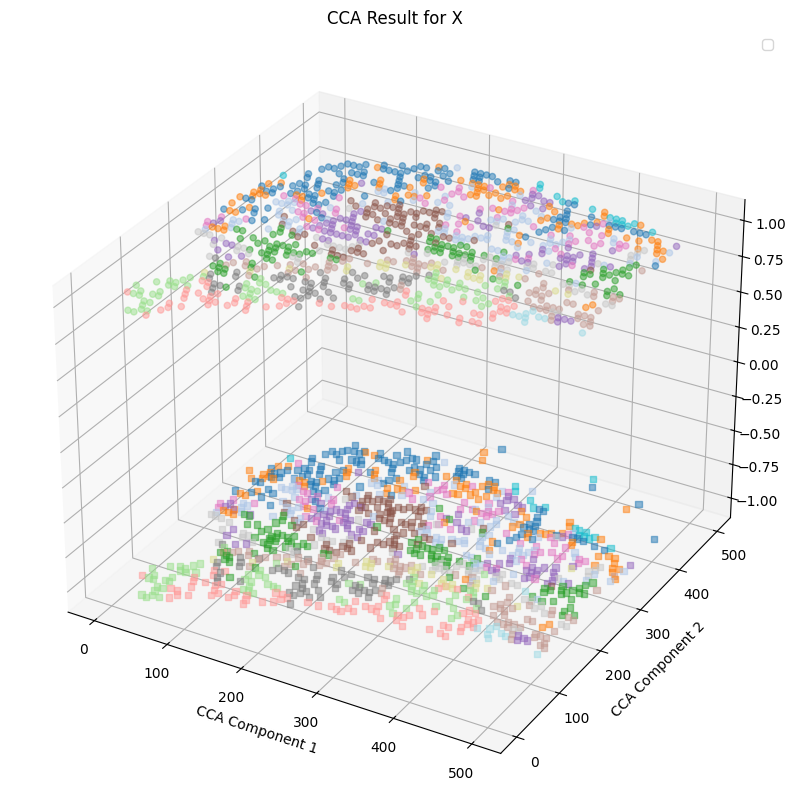

In [10]:
Y_c = data2_spatial_results
Z_c = data3_spatial_results
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(data3_spatial_results, data2_spatial_results, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()

In [11]:
color_mapping = {
    0: 'blue',
    1: 'red',
    2: 'green',
    3: 'yellow',
    4: 'orange',
    5: 'purple',
    6: 'brown',
    7: 'pink',
    8: 'gray',
    9: 'cyan',
    10: 'magenta',
    11: 'cyan',
    12: 'blue',
    13: 'red',
    14: 'green',
    15: 'yellow'
}

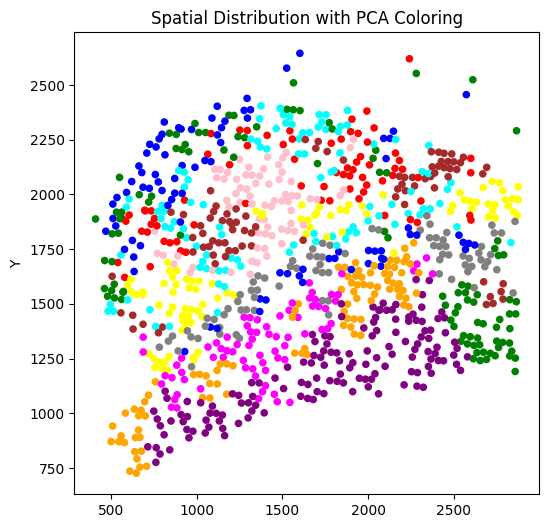

In [12]:
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\rat\\directalignment.pdf")
plt.show()


In [13]:
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
accruracy_directmerge = same_values_count_fine
accruracy_directmerge

289

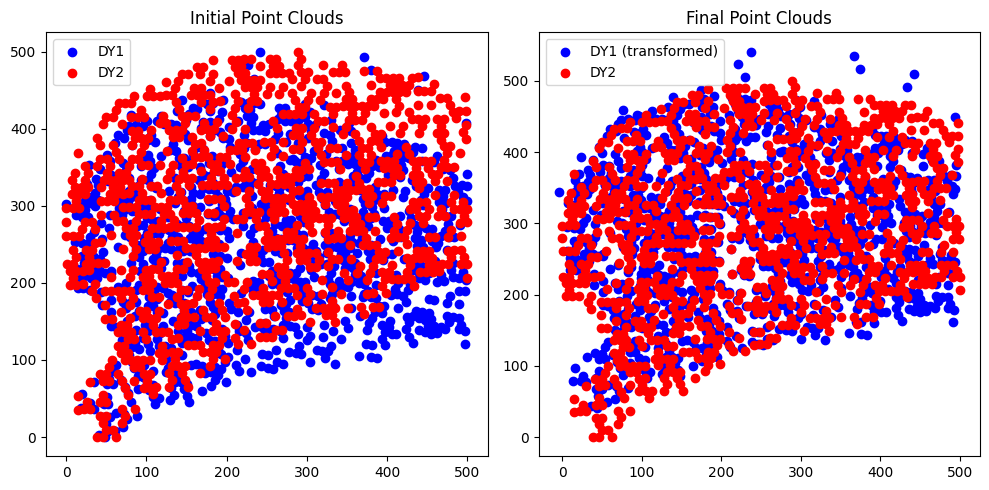

Final transformation matrix:
[[-4.20108393e-15]
 [ 9.33653155e-15]]


In [16]:
#####direct_ICP
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

DY1 = data2_spatial_results.T.to_numpy()  # Example DYGW1 features
DY2 = data3_spatial_results.T.to_numpy()  # Example DYGW2 features

transformation = np.eye(2)  # 初始变换矩阵为2x2的单位矩阵

# 设定迭代次数和收敛阈值
max_iterations = 500
tolerance = 1e-5

# 创建一个新的图形窗口
plt.figure(figsize=(10, 5))

# 绘制初始的DY1和DY2点云
plt.subplot(1, 2, 1)
plt.title('Initial Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

iteration = 0
converged = False

while not converged and iteration < max_iterations:
    # Step 1: Find correspondences based on spatial proximity
    tree = cKDTree(DY2.T)
    distances, indices = tree.query(DY1.T)
    
    corresponding_target_points = DY2[:, indices]

    # Step 2: Optimize transformation using spatial and feature distances
    # Example: simple averaging transformation for illustration
    transformation = np.mean(corresponding_target_points - DY1, axis=1, keepdims=True)

    # Step 3: Apply transformation to DY1
    DY1_transformed = DY1 + transformation

    # Step 4: Update DY1 for the next iteration
    DY1 = DY1_transformed

    # Step 5: Check convergence
    if np.linalg.norm(transformation) < tolerance:
        converged = True

    iteration += 1

# 绘制最终的DY1和DY2点云
plt.subplot(1, 2, 2)
plt.title('Final Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1 (transformed)')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

plt.tight_layout()
plt.show()

print("Final transformation matrix:")
print(transformation)

C:\Users\28123\AppData\Local\Temp\ipykernel_28708\4280202264.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0     102.266626     219.170679           0                3             -1   
1     102.266626     304.110752           1                2             -1   
2     402.347729     311.145666           2                6             -1   
3      91.520479     316.617266           3                9             -1   
4      90.912206     444.287928           4                0             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0        99.148418       217.263495           815                  3   
1       106.042174       307.589524           748                  6   
2       404.501217       312.667023           366                 11   
3        94.079481       316.408338           340                  9   
4        84.955393       442.276857           342                  0   

   matabolic.CCA.Z 

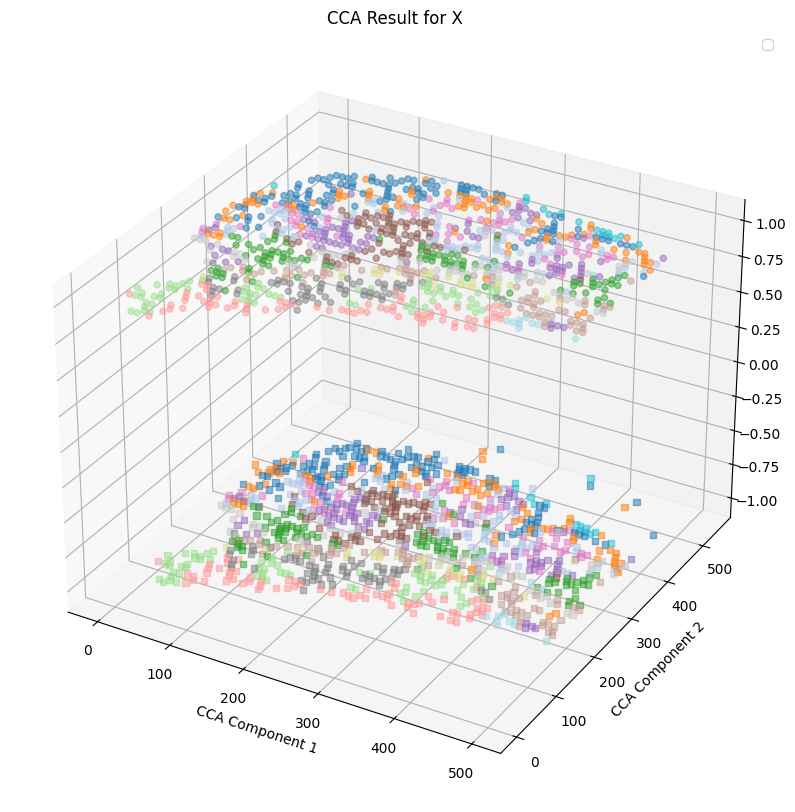

In [17]:
Y_c = pd.DataFrame(DY1).T
Z_c = pd.DataFrame(DY2).T
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(Z_c, Y_c, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices_ = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices_,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices_].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()

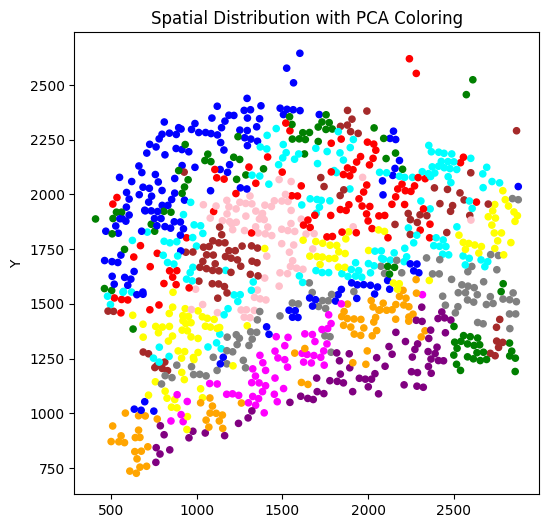

In [18]:
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\rat\\directalignment.pdf")
plt.show()


In [19]:
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
accruracy_ICP = same_values_count_fine
accruracy_ICP

462

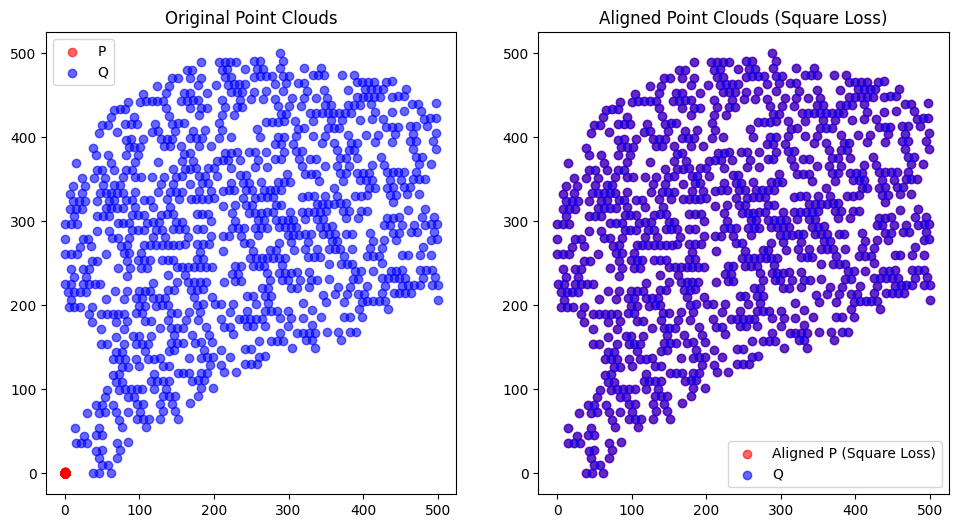

In [37]:
import numpy as np
import ot
import matplotlib.pyplot as plt

# 假设 P 和 Q 是两个点云，形状分别为 (n, d) 和 (m, d)
P = data2_spatial_results.to_numpy()  # Example DYGW1 features
Q = data3_spatial_results.to_numpy()  # Example DYGW2 features
F_P = P
F_Q = Q
    
    # 数据标准化
scaler = StandardScaler()
P = scaler.fit_transform(P)
Q = scaler.fit_transform(Q)
    
    # 数据归一化
scaler = MinMaxScaler()
P = scaler.fit_transform(P)
Q = scaler.fit_transform(Q)
    
    # 计算几何距离矩阵
C_P = np.linalg.norm(P[:, None, :] - P[None, :, :], axis=2)
C_Q = np.linalg.norm(Q[:, None, :] - Q[None, :, :], axis=2)


# 初始化权重，均匀分布
init_p = np.ones((P.shape[0],)) / P.shape[0]
init_q = np.ones((Q.shape[0],)) / Q.shape[0]
M = np.linalg.norm(F_P[:, None, :] - F_Q[None, :, :], axis=2)
    
# 设置参数
params = {
       'max_iter': 2000,    # 增加最大迭代次数
       'tol_rel': 1e-9,     # 调整相对容差
       'tol_abs': 1e-9,     # 调整绝对容差
       'armijo': True       # 使用Armijo线搜索
   }
    

# 计算最优传输计划，尝试不同的损失函数
pi, log = ot.gromov.fused_gromov_wasserstein(M,C_P, C_Q, init_p, init_q, alpha=0.1, log=True, **params)
P_aligned = np.dot(pi, Q)
# 对齐点云 P 到 Q

P_aligned = np.dot(pi, Q)
scaler = StandardScaler()
P_aligned = scaler.fit_transform(P_aligned)
scaler = MinMaxScaler()
P_aligned = scaler.fit_transform(P_aligned)

P_aligned = pd.DataFrame(P_aligned)
scaledata = center_and_scale(P_aligned)
P_aligned = pd.DataFrame(scaledata, columns=P_aligned.columns).to_numpy()

Q = pd.DataFrame(Q)
scaledata = center_and_scale(Q)
Q = pd.DataFrame(scaledata, columns=Q.columns).to_numpy()

# 可视化
plt.figure(figsize=(18, 6))

# 原始点云
plt.subplot(1, 3, 1)
plt.scatter(P[:, 0], P[:, 1], color='red', label='P', alpha=0.6)
plt.scatter(Q[:, 0], Q[:, 1], color='blue', label='Q', alpha=0.6)
plt.title('Original Point Clouds')
plt.legend()

# 对齐后的点云 (Square Loss)
plt.subplot(1, 3, 2)
plt.scatter(P_aligned[:, 0], P_aligned[:, 1], color='red', label='Aligned P (Square Loss)', alpha=0.6)
plt.scatter(Q[:, 0], Q[:, 1], color='blue', label='Q', alpha=0.6)
plt.title('Aligned Point Clouds (Square Loss)')
plt.legend()

# 对齐后的点云 (KL Loss)

plt.show()

C:\Users\28123\AppData\Local\Temp\ipykernel_28708\2391042554.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0     103.203569     190.272582           0                3             -1   
1      90.227088     325.227151           1                2             -1   
2     404.298459     348.743987           2                6             -1   
3      90.429846     289.150187           3                9             -1   
4      84.955393     442.276857           4                0             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0       103.203569       190.272582           488                  3   
1        90.227088       325.227151           590                  0   
2       404.298459       348.743987             2                  6   
3        90.429846       289.150187           779                  9   
4        84.955393       442.276857           342                  0   

   matabolic.CCA.Z 

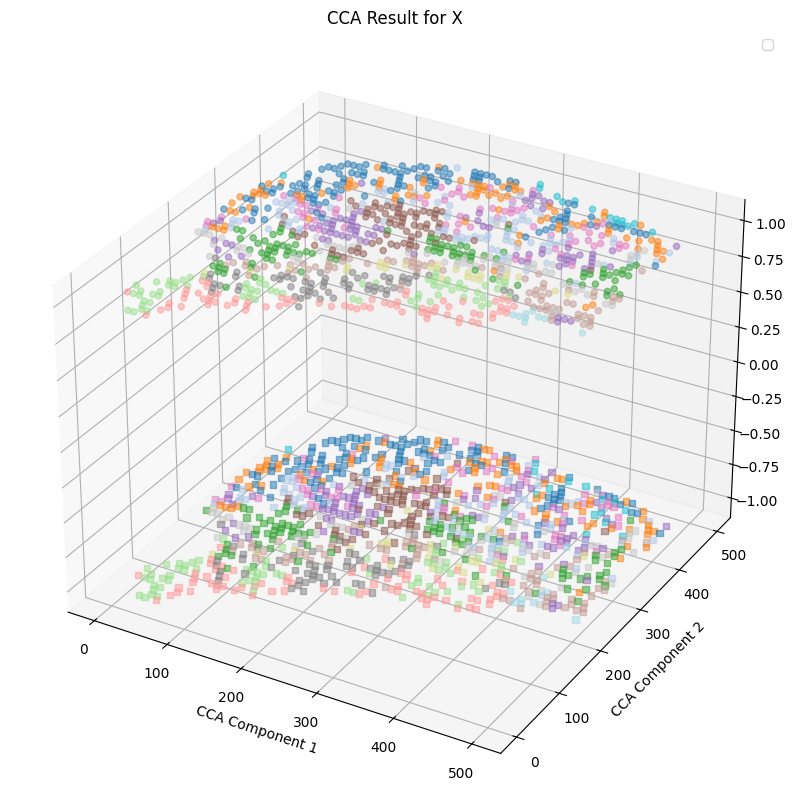

In [38]:
Y_c = pd.DataFrame(P_aligned)
Z_c = pd.DataFrame(Q)
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(Z_c, Y_c, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices_ = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices_,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices_].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()

In [39]:
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
accruracy_FGW = same_values_count_fine
accruracy_FGW

550

C:\Users\28123\AppData\Local\Temp\ipykernel_19716\1606911023.py:37: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(colormap)


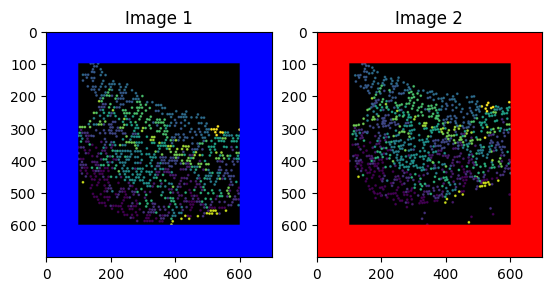

Transformation Matrix:
 [[ 9.81295876e-01 -1.51843818e-02  1.08855136e+01]
 [ 3.46886577e-04  9.89154013e-01  9.18535769e+00]]


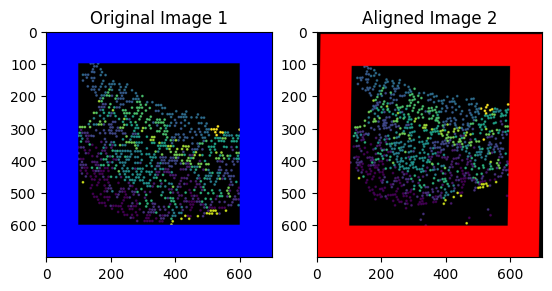

              0           1
0    109.645143  184.457387
1    108.355381  268.476201
2    402.716909  275.538909
3     97.620327  280.843342
4     95.084832  407.129078
..          ...         ...
995  192.803241  392.473136
996  105.719953   77.241226
997  354.546934  225.007228
998  140.241229  265.137011
999  188.875243  298.401092

[1000 rows x 2 columns]
              0           1
0    109.645143  184.457387
1    108.355381  268.476201
2    402.716909  275.538909
3     97.620327  280.843342
4     95.084832  407.129078
..          ...         ...
995  192.803241  392.473136
996  105.719953   77.241226
997  354.546934  225.007228
998  140.241229  265.137011
999  188.875243  298.401092

[1000 rows x 2 columns]


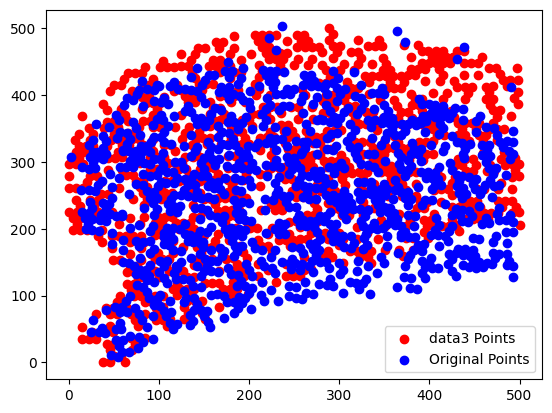

In [9]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def create_image_from_data(data, width=500, height=500, dot_size=5, border_size=50, dot_colors=None, border_color=(0, 0, 0), colormap='viridis'):
    """
    Create an image from 2D data points with specified dot size, border size, and colors.

    Parameters:
    - data: 2D numpy array where data[0] contains x coordinates and data[1] contains y coordinates
    - width: Width of the image
    - height: Height of the image
    - dot_size: Size of the dots
    - border_size: Size of the border around the image
    - dot_colors: List of scalar values for each dot, which will be mapped to colors using a colormap
    - border_color: Color of the border (BGR format)
    - colormap: Colormap to use for mapping scalar values to colors
    
    Returns:
    - bordered_image: Image with data points and border
    """
    # Initialize an empty image with three channels for color
    image = np.zeros((height, width, 3), dtype=np.uint8)

    # Normalize data points to image dimensions
    x_norm = np.interp(data[0], (data[0].min(), data[0].max()), (0, width-1))
    y_norm = np.interp(data[1], (data[1].min(), data[1].max()), (0, height-1))

    # Normalize dot_colors to [0, 1] range
    if dot_colors is not None:
        norm = plt.Normalize(vmin=min(dot_colors), vmax=max(dot_colors))
        cmap = cm.get_cmap(colormap)
        mapped_colors = cmap(norm(dot_colors))

    # Draw circles at normalized positions
    for i, (x, y) in enumerate(zip(x_norm, y_norm)):
        if dot_colors is not None:
            color = (mapped_colors[i][:3] * 255).astype(int)  # Convert to BGR format
            color = tuple(map(int, color[::-1]))  # Convert from RGB to BGR
        else:
            color = (255, 255, 255)  # Default white color
        cv2.circle(image, (int(x), int(y)), dot_size, color, -1)  # -1 means filled circle

    # Add border
    bordered_image = cv2.copyMakeBorder(image, border_size, border_size, border_size, border_size, 
                                        cv2.BORDER_CONSTANT, value=border_color)

    return bordered_image

# Simulated scalar values
dot_colors_1 = data1_leiden_str.astype(int)
dot_colors_2 = data2_leiden_str.astype(int)

# Create images
border_size = 100
img1 = create_image_from_data(data3_spatial_results, width=500, height=500, dot_size=4, border_size=border_size, dot_colors=dot_colors_1, border_color=(255, 0, 0), colormap='viridis')
img2 = create_image_from_data(data2_spatial_results, width=500, height=500, dot_size=4, border_size=border_size, dot_colors=dot_colors_2, border_color=(0, 0, 255), colormap='viridis')

# Display images using matplotlib
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title('Image 1')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.title('Image 2')

plt.show()


import cv2
import numpy as np
import matplotlib.pyplot as plt

# Lists to store points
points_image1 = []
points_image2 = []

def click_event_image1(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        points_image1.append((x, y))
        cv2.circle(img1_display, (x, y), 5, (0, 255, 0), -1)
        cv2.imshow('Image 1', img1_display)

def click_event_image2(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        points_image2.append((x, y))
        cv2.circle(img2_display, (x, y), 5, (0, 255, 0), -1)
        cv2.imshow('Image 2', img2_display)

def compute_affine_transform(points_image1, points_image2):
    pts1 = np.float32(points_image1)
    pts2 = np.float32(points_image2)
    M = cv2.getAffineTransform(pts2[:3], pts1[:3])  # Use the first 3 points for affine transform
    return M

def warp_image(image, M, output_shape):
    warped_image = cv2.warpAffine(image, M, output_shape)
    return warped_image

# Load images
img1_display = img1.copy()
img2_display = img2.copy()

# Display images and set mouse callbacks
cv2.imshow('Image 1', img1_display)
cv2.imshow('Image 2', img2_display)
cv2.setMouseCallback('Image 1', click_event_image1)
cv2.setMouseCallback('Image 2', click_event_image2)

# Wait until 6 points are selected (3 from each image)
while len(points_image1) < 3 or len(points_image2) < 3:
    cv2.waitKey(1)

cv2.destroyAllWindows()

# Compute the transformation matrix
M = compute_affine_transform(points_image1, points_image2)
print("Transformation Matrix:\n", M)

# Apply the transformation to the second image
rows, cols = img1.shape[:2]
aligned_image = warp_image(img2, M, (cols, rows))

# Display the original and aligned images
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title('Original Image 1')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(aligned_image, cv2.COLOR_BGR2RGB))
plt.title('Aligned Image 2')
plt.show()

M_homogeneous = np.vstack([M, [0, 0, 1]])

# Convert DataFrame to homogeneous coordinates
coordinates_data3 = data3_spatial_results  # Add a column of 1s
coordinates_data2 = data2_spatial_results  # Add a column of 1s

def apply_affine_transform_2d(coordinates, transformation_matrix):
    """
    对二维坐标应用仿射变换
    """
    # 添加齐次坐标
    homogeneous_coordinates = np.hstack([coordinates, np.ones((coordinates.shape[0], 1))])
    
    # 应用仿射变换
    transformed_coordinates = np.dot(homogeneous_coordinates, transformation_matrix.T)
    
    return transformed_coordinates[:, :2]

transformed_coordinates_data2 = apply_affine_transform_2d(coordinates_data2+border_size, M_homogeneous)
transformed_coordinates_data2 = pd.DataFrame(transformed_coordinates_data2-border_size)
# Apply the transformation matrix
#transformed_coordinates_data3 = coordinates_data3.dot(M_homogeneous.T)
#transformed_coordinates_data2 = coordinates_data2.dot(M)
# Update the DataFrame with the transformed coordinates
#print(transformed_coordinates_data2)
#print(data3_spatial_results)
#plt.title('Original Points')
plt.scatter(data3_spatial_results[0], data3_spatial_results[1], color='red', label='data3 Points')
plt.scatter(transformed_coordinates_data2[0], transformed_coordinates_data2[1], color='blue', label='Original Points')


plt.legend()

print(transformed_coordinates_data2)
data2_spatial_results = transformed_coordinates_data2.iloc[:,0:2]
print(data2_spatial_results)

C:\Users\28123\AppData\Local\Temp\ipykernel_19716\3934839348.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0     109.645143     184.457387           0                3             -1   
1     108.355381     268.476201           1                2             -1   
2     402.716909     275.538909           2                6             -1   
3      97.620327     280.843342           3                9             -1   
4      95.084832     407.129078           4                0             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0       107.258719       181.453768           222                  3   
1       106.447689       271.512560           394                  9   
2       408.961882       267.771245           196                  8   
3        98.337388       289.417424             1                  2   
4        97.120843       415.553180           125                  0   

   matabolic.CCA.Z 

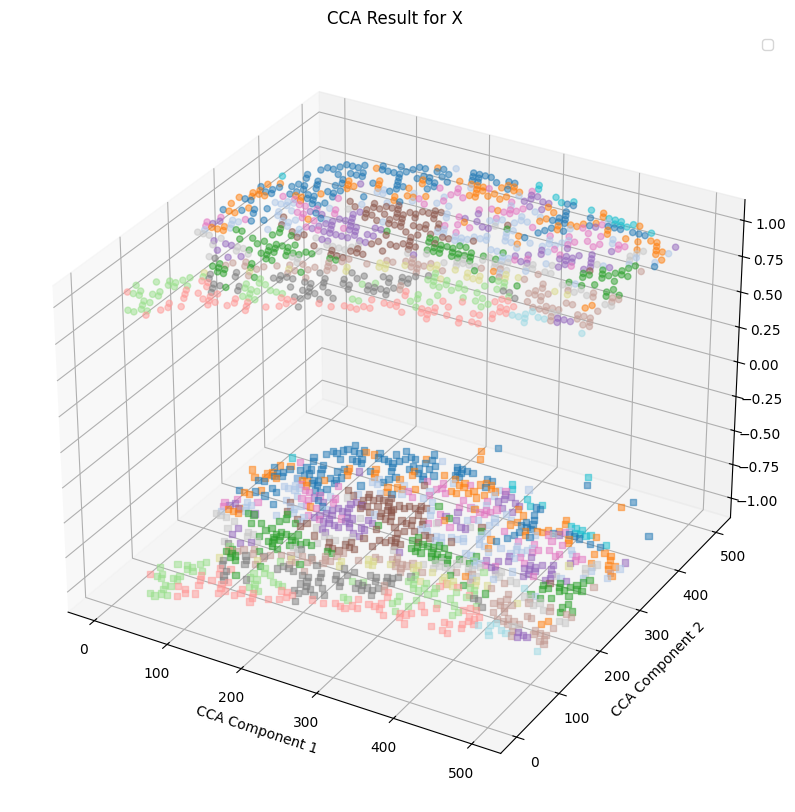

In [10]:
Y_c = data2_spatial_results
Z_c = data3_spatial_results
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(data3_spatial_results, data2_spatial_results, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()

In [11]:
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\rat\\grossalignment.pdf")
plt.show()


NameError: name 'color_mapping' is not defined

<Figure size 600x600 with 0 Axes>

In [12]:
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
Accruracy_grossalignment = same_values_count_fine

In [13]:
X_c=pd.DataFrame(data1_spatial_results)
Y_c=pd.DataFrame(data2_spatial_results)
Z_c=pd.DataFrame(data3_spatial_results)

In [14]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import cdist
from scipy.optimize import minimize
import matplotlib.pyplot as plt

def calculate_simpson_index(values):
    total_count = len(values)
    unique_values = set(values)
    simpson_index = 1 - sum((values.count(value) / total_count) ** 2 for value in unique_values)
    return simpson_index

def main(df):
    x1_x2_lists = df.groupby('spatial_ID')['matabolic_cluster'].apply(list).reset_index()
    simpson_indices = x1_x2_lists['matabolic_cluster'].apply(calculate_simpson_index)
    max_x2_values = x1_x2_lists['matabolic_cluster'].apply(lambda x: max(set(x), key=x.count))
    new_df = pd.DataFrame({'spatial_ID': x1_x2_lists['spatial_ID'], 'Most_freq_metabolic_cluster': max_x2_values, 'Simpson_Index': simpson_indices})
    new_df = pd.merge(new_df, df[['spatial_ID', "spatial_cluster"]].drop_duplicates(), on='spatial_ID', how='left')
    return new_df

def perform_transformations(DF2, DF3, Y_c, Z_c, data2_leiden_str, data1_leiden_str):
    transform_matrix = np.array([[1., 0., 0.], [0., 1., 0.], [0., 0., 1.]])
    max_runs = 100
    run_count = 0
    while run_count < max_runs:
        run_count += 1
        distances = cdist(DF3, DF2, metric='euclidean')
        dist_df = pd.DataFrame(distances)
        
        row_indices, col_indices = np.where(distances < dist_min)
        unique_row_indices = np.unique(row_indices)
        unique_col_indices = np.unique(col_indices)
        
        Y_C_ = Y_c.iloc[col_indices, :]
        Y_C_['spatial_ID'] = Y_C_.index
        Y_C_ = Y_C_.reset_index()
        Y_C_["spatial_cluster"] = data2_leiden_str[col_indices].astype(int)
        Y_C_["spatial.CCA.Z"] = -1
        Y_C_ = Y_C_.drop(columns=['index'])
        Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1: "spatial.CCA.Y"})
        
        Z_C_ = Z_c.iloc[row_indices, :]
        Z_C_['matabolic_ID'] = Z_C_.index
        Z_C_ = Z_C_.reset_index()
        Z_C_["matabolic_cluster"] = data1_leiden_str[row_indices].astype(int)
        Z_C_ = Z_C_.drop(columns=['index'])
        Z_C_["matabolic.CCA.Z"] = 1
        Z_C_ = Z_C_.rename(columns={0: "metabolic.CCA.X", 1: "metabolic.CCA.Y"})
        
        pairs = pd.concat([Y_C_, Z_C_], axis=1)
        pairs["distance"] = dist_df.iloc[row_indices, col_indices].values.diagonal()
        filtered_spatial_ids = pairs["spatial_ID"]


        
       # data = pairs
       # df = pd.DataFrame(data)
       # result_df = main(df)
       # filtered_spatial_ids = result_df[result_df["Simpson_Index"] < 1.1]["spatial_ID"]
        
        if filtered_spatial_ids.empty:
            break

        dist_df = pd.DataFrame(distances)
        dist_df = dist_df.iloc[:,DF2.drop(filtered_spatial_ids.tolist()).index.to_numpy()]
        min_row_indices = dist_df.idxmin()
        print(f"min_row_indices",min_row_indices.shape)
        df2 = DF2.iloc[DF2.drop(filtered_spatial_ids.tolist()).index.to_numpy(),:].rename(columns = {
            0:"x",
            1:"y",
        })
        df3 =DF3.iloc[min_row_indices,:].rename(columns = {
            0:"x",
            1:"y",
        })


        def loss_function(params, df2, df3):
            tx, ty, theta = params
            translation_matrix = np.array([[1, 0, tx], [0, 1, ty], [0, 0, 1]])
            rotation_matrix = np.array([[np.cos(theta), -np.sin(theta), 0], [np.sin(theta), np.cos(theta), 0], [0, 0, 1]])
            transform_matrix = translation_matrix.dot(rotation_matrix)
            ones = np.ones((df2.shape[0], 1))
            df2_homogeneous = np.hstack([df2, ones])
            df2_transformed = df2_homogeneous.dot(transform_matrix.T)
            total_distance = 0
            for point, point1 in zip(df2_transformed[:, :2], df2):
                distances = np.linalg.norm(df3 - point, axis=1)
                distances2 = np.linalg.norm(point - point1)
                total_distance += np.sum(distances) + distances2*0
            return total_distance

        initial_params = [0, 0, 0]
        result = minimize(loss_function, initial_params, args=(df2.values, df3.values), method='L-BFGS-B')

        optimal_params = result.x
        tx_opt, ty_opt, theta_opt = optimal_params
        translation_matrix_opt = np.array([[1, 0, tx_opt], [0, 1, ty_opt], [0, 0, 1]])
        rotation_matrix_opt = np.array([[np.cos(theta_opt), -np.sin(theta_opt), 0], [np.sin(theta_opt), np.cos(theta_opt), 0], [0, 0, 1]])
        transform_matrix_opt = translation_matrix_opt.dot(rotation_matrix_opt)

        print("Optimal Translation and Rotation Parameters:")
        print("Translation: (", tx_opt, ",", ty_opt, ")")
        print("Rotation (radians):", theta_opt)
        print("Transform Matrix:\n", transform_matrix_opt)

        ones = np.ones((df2.shape[0], 1))
        df2_homogeneous = np.hstack([df2.values, ones])
        df2_transformed = df2_homogeneous.dot(transform_matrix_opt.T)

        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.scatter(df2['x'], df2['y'], label='df2 (original)', alpha=0.6)
        plt.scatter(df3['x'], df3['y'], label='df3', alpha=0.6)
        plt.title('Original Data')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.scatter(df2_transformed[:, 0], df2_transformed[:, 1], label='df2 (transformed)', alpha=0.6)
        plt.scatter(df3['x'], df3['y'], label='df3', alpha=0.6)
        plt.title('Transformed Data')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend()

        plt.tight_layout()
        plt.show()

        ones = np.ones((DF2.shape[0], 1))
        df2_homogeneous = np.hstack([DF2.values, ones])
        DF2 = df2_homogeneous.dot(transform_matrix_opt.T)
        DF2 = pd.DataFrame(DF2)
        DF2 = DF2.iloc[:, 0:2]

        if np.allclose(transform_matrix_opt, np.eye(3), atol=1e-3):
            break

    return DF2

# 调用函数并获取结果



C:\Users\28123\AppData\Local\Temp\ipykernel_19716\1838888091.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_19716\1838888091.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (980,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.9730927085525569 , 0.8289118639367676 )
Rotation (radians): 0.006094113809182373
Transform Matrix:
 [[ 0.99998143 -0.00609408  0.97309271]
 [ 0.00609408  0.99998143  0.82891186]
 [ 0.          0.          1.        ]]


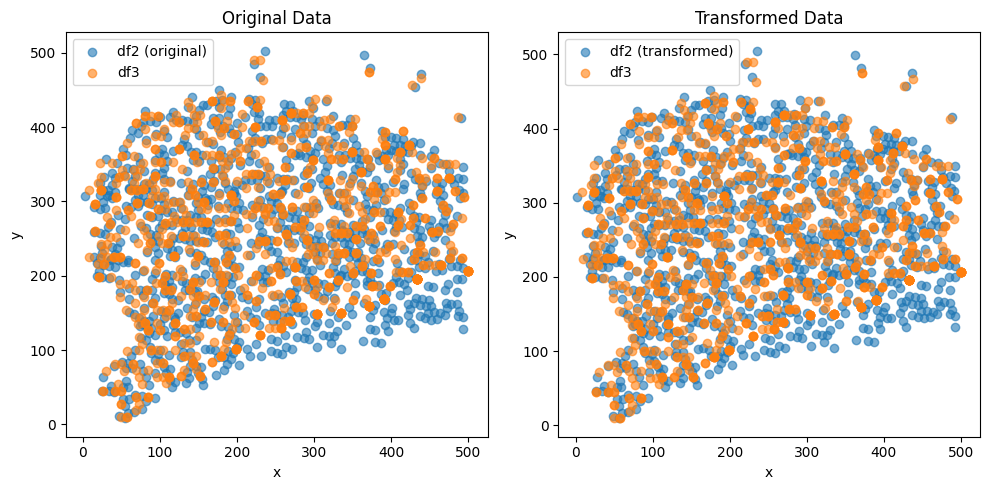

C:\Users\28123\AppData\Local\Temp\ipykernel_19716\1838888091.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_19716\1838888091.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (989,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.2090734012127004e-05 , 2.7437059861394015e-05 )
Rotation (radians): 0.004498586589039268
Transform Matrix:
 [[ 9.99989881e-01 -4.49857142e-03  1.20907340e-05]
 [ 4.49857142e-03  9.99989881e-01  2.74370599e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


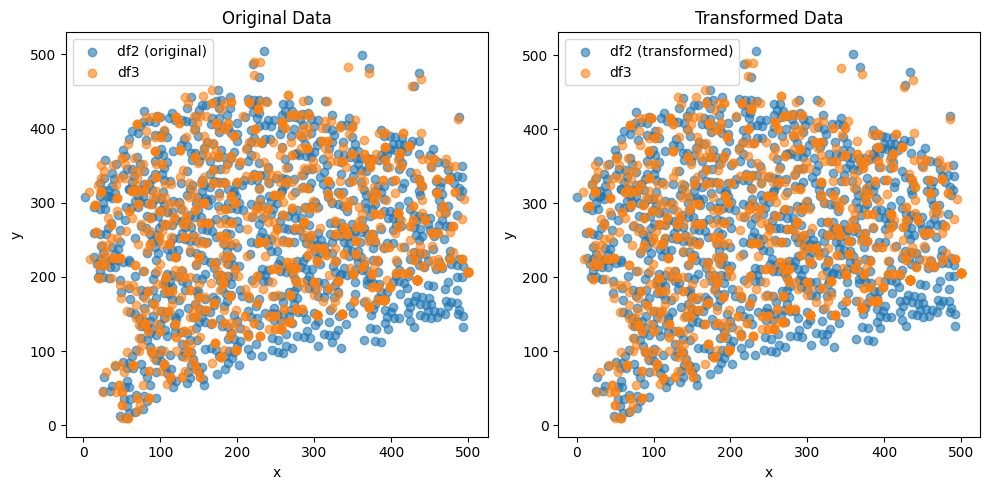

C:\Users\28123\AppData\Local\Temp\ipykernel_19716\1838888091.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_19716\1838888091.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (986,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.7978700633731675 , 0.700401695778178 )
Rotation (radians): 0.004391562702783782
Transform Matrix:
 [[ 0.99999036 -0.00439155  0.79787006]
 [ 0.00439155  0.99999036  0.7004017 ]
 [ 0.          0.          1.        ]]


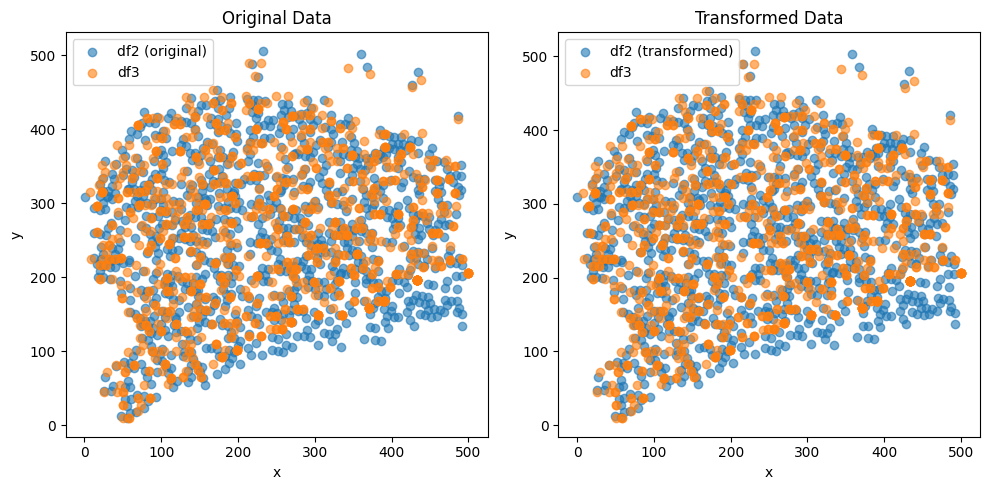

C:\Users\28123\AppData\Local\Temp\ipykernel_19716\1838888091.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_19716\1838888091.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (985,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.765804705576288 , 0.6693874136282916 )
Rotation (radians): 0.003971839587913151
Transform Matrix:
 [[ 0.99999211 -0.00397183  0.76580471]
 [ 0.00397183  0.99999211  0.66938741]
 [ 0.          0.          1.        ]]


KeyboardInterrupt: 

In [15]:
dist_min = 1  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

min_row_indices (670,)


C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


Optimal Translation and Rotation Parameters:
Translation: ( -3.6702937393097215e-06 , 3.2660689027053692e-06 )
Rotation (radians): -0.0003570805881920785
Transform Matrix:
 [[ 9.99999936e-01  3.57080581e-04 -3.67029374e-06]
 [-3.57080581e-04  9.99999936e-01  3.26606890e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


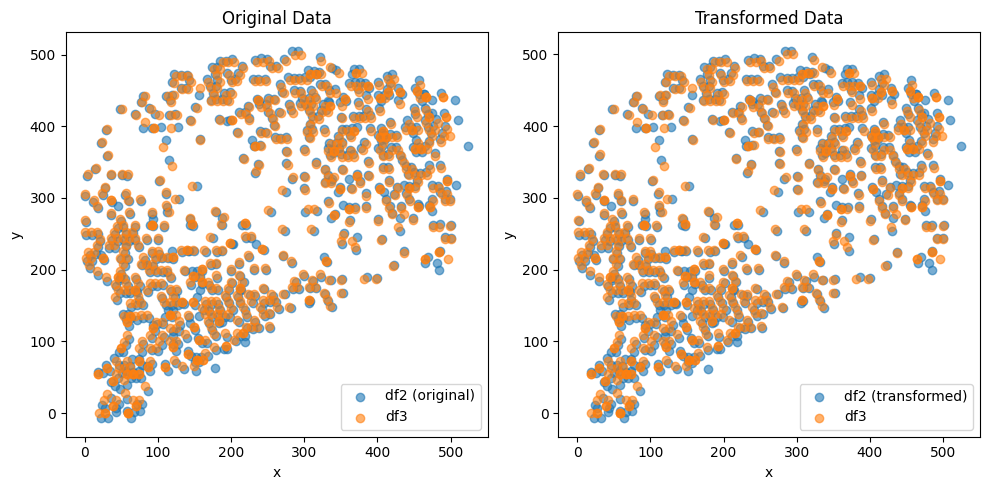

              0           1
0    327.776744  322.500438
1    322.557979  422.972358
2    407.476795  359.764547
3    312.774615  253.606123
4     62.492147   48.577699
..          ...         ...
995  200.164464  198.697121
996  332.958201  435.788985
997   53.501420  377.974168
998  286.342250  450.174719
999  247.733755  199.952828

[1000 rows x 2 columns]


In [1295]:
dist_min = 2  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

min_row_indices (454,)
Optimal Translation and Rotation Parameters:
Translation: ( -7.325722549316482e-06 , 6.500951548620997e-06 )
Rotation (radians): -0.0003968529399691362
Transform Matrix:
 [[ 9.99999921e-01  3.96852930e-04 -7.32572255e-06]
 [-3.96852930e-04  9.99999921e-01  6.50095155e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


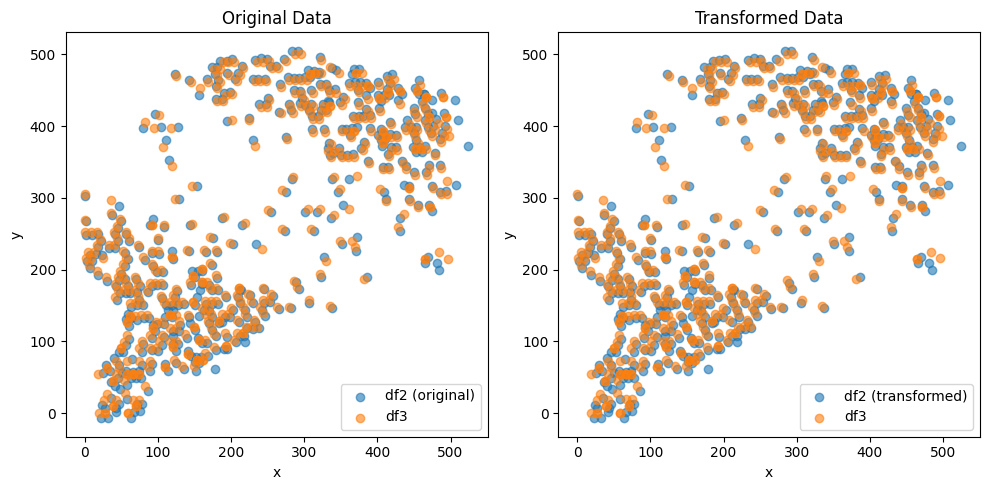

              0           1
0    327.904696  322.370340
1    322.725804  422.844323
2    407.619530  359.602817
3    312.875227  253.481984
4     62.511413   48.552901
..          ...         ...
995  200.243294  198.617676
996  333.131111  435.656821
997   53.651409  377.952913
998  286.520873  450.061054
999  247.813080  199.854505

[1000 rows x 2 columns]


In [1296]:
dist_min = 3  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

min_row_indices (139,)


C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


Optimal Translation and Rotation Parameters:
Translation: ( -2.8057507753620086 , 5.115880637753015 )
Rotation (radians): -0.012347801705327897
Transform Matrix:
 [[ 0.99992377  0.01234749 -2.80575078]
 [-0.01234749  0.99992377  5.11588064]
 [ 0.          0.          1.        ]]


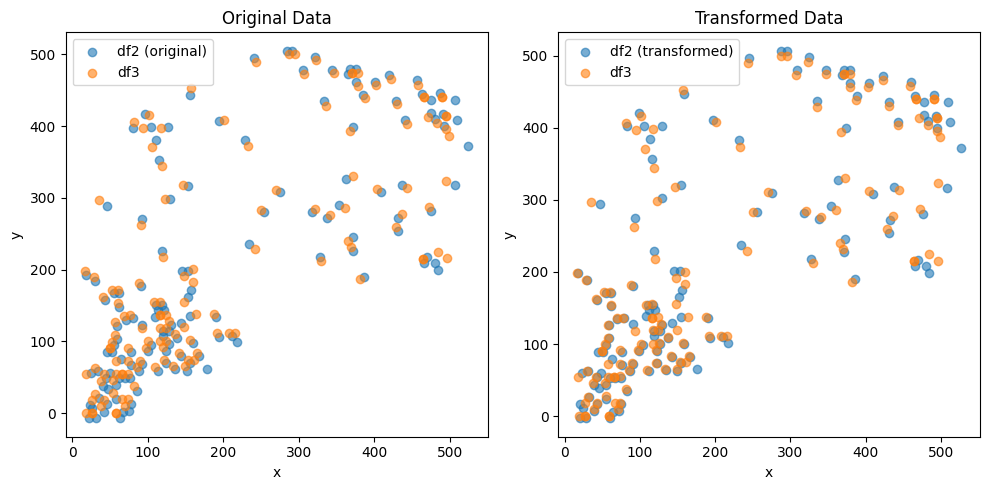

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (105,)
Optimal Translation and Rotation Parameters:
Translation: ( -1.8511027208533248 , -2.5800996385978796 )
Rotation (radians): -0.0010283300934943367
Transform Matrix:
 [[ 9.99999471e-01  1.02832991e-03 -1.85110272e+00]
 [-1.02832991e-03  9.99999471e-01 -2.58009964e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


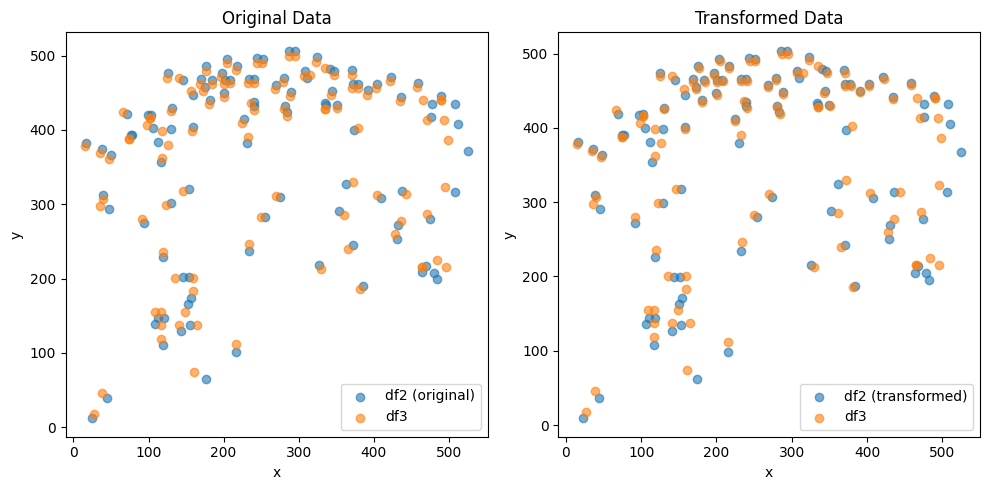

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 6.356945080702132e-06 , 5.3320522615376686e-05 )
Rotation (radians): 0.005342583961636142
Transform Matrix:
 [[ 9.99985728e-01 -5.34255855e-03  6.35694508e-06]
 [ 5.34255855e-03  9.99985728e-01  5.33205226e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


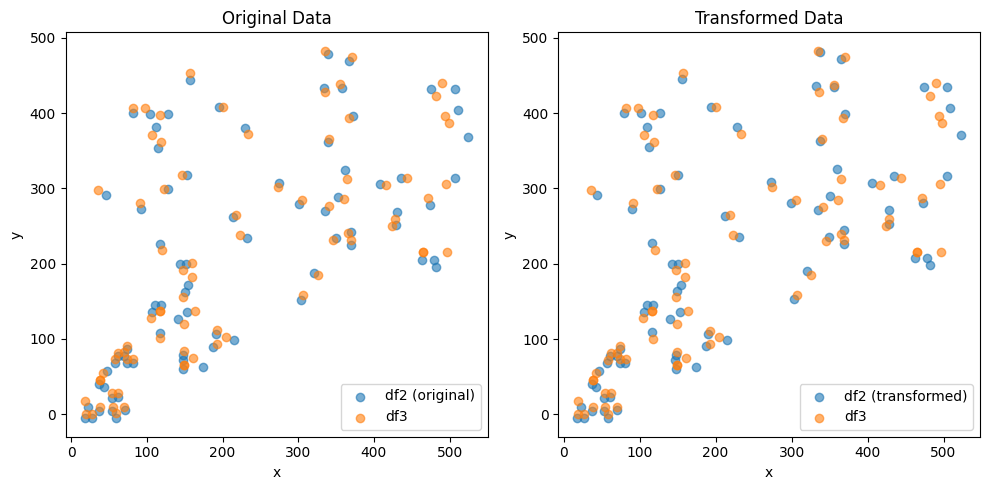

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (103,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.927376214179312e-06 , 6.912702384922832e-06 )
Rotation (radians): -0.003756144264190299
Transform Matrix:
 [[ 9.99992946e-01  3.75613543e-03  5.92737621e-06]
 [-3.75613543e-03  9.99992946e-01  6.91270238e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


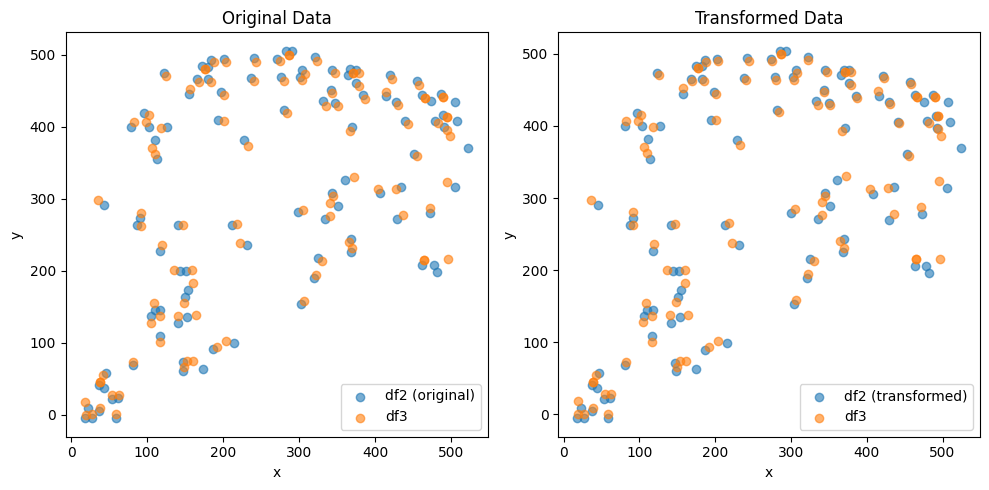

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (73,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.406451309323668e-05 , 8.290751689476076e-05 )
Rotation (radians): 0.009986709734977018
Transform Matrix:
 [[ 9.99950133e-01 -9.98654373e-03  2.40645131e-05]
 [ 9.98654373e-03  9.99950133e-01  8.29075169e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


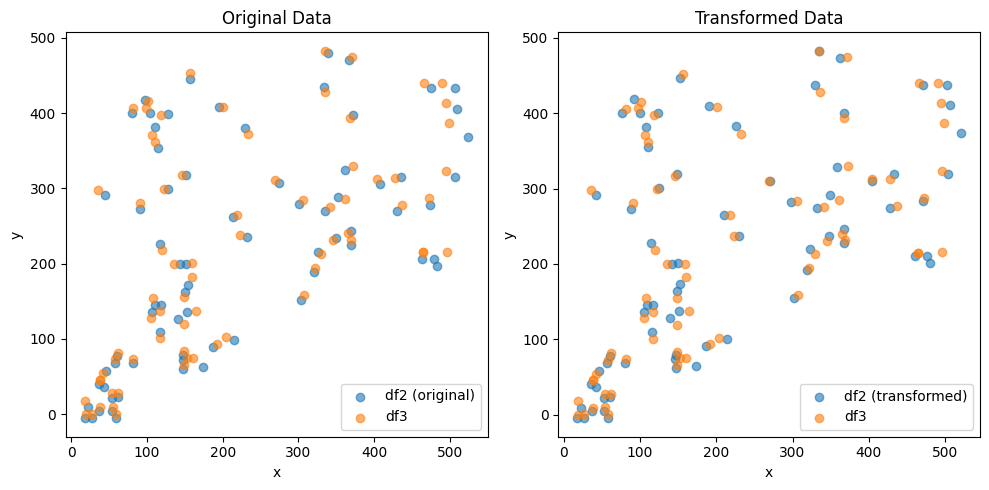

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (326,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.2557026497690815e-06 , -1.294720253554237e-05 )
Rotation (radians): -0.005748131185640881
Transform Matrix:
 [[ 9.99983480e-01  5.74809953e-03  5.25570265e-06]
 [-5.74809953e-03  9.99983480e-01 -1.29472025e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


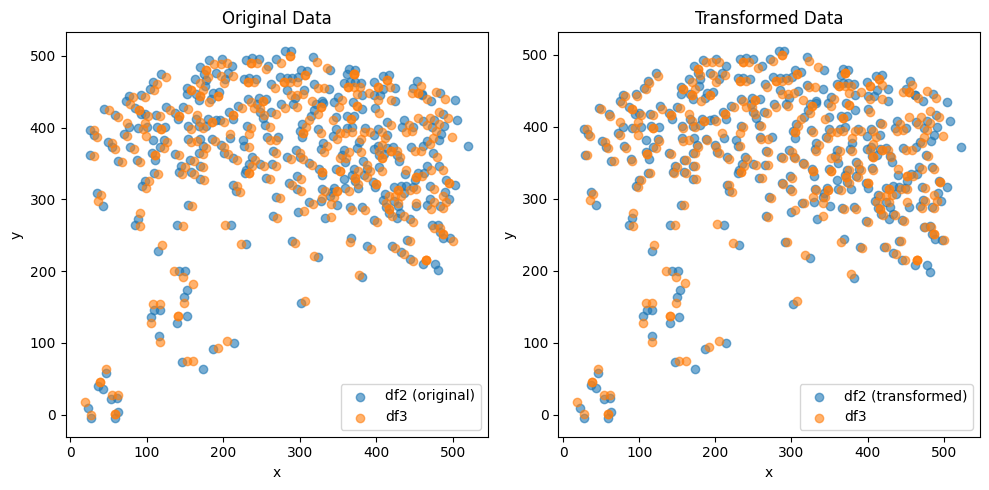

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (116,)
Optimal Translation and Rotation Parameters:
Translation: ( 4.0953202089598866e-07 , -4.558910270328785e-06 )
Rotation (radians): -0.005391731338807859
Transform Matrix:
 [[ 9.99985465e-01  5.39170522e-03  4.09532021e-07]
 [-5.39170522e-03  9.99985465e-01 -4.55891027e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


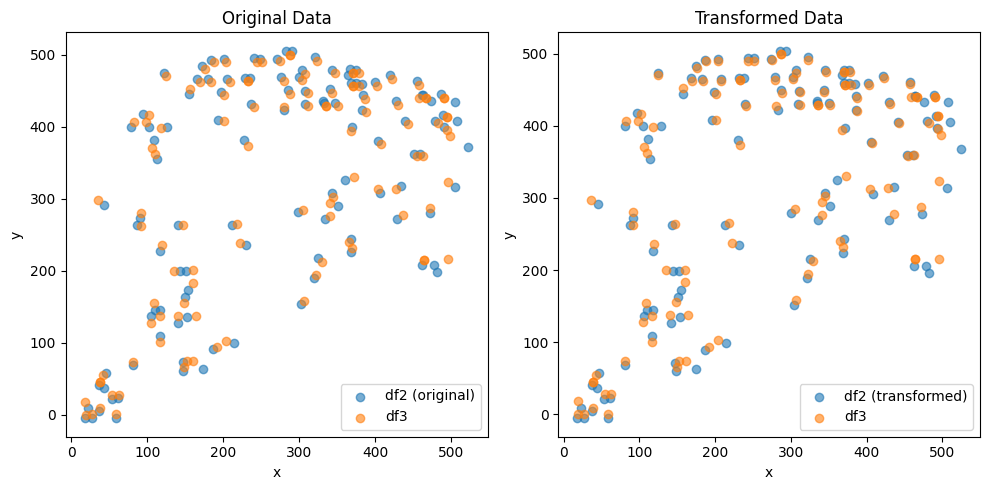

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.5828824225874433e-05 , 7.341525062483625e-05 )
Rotation (radians): 0.007131584476193975
Transform Matrix:
 [[ 9.99974570e-01 -7.13152402e-03  1.58288242e-05]
 [ 7.13152402e-03  9.99974570e-01  7.34152506e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


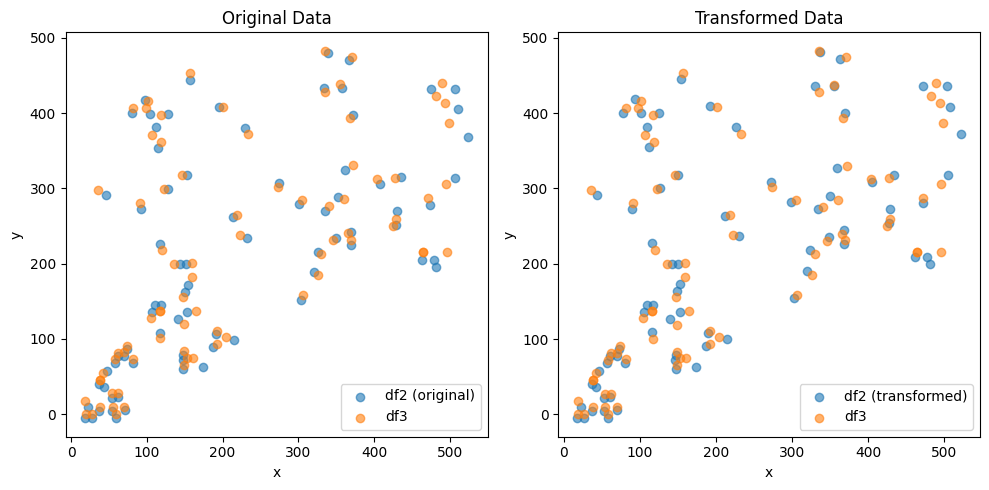

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (177,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4944353490971875e-06 , -2.0542913891092747e-05 )
Rotation (radians): -0.005897366666862483
Transform Matrix:
 [[ 9.99982611e-01  5.89733248e-03 -3.49443535e-06]
 [-5.89733248e-03  9.99982611e-01 -2.05429139e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


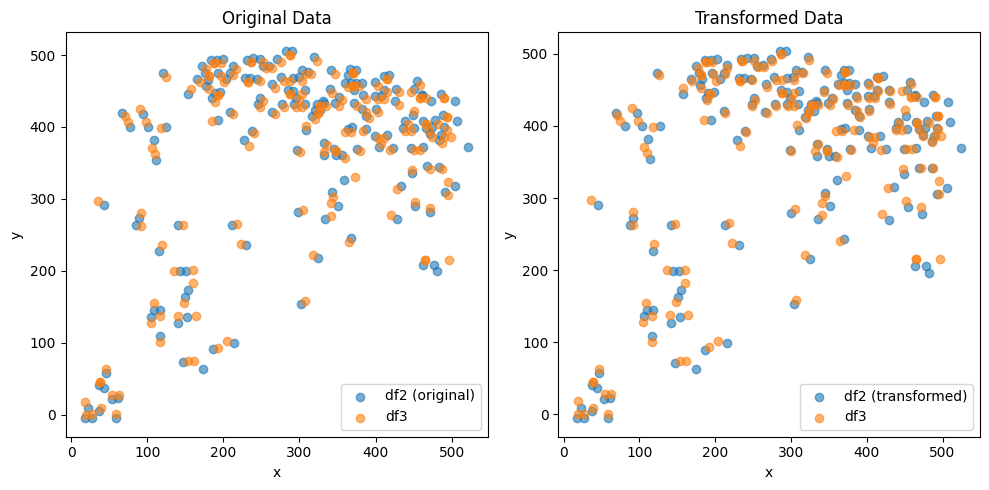

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (72,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.9581935011425845e-05 , 8.961164965629807e-05 )
Rotation (radians): 0.009873695345479074
Transform Matrix:
 [[ 9.99951255e-01 -9.87353492e-03  2.95819350e-05]
 [ 9.87353492e-03  9.99951255e-01  8.96116497e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


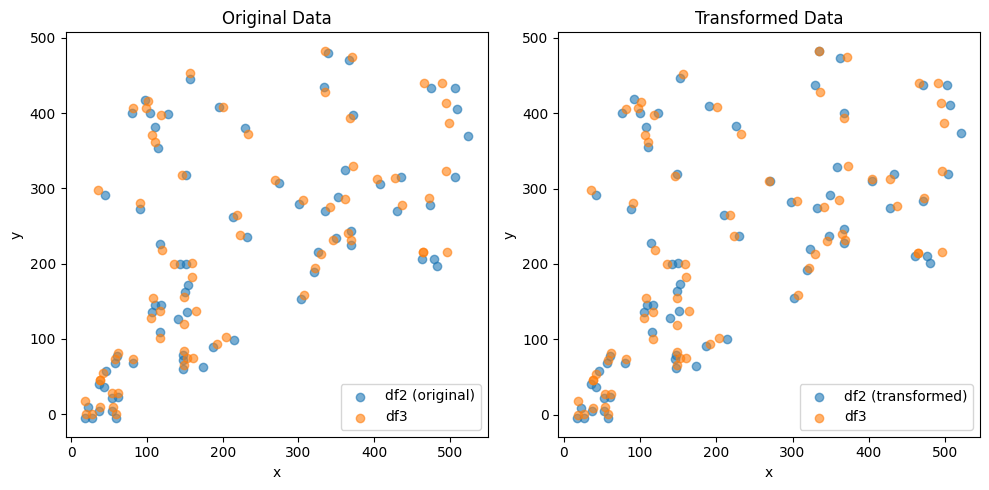

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (327,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.184302652139942e-06 , -1.318006652240301e-05 )
Rotation (radians): -0.005828987208152883
Transform Matrix:
 [[ 9.99983012e-01  5.82895420e-03  5.18430265e-06]
 [-5.82895420e-03  9.99983012e-01 -1.31800665e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


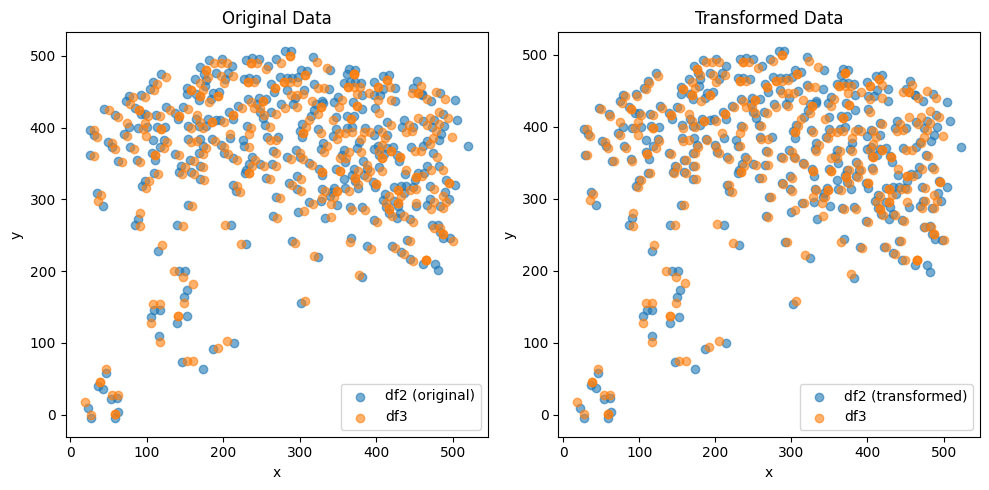

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (115,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.7865697441091348e-06 , -2.1996119964490155e-06 )
Rotation (radians): -0.005266001066179165
Transform Matrix:
 [[ 9.99986135e-01  5.26597673e-03  1.78656974e-06]
 [-5.26597673e-03  9.99986135e-01 -2.19961200e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


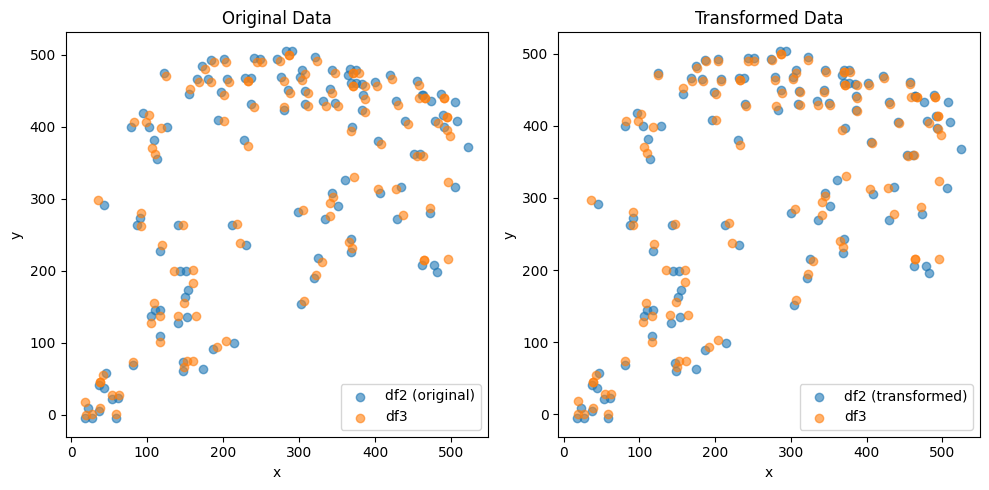

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.57871198792057e-05 , 7.332249882650357e-05 )
Rotation (radians): 0.007118477490994865
Transform Matrix:
 [[ 9.99974664e-01 -7.11841737e-03  1.57871199e-05]
 [ 7.11841737e-03  9.99974664e-01  7.33224988e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


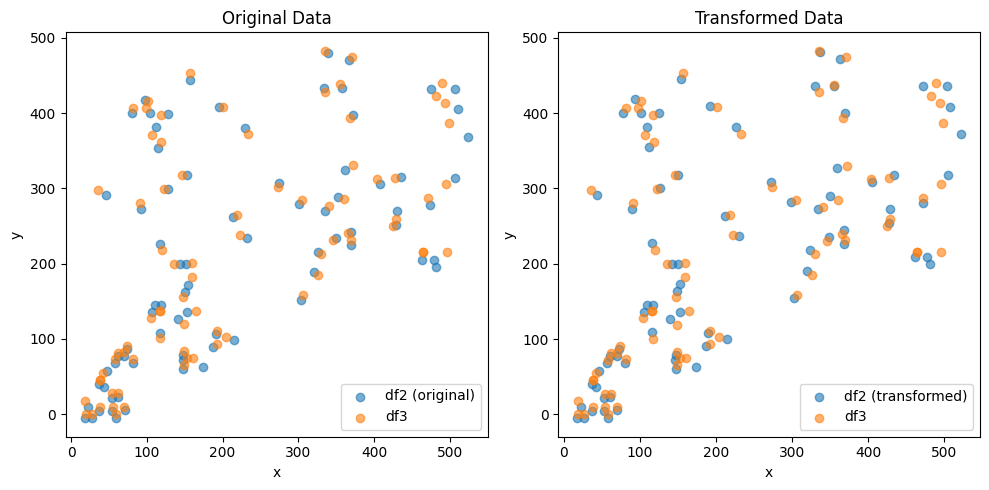

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (177,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4692905911164673e-06 , -2.0547143420433656e-05 )
Rotation (radians): -0.005897291532269635
Transform Matrix:
 [[ 9.99982611e-01  5.89725735e-03 -3.46929059e-06]
 [-5.89725735e-03  9.99982611e-01 -2.05471434e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


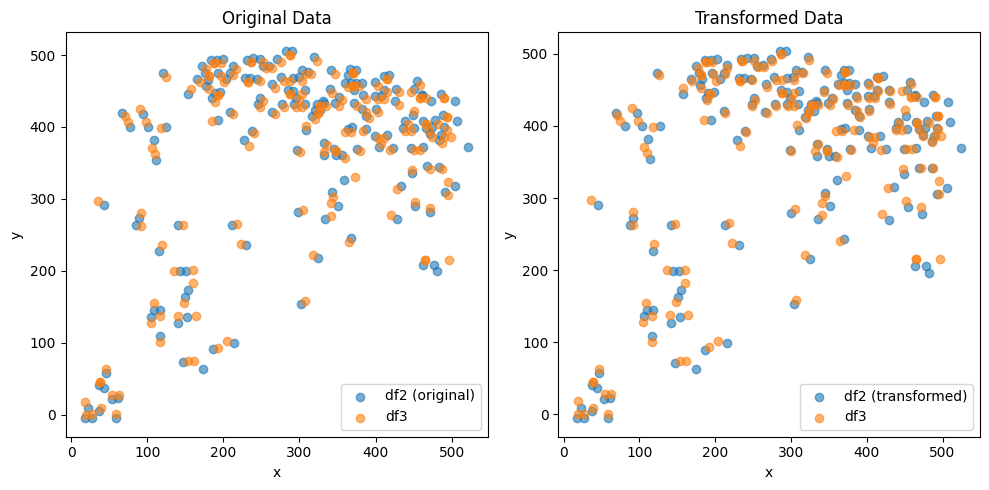

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (72,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.959683907071084e-05 , 8.9683689485936e-05 )
Rotation (radians): 0.009873737051589268
Transform Matrix:
 [[ 9.99951255e-01 -9.87357662e-03  2.95968391e-05]
 [ 9.87357662e-03  9.99951255e-01  8.96836895e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


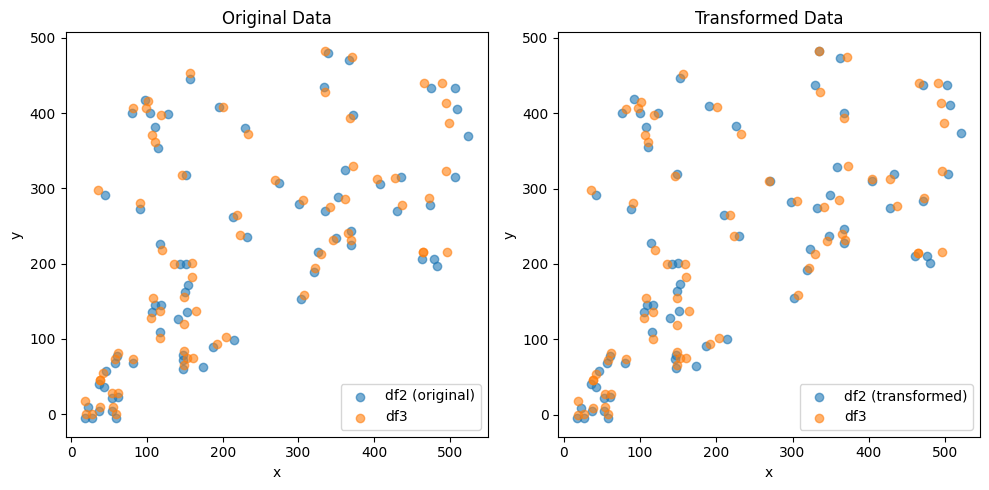

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (327,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.17651427401495e-06 , -1.3138737328263547e-05 )
Rotation (radians): -0.005829063799804811
Transform Matrix:
 [[ 9.99983011e-01  5.82903079e-03  5.17651427e-06]
 [-5.82903079e-03  9.99983011e-01 -1.31387373e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


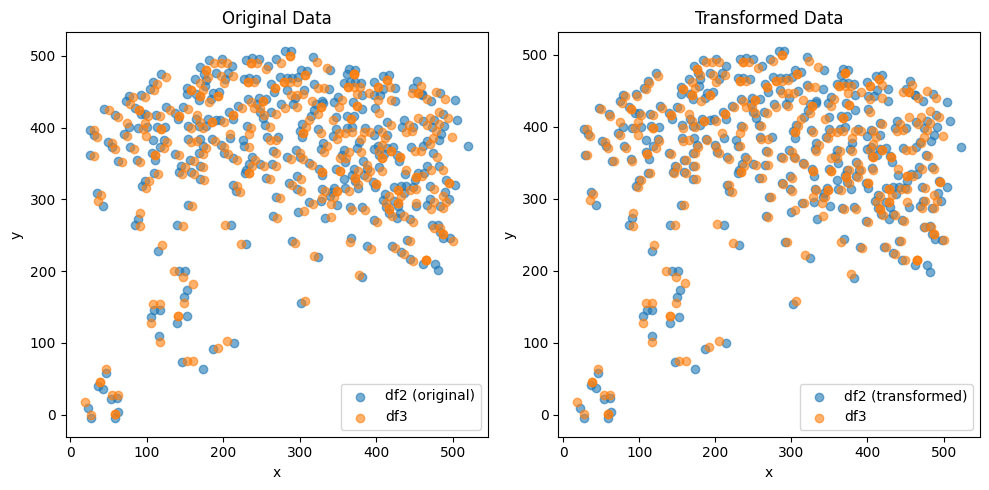

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (115,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.7204417466783738e-06 , -2.194258041941514e-06 )
Rotation (radians): -0.0052659660787514615
Transform Matrix:
 [[ 9.99986135e-01  5.26594174e-03  1.72044175e-06]
 [-5.26594174e-03  9.99986135e-01 -2.19425804e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


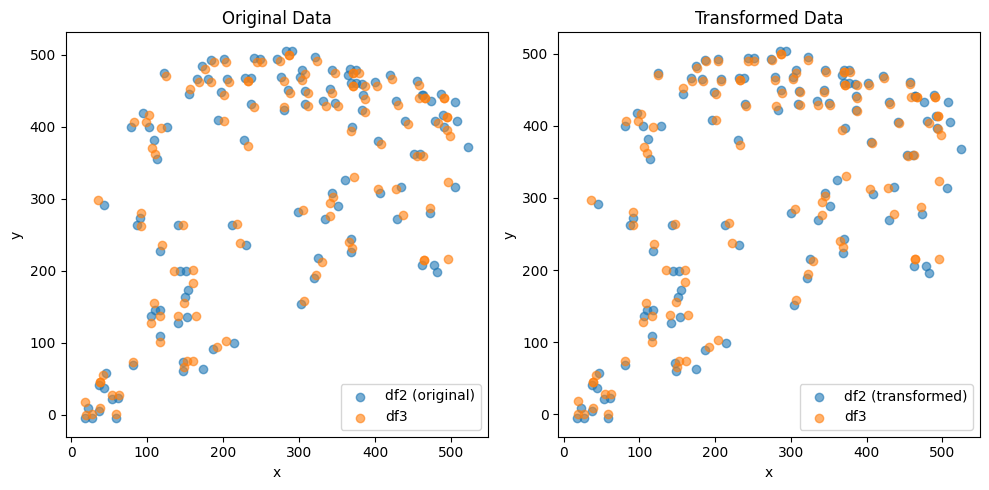

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.5859095960701274e-05 , 7.338731256792374e-05 )
Rotation (radians): 0.00711851554935319
Transform Matrix:
 [[ 9.99974663e-01 -7.11845543e-03  1.58590960e-05]
 [ 7.11845543e-03  9.99974663e-01  7.33873126e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


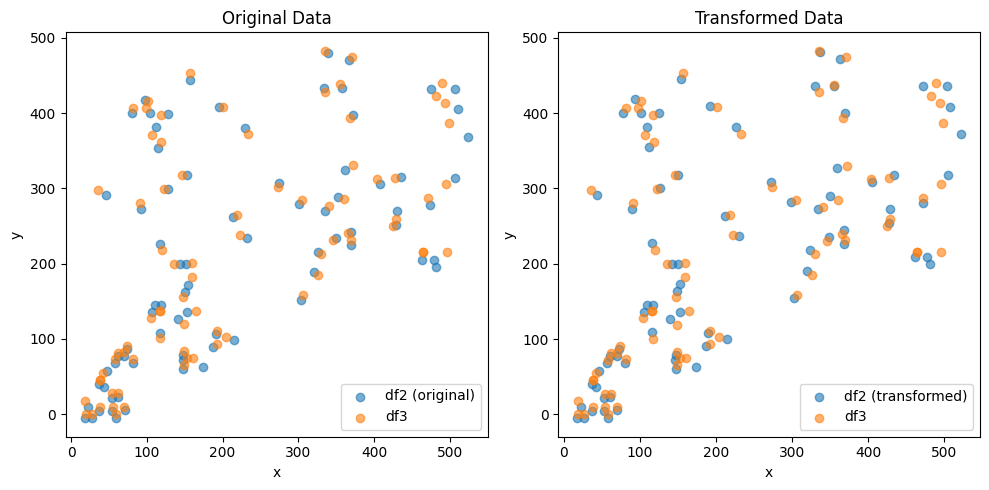

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (177,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4538016693532715e-06 , -2.053378329338251e-05 )
Rotation (radians): -0.005897337102025294
Transform Matrix:
 [[ 9.99982611e-01  5.89730292e-03 -3.45380167e-06]
 [-5.89730292e-03  9.99982611e-01 -2.05337833e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


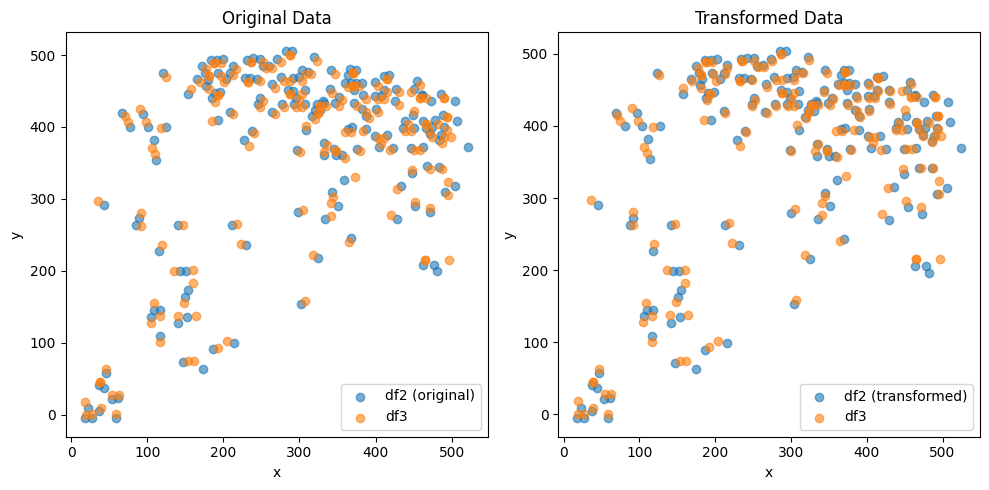

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (72,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.9551250251876698e-05 , 8.961223552120967e-05 )
Rotation (radians): 0.009873555421721462
Transform Matrix:
 [[ 9.99951257e-01 -9.87339500e-03  2.95512503e-05]
 [ 9.87339500e-03  9.99951257e-01  8.96122355e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


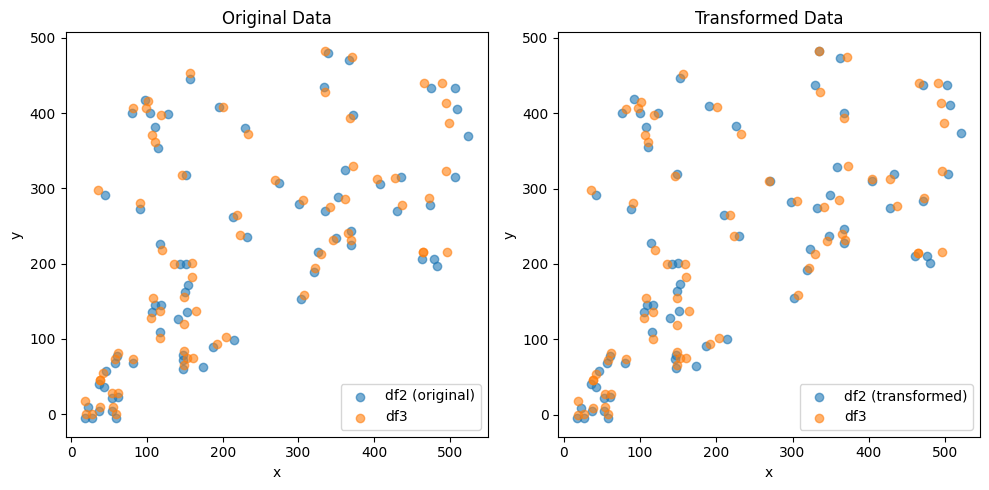

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (327,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.188603073465484e-06 , -1.3154147672070332e-05 )
Rotation (radians): -0.005828856926980892
Transform Matrix:
 [[ 9.99983012e-01  5.82882392e-03  5.18860307e-06]
 [-5.82882392e-03  9.99983012e-01 -1.31541477e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


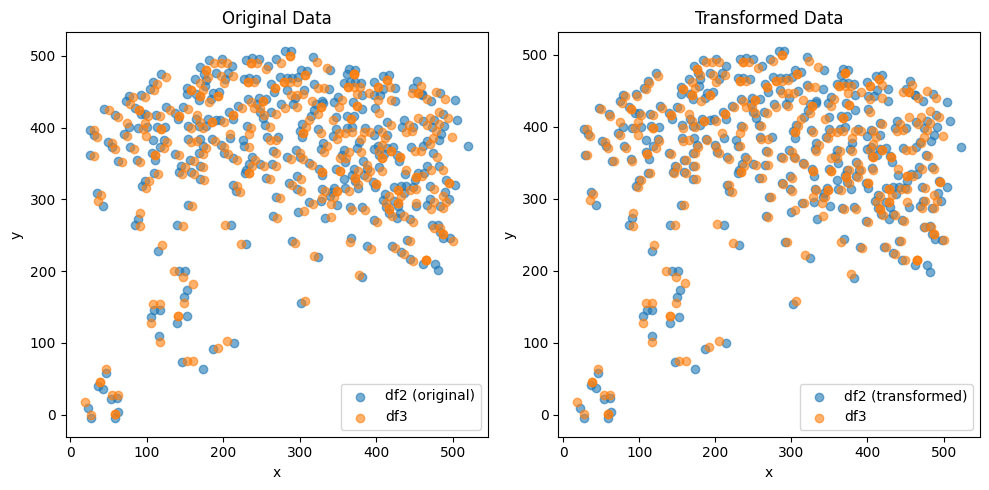

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (115,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.781871156375385e-06 , -2.210664609290754e-06 )
Rotation (radians): -0.005265963172423177
Transform Matrix:
 [[ 9.99986135e-01  5.26593883e-03  1.78187116e-06]
 [-5.26593883e-03  9.99986135e-01 -2.21066461e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


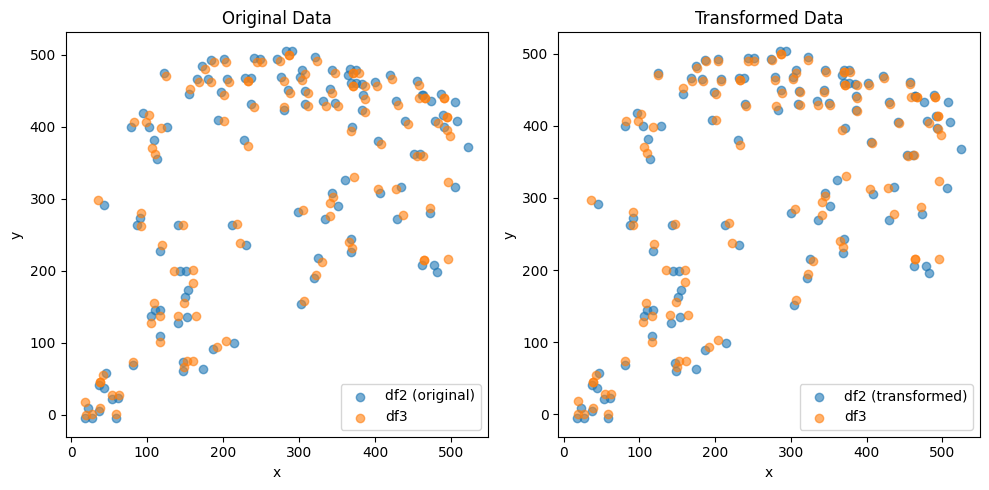

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.589371970875857e-05 , 7.334876747891296e-05 )
Rotation (radians): 0.007118383270662692
Transform Matrix:
 [[ 9.99974664e-01 -7.11832315e-03  1.58937197e-05]
 [ 7.11832315e-03  9.99974664e-01  7.33487675e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


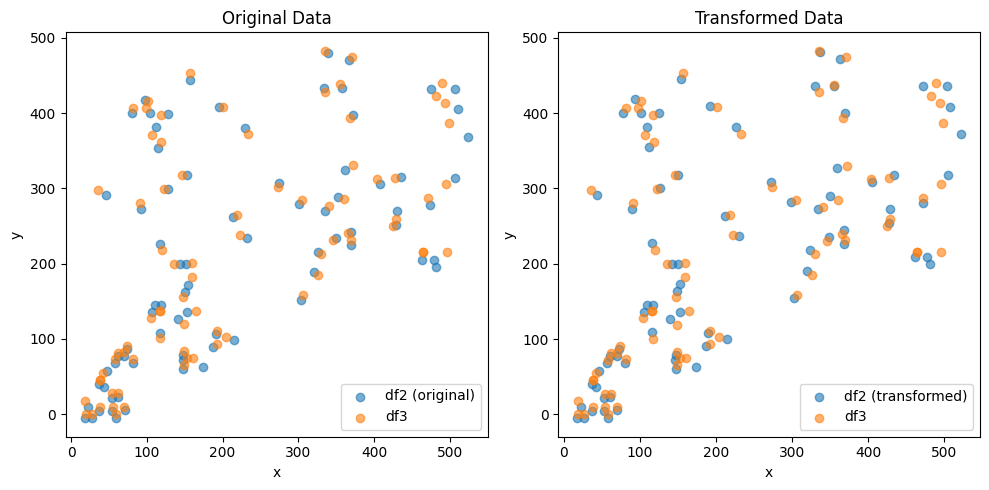

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (177,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4725047356832554e-06 , -2.052704728723623e-05 )
Rotation (radians): -0.005897212808900825
Transform Matrix:
 [[ 9.99982611e-01  5.89717863e-03 -3.47250474e-06]
 [-5.89717863e-03  9.99982611e-01 -2.05270473e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


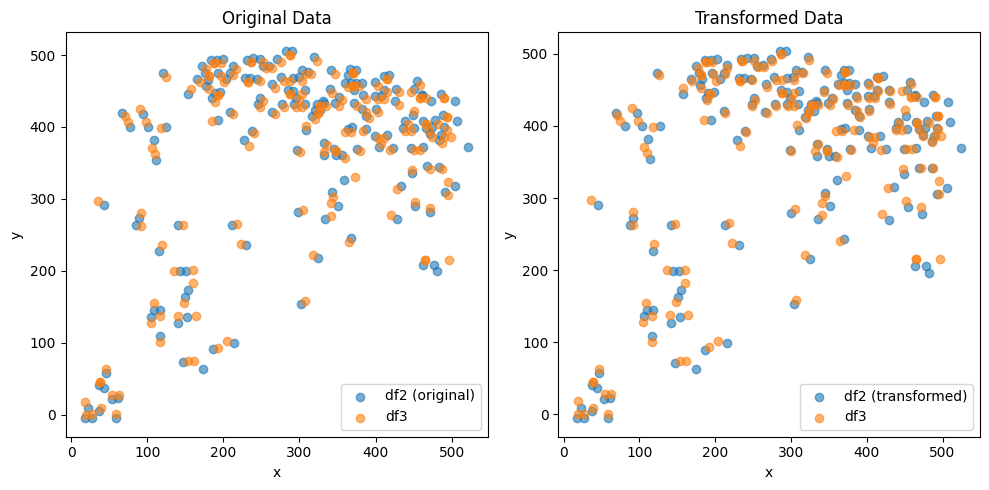

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (72,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.9453444982671916e-05 , 8.958058108885437e-05 )
Rotation (radians): 0.009873487881861471
Transform Matrix:
 [[ 9.99951258e-01 -9.87332746e-03  2.94534450e-05]
 [ 9.87332746e-03  9.99951258e-01  8.95805811e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


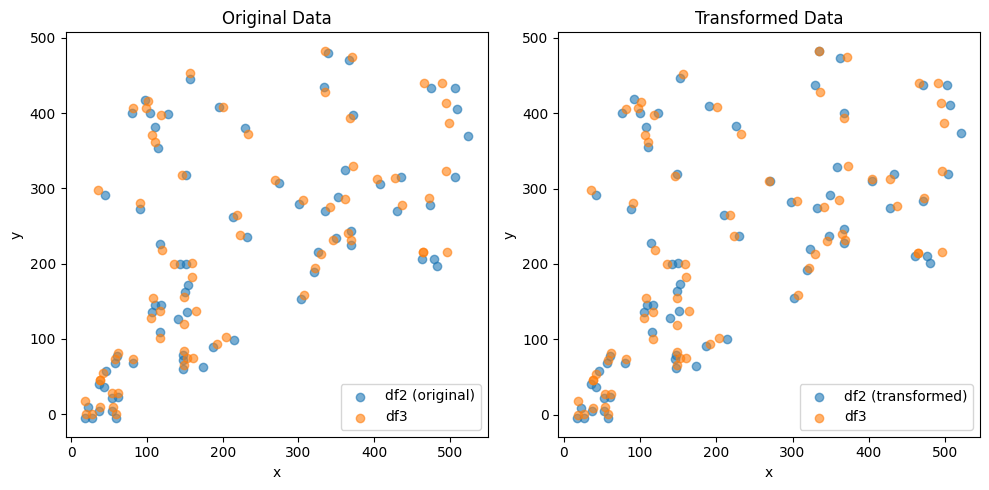

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (327,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.2313317916534995e-06 , -1.3128415039168002e-05 )
Rotation (radians): -0.005828804642543039
Transform Matrix:
 [[ 9.99983013e-01  5.82877164e-03  5.23133179e-06]
 [-5.82877164e-03  9.99983013e-01 -1.31284150e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


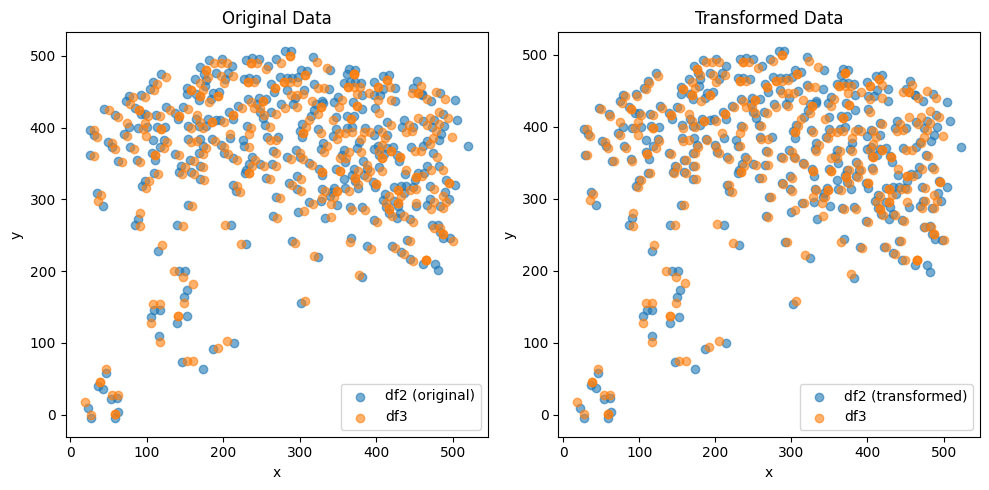

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (115,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.7108629216084772e-06 , -2.201793326335563e-06 )
Rotation (radians): -0.005265955340821929
Transform Matrix:
 [[ 9.99986135e-01  5.26593100e-03  1.71086292e-06]
 [-5.26593100e-03  9.99986135e-01 -2.20179333e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


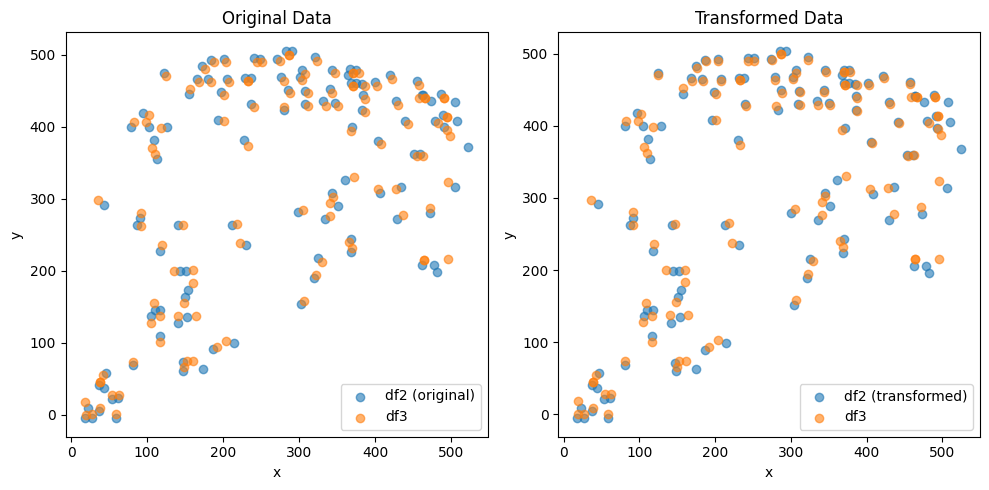

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.587377452229986e-05 , 7.335369128618865e-05 )
Rotation (radians): 0.007118356125805196
Transform Matrix:
 [[ 9.99974665e-01 -7.11829601e-03  1.58737745e-05]
 [ 7.11829601e-03  9.99974665e-01  7.33536913e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


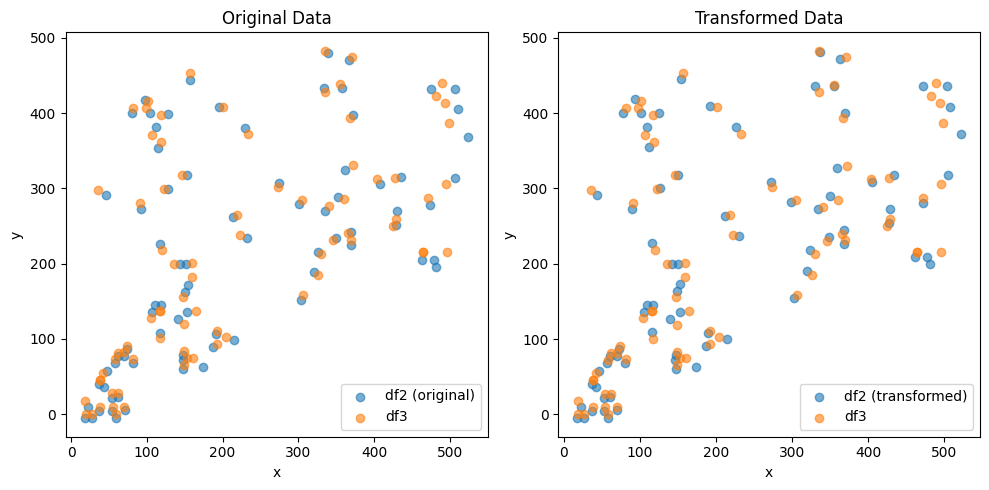

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (177,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.5027840892358995e-06 , -2.0598464262429737e-05 )
Rotation (radians): -0.005897219183052023
Transform Matrix:
 [[ 9.99982611e-01  5.89718500e-03 -3.50278409e-06]
 [-5.89718500e-03  9.99982611e-01 -2.05984643e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


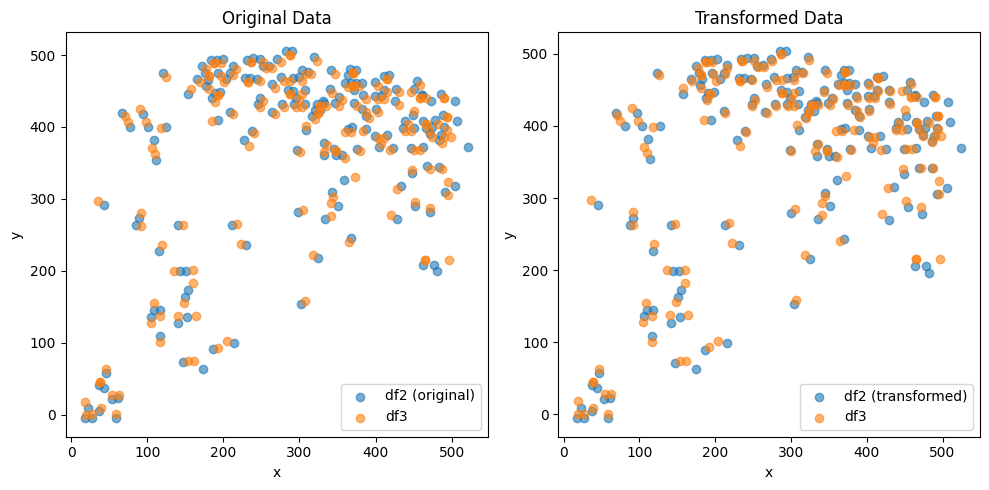

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (72,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.9440790886403032e-05 , 8.943359408229675e-05 )
Rotation (radians): 0.009873426995621305
Transform Matrix:
 [[ 9.99951258e-01 -9.87326658e-03  2.94407909e-05]
 [ 9.87326658e-03  9.99951258e-01  8.94335941e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


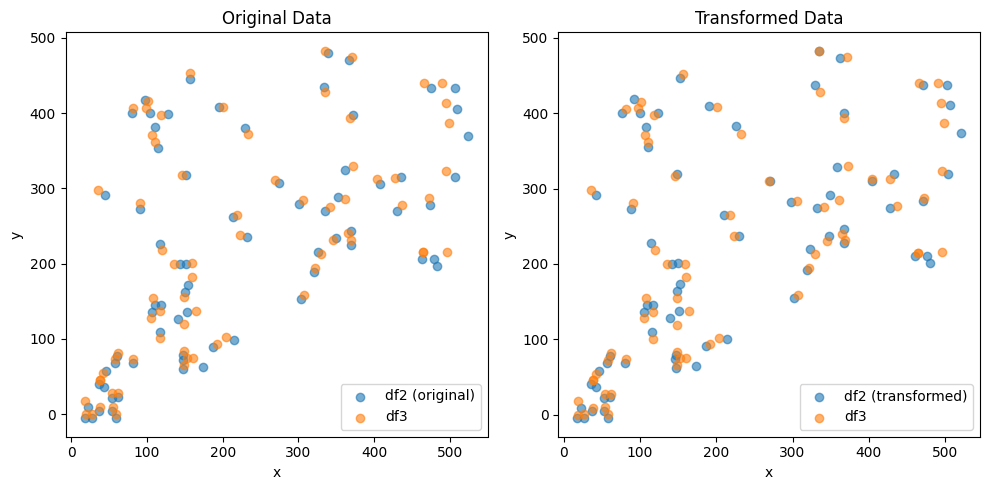

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (327,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.2141939653696604e-06 , -1.3145368981974663e-05 )
Rotation (radians): -0.005828731213955816
Transform Matrix:
 [[ 9.99983013e-01  5.82869821e-03  5.21419397e-06]
 [-5.82869821e-03  9.99983013e-01 -1.31453690e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


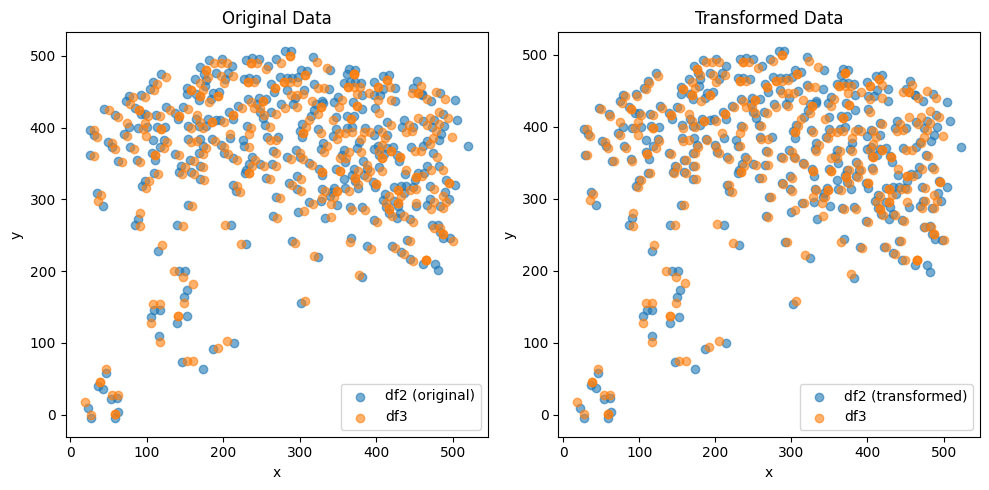

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (115,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.7132103152050834e-06 , -2.2264235994928594e-06 )
Rotation (radians): -0.005265934380317987
Transform Matrix:
 [[ 9.99986135e-01  5.26591004e-03  1.71321032e-06]
 [-5.26591004e-03  9.99986135e-01 -2.22642360e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


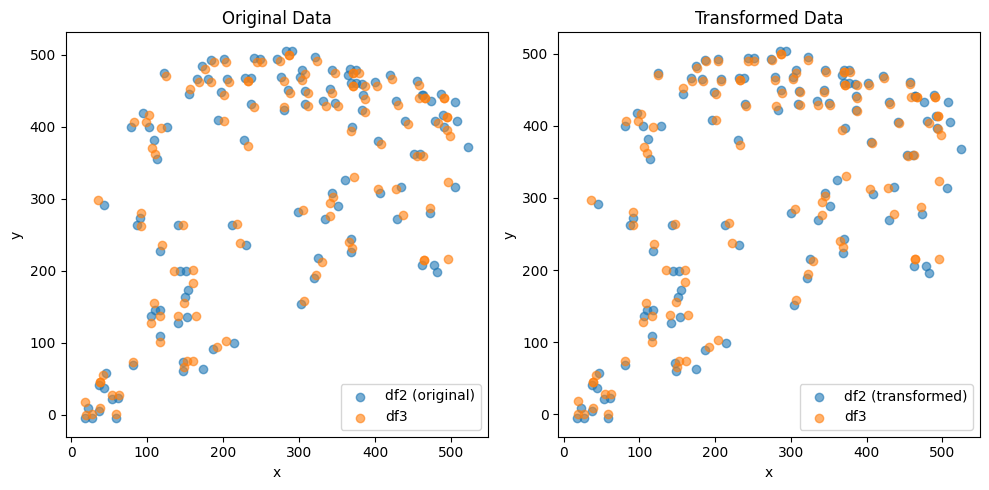

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.5850533518240894e-05 , 7.332154089280803e-05 )
Rotation (radians): 0.00711832465881772
Transform Matrix:
 [[ 9.99974665e-01 -7.11826454e-03  1.58505335e-05]
 [ 7.11826454e-03  9.99974665e-01  7.33215409e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


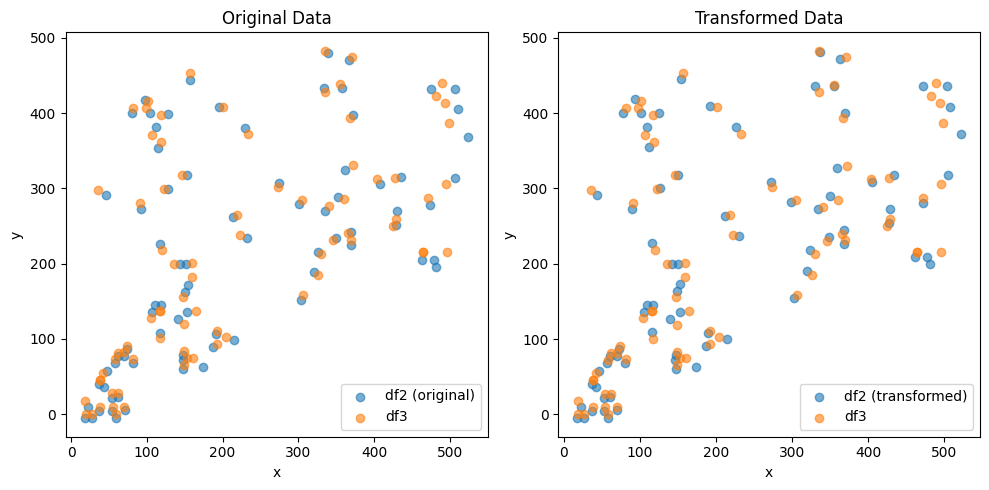

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (177,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.502300513350979e-06 , -2.056782402895663e-05 )
Rotation (radians): -0.005897188292503132
Transform Matrix:
 [[ 9.99982612e-01  5.89715411e-03 -3.50230051e-06]
 [-5.89715411e-03  9.99982612e-01 -2.05678240e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


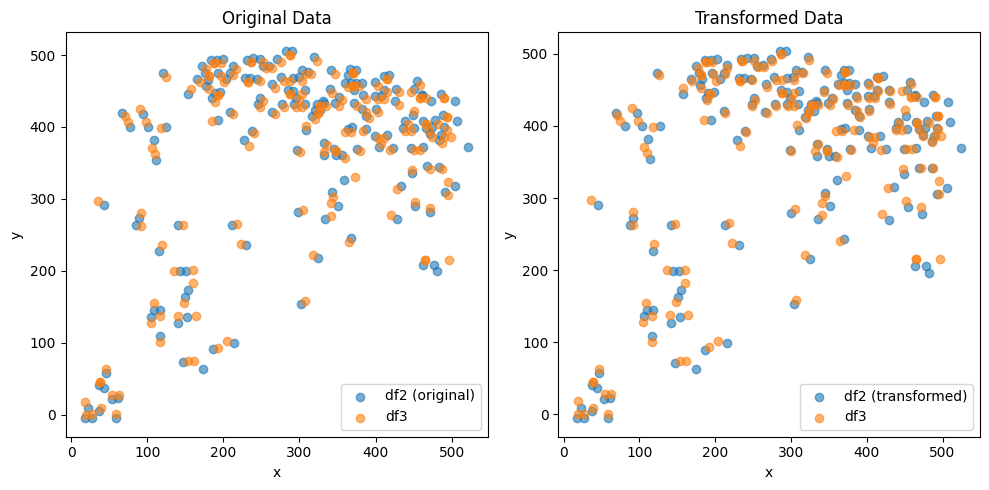

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (72,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.9507942501804372e-05 , 8.956025296593633e-05 )
Rotation (radians): 0.009873366313207267
Transform Matrix:
 [[ 9.99951259e-01 -9.87320590e-03  2.95079425e-05]
 [ 9.87320590e-03  9.99951259e-01  8.95602530e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


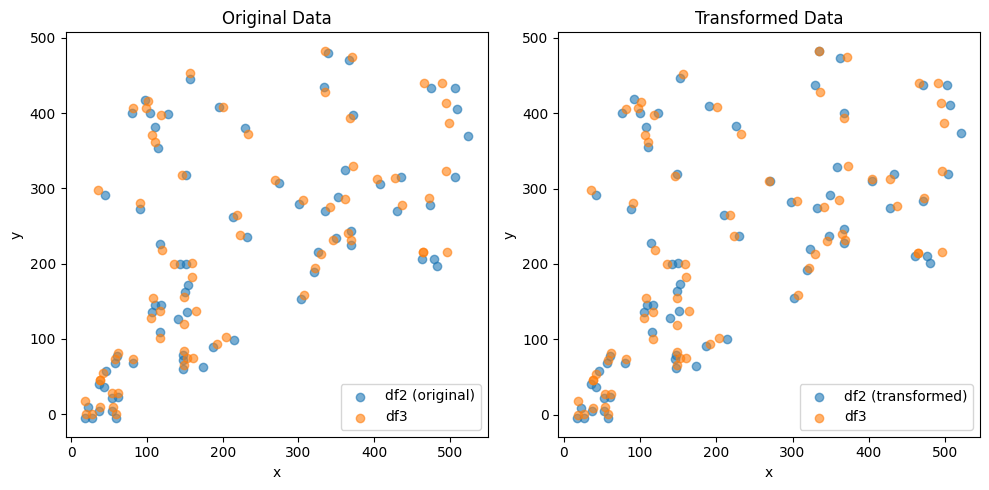

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (327,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.186826672116671e-06 , -1.3162933300996667e-05 )
Rotation (radians): -0.005828700300362306
Transform Matrix:
 [[ 9.99983013e-01  5.82866730e-03  5.18682667e-06]
 [-5.82866730e-03  9.99983013e-01 -1.31629333e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


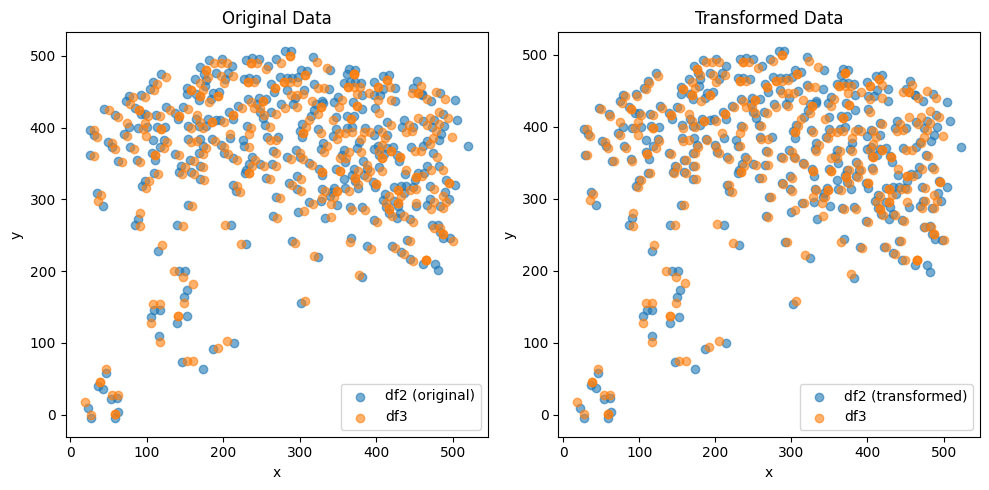

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (115,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.7490481957510778e-06 , -2.1655458469445518e-06 )
Rotation (radians): -0.005265883034308157
Transform Matrix:
 [[ 9.99986135e-01  5.26585870e-03  1.74904820e-06]
 [-5.26585870e-03  9.99986135e-01 -2.16554585e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


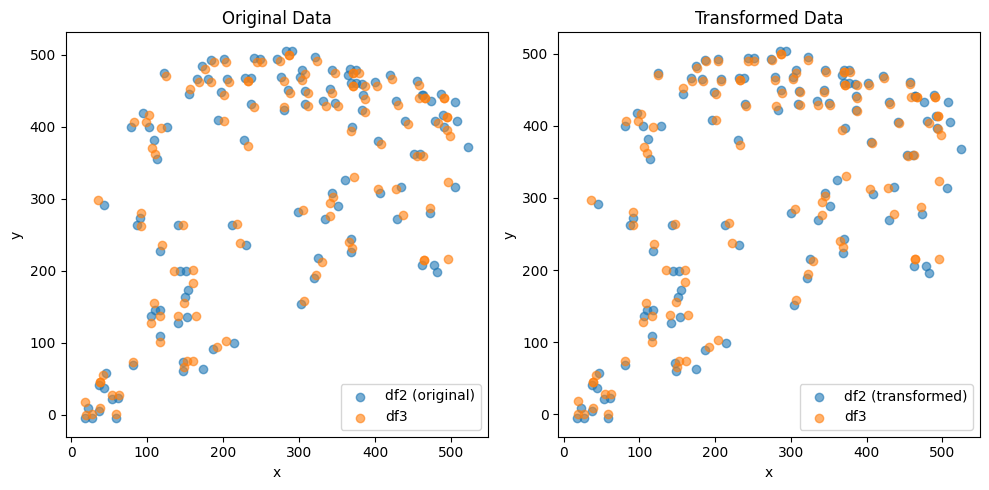

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.588320576620784e-05 , 7.344599928643025e-05 )
Rotation (radians): 0.007118285040932576
Transform Matrix:
 [[ 9.99974665e-01 -7.11822493e-03  1.58832058e-05]
 [ 7.11822493e-03  9.99974665e-01  7.34459993e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


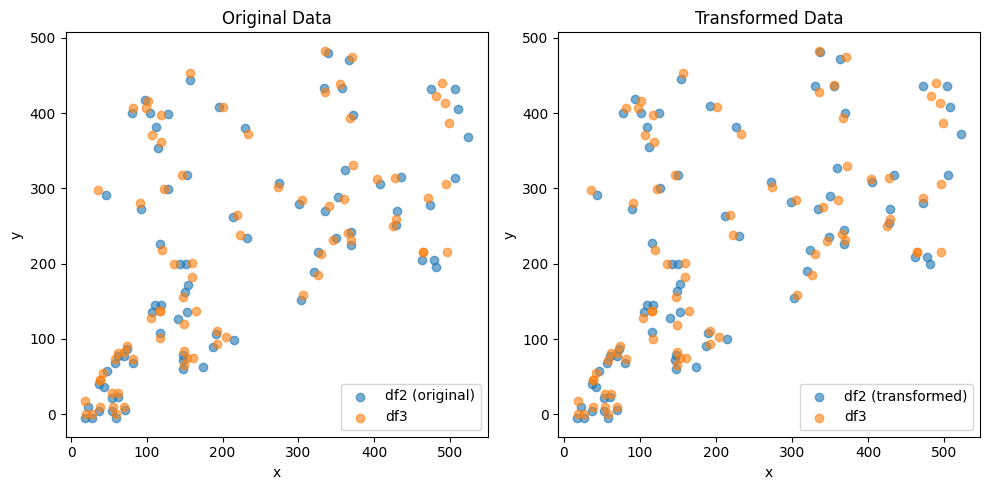

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (177,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4661112816800327e-06 , -2.0532506297117355e-05 )
Rotation (radians): -0.005897188770052108
Transform Matrix:
 [[ 9.99982612e-01  5.89715459e-03 -3.46611128e-06]
 [-5.89715459e-03  9.99982612e-01 -2.05325063e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


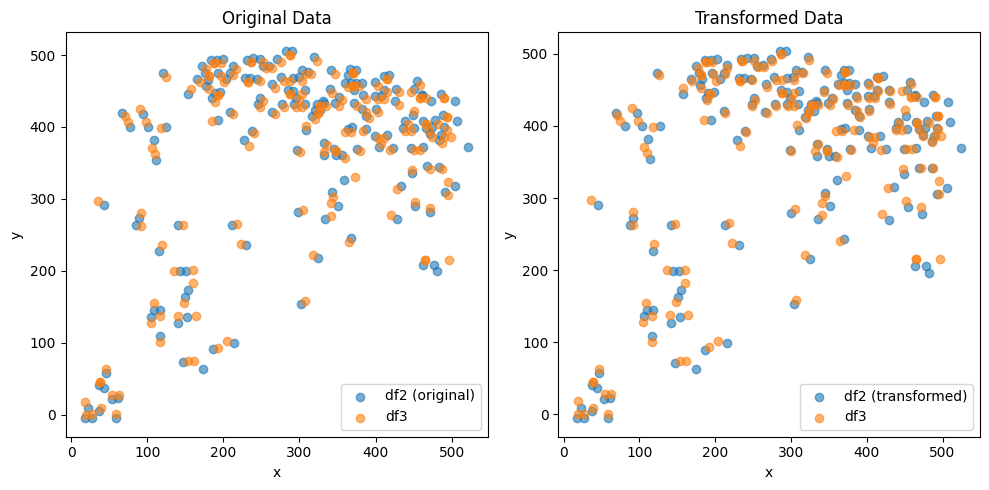

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (72,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.9504618787477025e-05 , 8.956320433468193e-05 )
Rotation (radians): 0.009873338027334618
Transform Matrix:
 [[ 9.99951259e-01 -9.87317761e-03  2.95046188e-05]
 [ 9.87317761e-03  9.99951259e-01  8.95632043e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


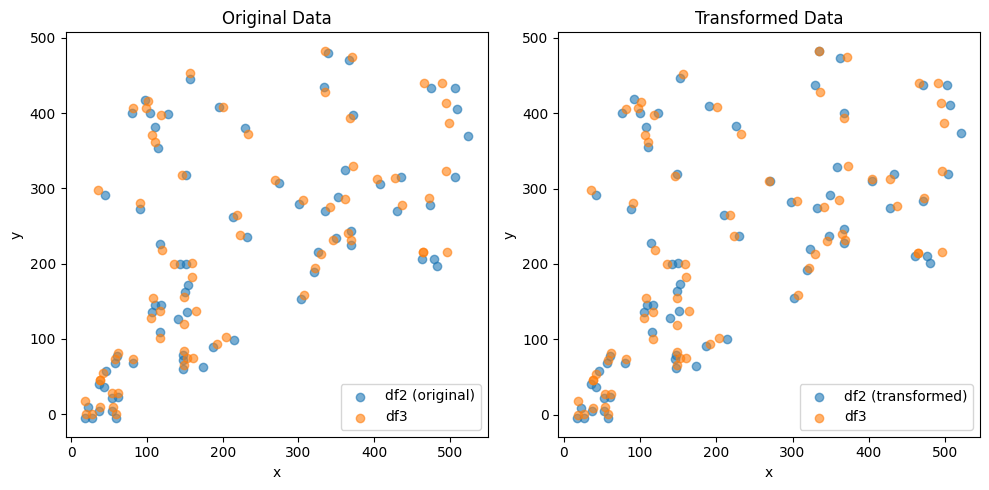

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (327,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.160233653543222e-06 , -1.31327707113544e-05 )
Rotation (radians): -0.005828697456514093
Transform Matrix:
 [[ 9.99983013e-01  5.82866445e-03  5.16023365e-06]
 [-5.82866445e-03  9.99983013e-01 -1.31327707e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


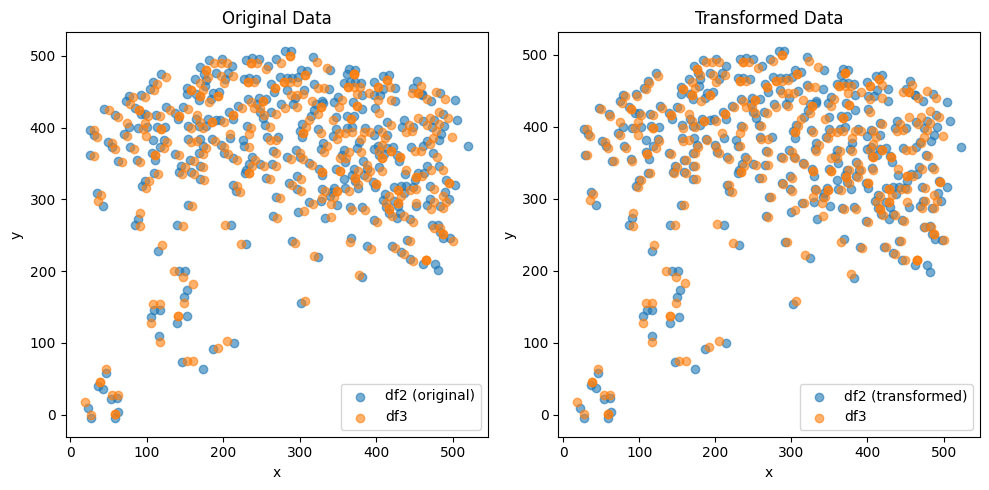

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (115,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.7095708381422886e-06 , -2.2138802971499952e-06 )
Rotation (radians): -0.005265849469553056
Transform Matrix:
 [[ 9.99986135e-01  5.26582513e-03  1.70957084e-06]
 [-5.26582513e-03  9.99986135e-01 -2.21388030e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


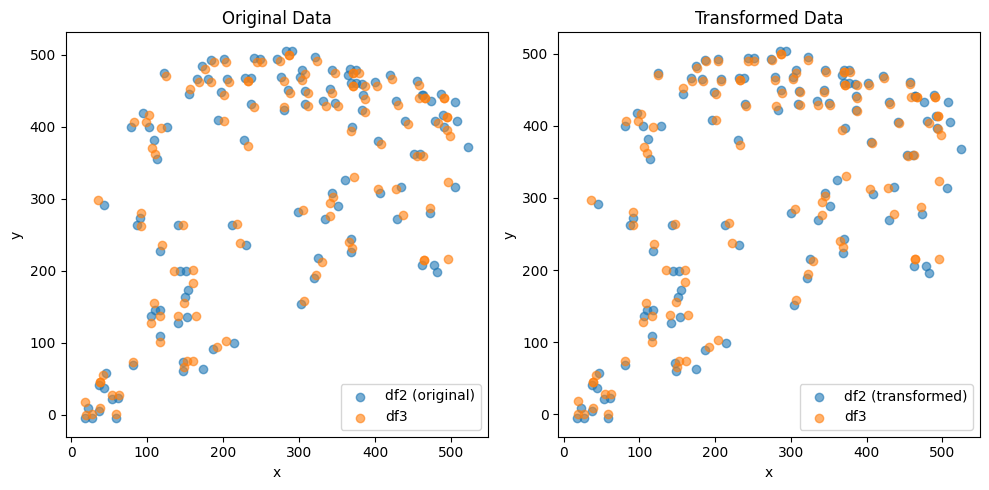

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.585012496918117e-05 , 7.33996048727279e-05 )
Rotation (radians): 0.007118178549304637
Transform Matrix:
 [[ 9.99974666e-01 -7.11811844e-03  1.58501250e-05]
 [ 7.11811844e-03  9.99974666e-01  7.33996049e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


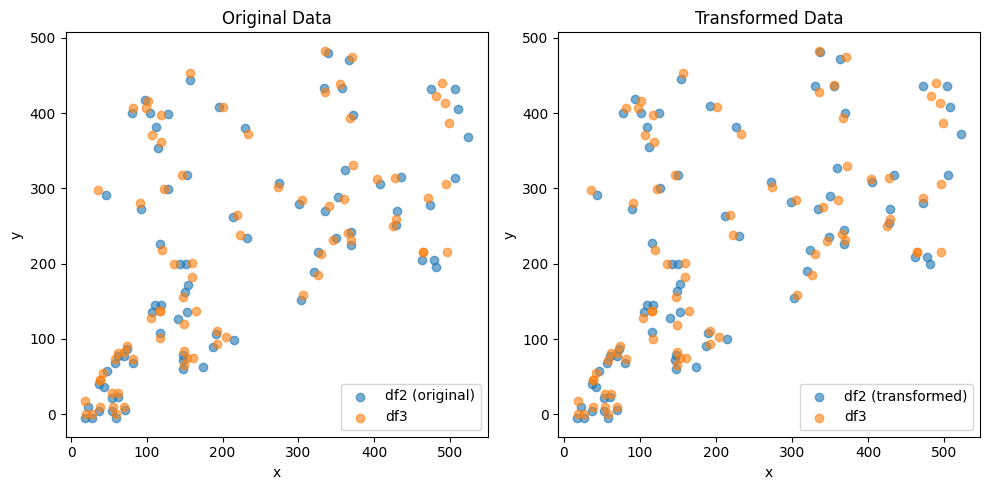

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (177,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.468430751108139e-06 , -2.0556399592273764e-05 )
Rotation (radians): -0.005897057032710582
Transform Matrix:
 [[ 9.99982612e-01  5.89702285e-03 -3.46843075e-06]
 [-5.89702285e-03  9.99982612e-01 -2.05563996e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


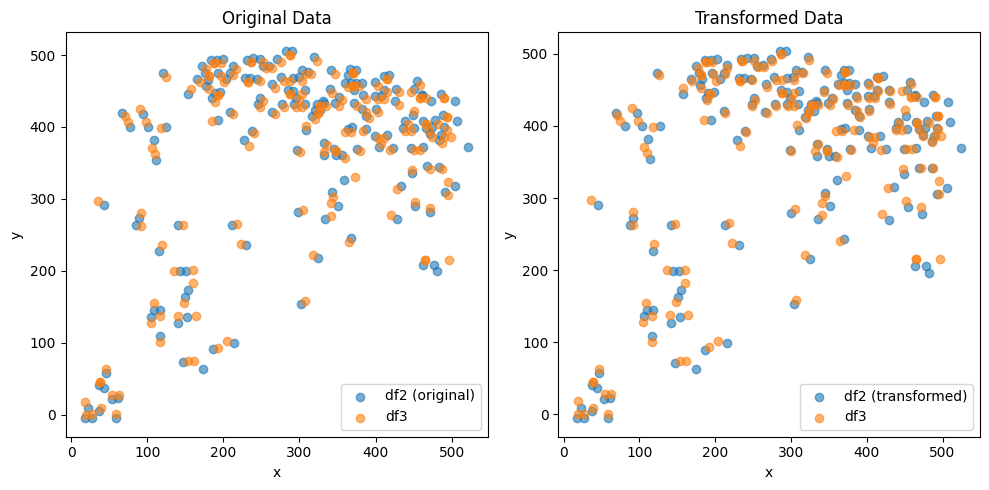

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (72,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.954957631098598e-05 , 8.961117272689893e-05 )
Rotation (radians): 0.00987329892116351
Transform Matrix:
 [[ 9.99951259e-01 -9.87313851e-03  2.95495763e-05]
 [ 9.87313851e-03  9.99951259e-01  8.96111727e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


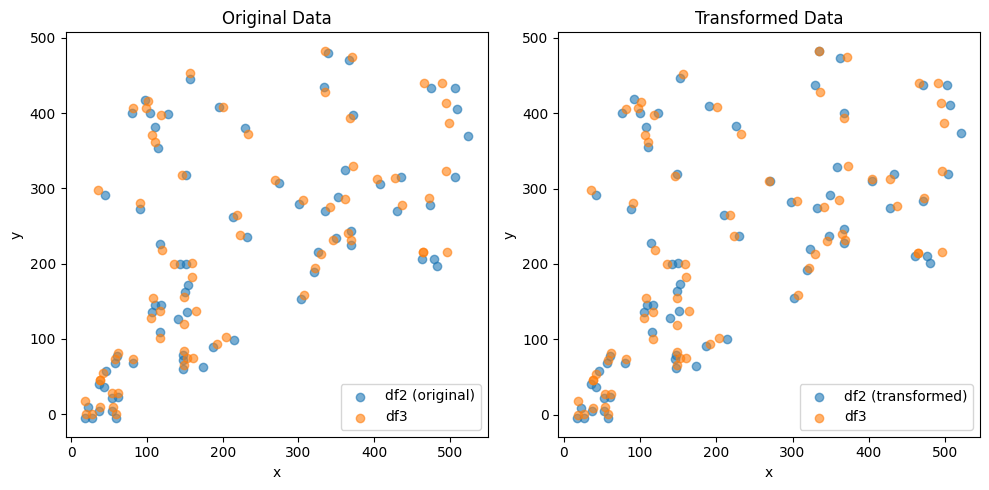

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (327,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.21131627018171e-06 , -1.3130052050389689e-05 )
Rotation (radians): -0.005828711222160954
Transform Matrix:
 [[ 9.99983013e-01  5.82867822e-03  5.21131627e-06]
 [-5.82867822e-03  9.99983013e-01 -1.31300521e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


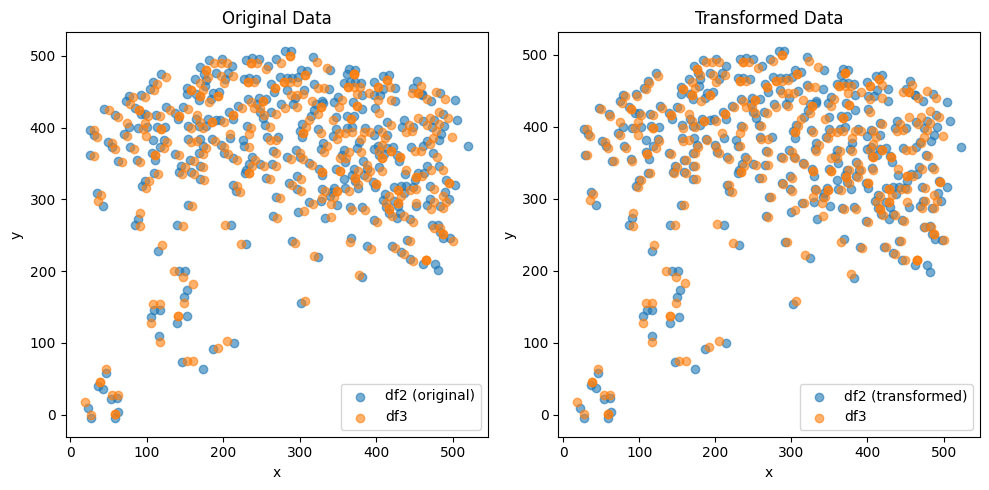

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (115,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.7809079295674532e-06 , -2.166385979931059e-06 )
Rotation (radians): -0.005265768803826296
Transform Matrix:
 [[ 9.99986136e-01  5.26574447e-03  1.78090793e-06]
 [-5.26574447e-03  9.99986136e-01 -2.16638598e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


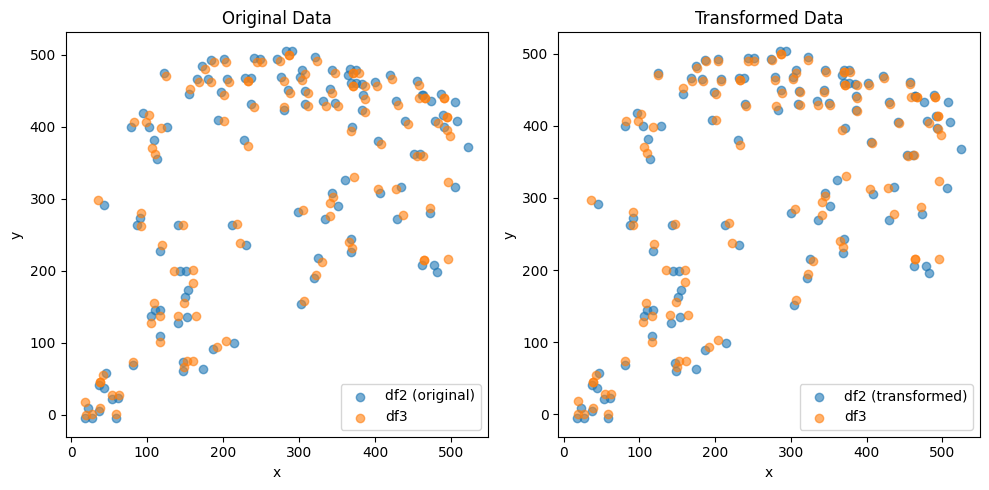

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.578462646906278e-05 , 7.331050602358042e-05 )
Rotation (radians): 0.007118120433171757
Transform Matrix:
 [[ 9.99974666e-01 -7.11806032e-03  1.57846265e-05]
 [ 7.11806032e-03  9.99974666e-01  7.33105060e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


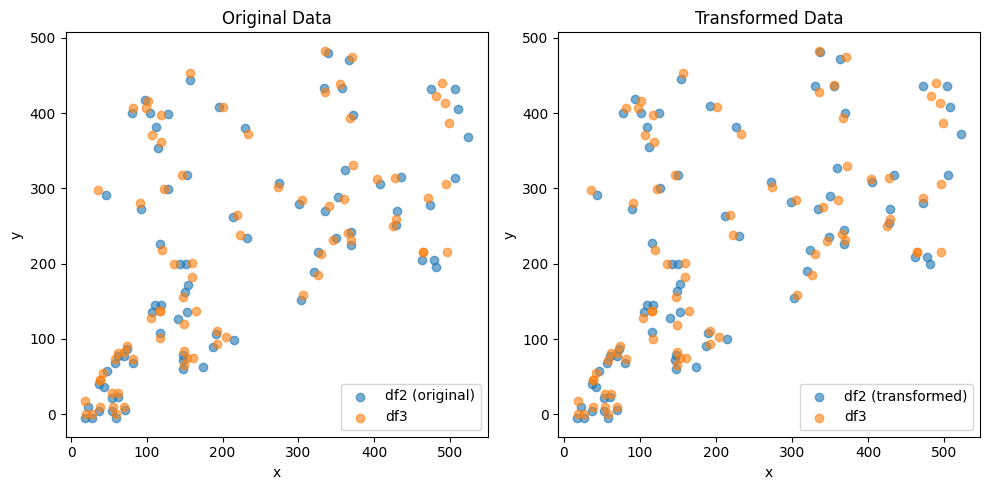

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (177,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4740849194541252e-06 , -2.054175742850727e-05 )
Rotation (radians): -0.005897050622277426
Transform Matrix:
 [[ 9.99982612e-01  5.89701644e-03 -3.47408492e-06]
 [-5.89701644e-03  9.99982612e-01 -2.05417574e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


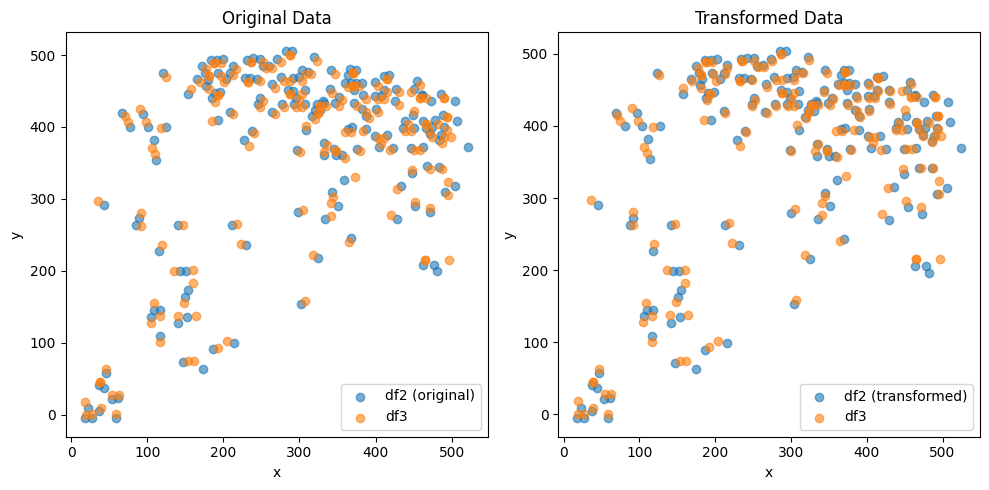

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (72,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.9495719957623674e-05 , 8.950706998543536e-05 )
Rotation (radians): 0.009873115460712796
Transform Matrix:
 [[ 9.99951261e-01 -9.87295506e-03  2.94957200e-05]
 [ 9.87295506e-03  9.99951261e-01  8.95070700e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


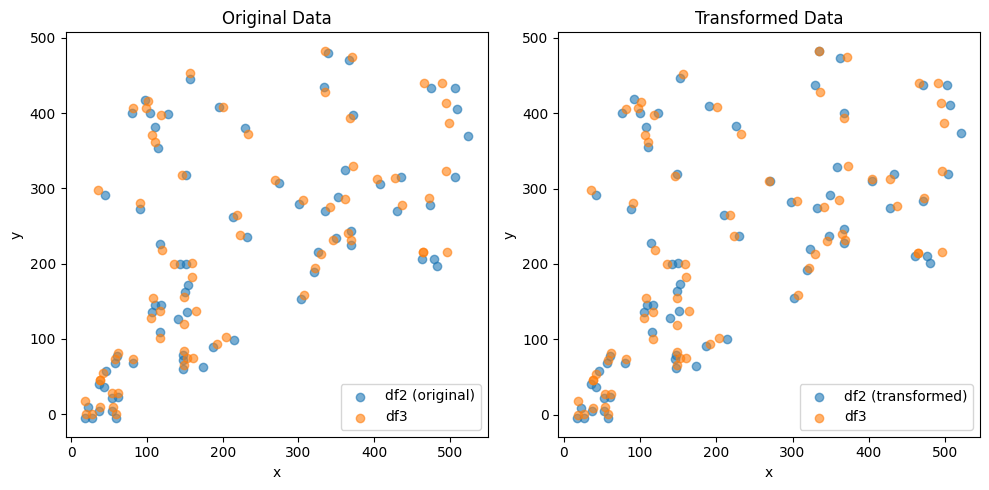

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (327,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.1834086433674254e-06 , -1.3108789321002042e-05 )
Rotation (radians): -0.0058285304796014065
Transform Matrix:
 [[ 9.99983014e-01  5.82849748e-03  5.18340864e-06]
 [-5.82849748e-03  9.99983014e-01 -1.31087893e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


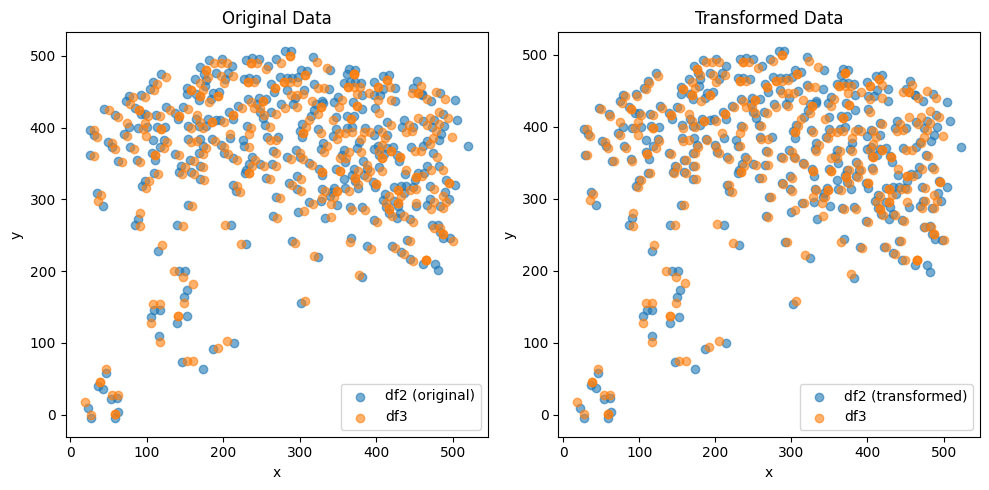

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (115,)
Optimal Translation and Rotation Parameters:
Translation: ( -5.230830087600728e-06 , 3.353232709018525e-06 )
Rotation (radians): -0.005268732871392596
Transform Matrix:
 [[ 9.99986120e-01  5.26870850e-03 -5.23083009e-06]
 [-5.26870850e-03  9.99986120e-01  3.35323271e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


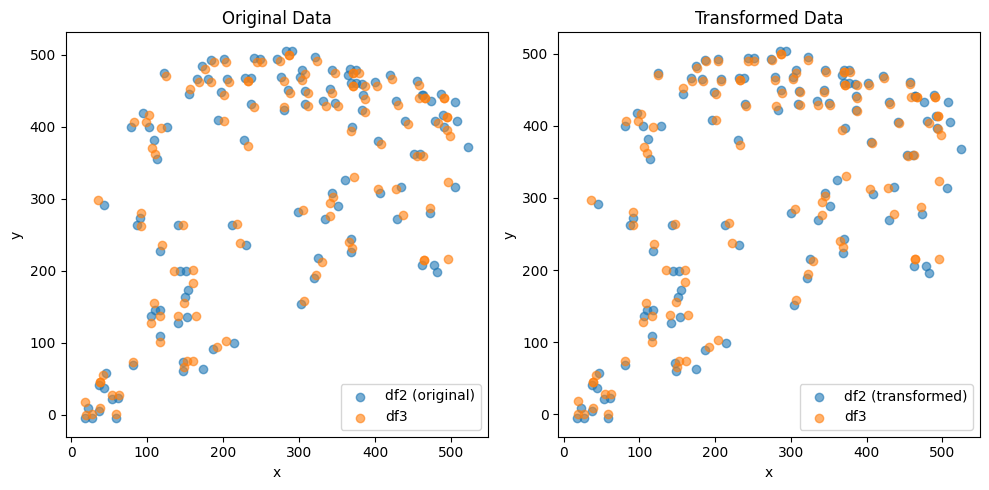

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.5815785086008848e-05 , 7.340494947554856e-05 )
Rotation (radians): 0.0071211271872471124
Transform Matrix:
 [[ 9.99974645e-01 -7.12106700e-03  1.58157851e-05]
 [ 7.12106700e-03  9.99974645e-01  7.34049495e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


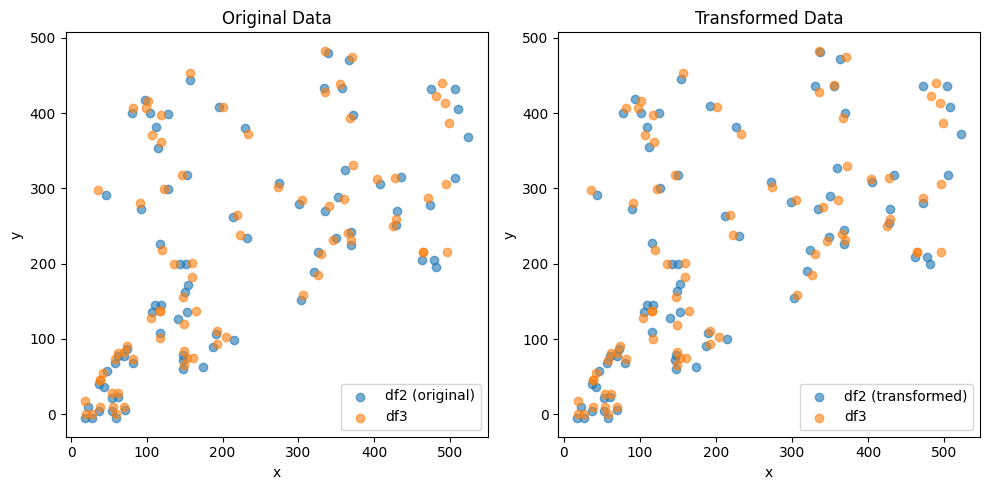

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (177,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4926774262057304e-06 , -2.0545991194382997e-05 )
Rotation (radians): -0.005897113727590592
Transform Matrix:
 [[ 9.99982612e-01  5.89707955e-03 -3.49267743e-06]
 [-5.89707955e-03  9.99982612e-01 -2.05459912e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


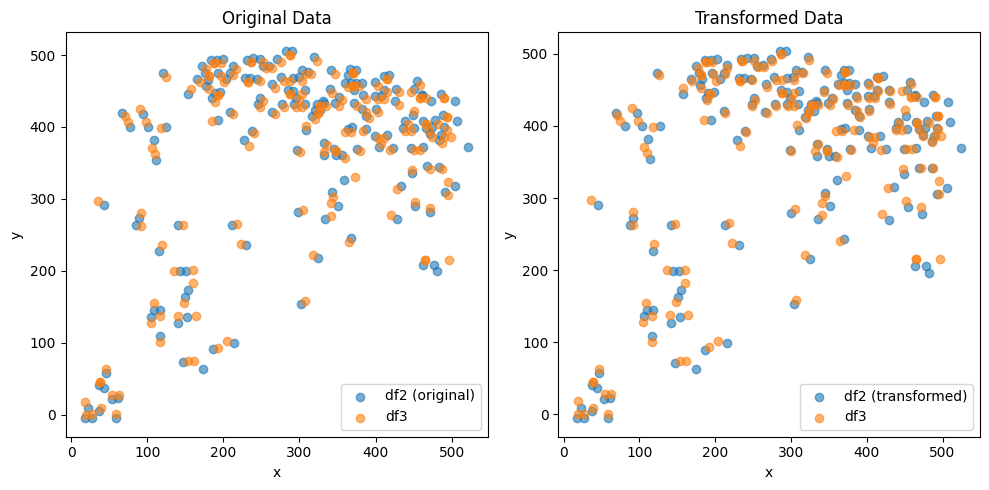

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (72,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.9475315624879068e-05 , 8.961953366123251e-05 )
Rotation (radians): 0.009873169121712655
Transform Matrix:
 [[ 9.99951261e-01 -9.87300872e-03  2.94753156e-05]
 [ 9.87300872e-03  9.99951261e-01  8.96195337e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


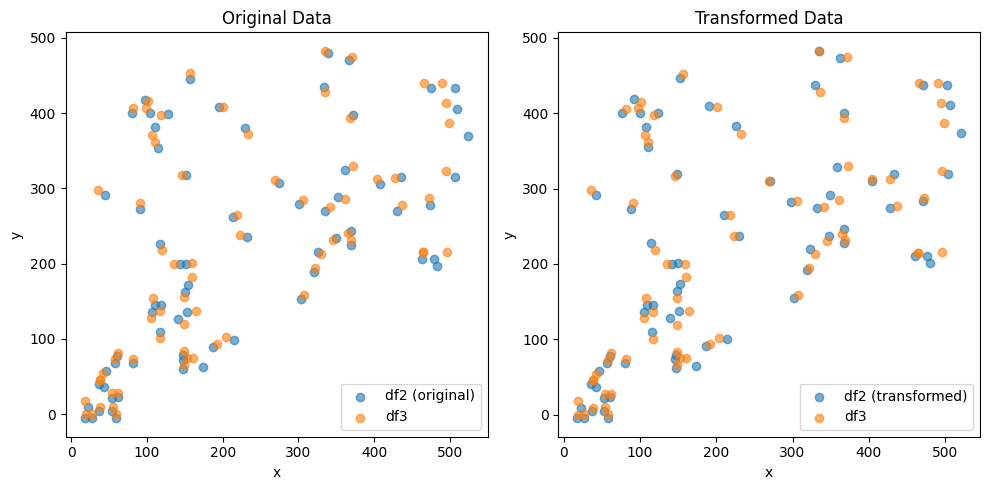

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (327,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.241461746429381e-06 , -1.316248742412055e-05 )
Rotation (radians): -0.005828601288488581
Transform Matrix:
 [[ 9.99983014e-01  5.82856829e-03  5.24146175e-06]
 [-5.82856829e-03  9.99983014e-01 -1.31624874e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


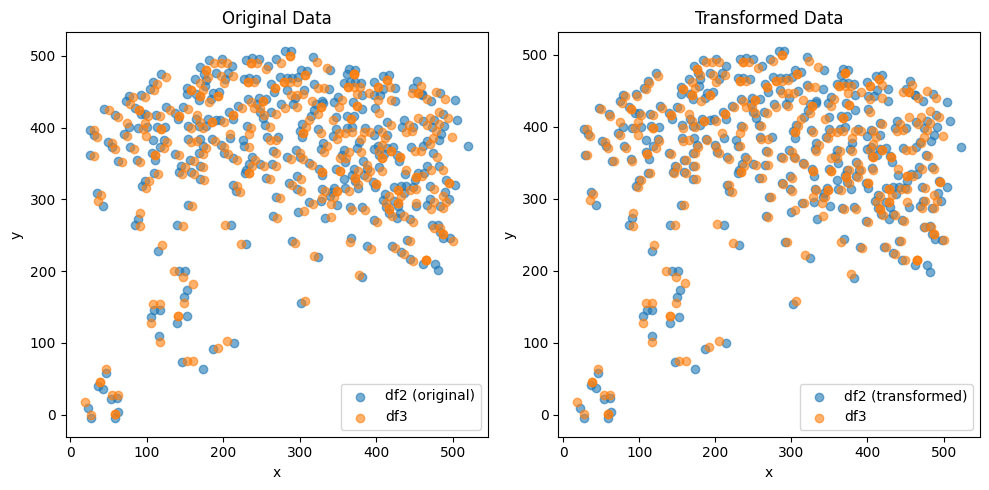

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (115,)
Optimal Translation and Rotation Parameters:
Translation: ( -5.166920275803404e-06 , 3.4059053866032706e-06 )
Rotation (radians): -0.005268651353526204
Transform Matrix:
 [[ 9.99986121e-01  5.26862698e-03 -5.16692028e-06]
 [-5.26862698e-03  9.99986121e-01  3.40590539e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


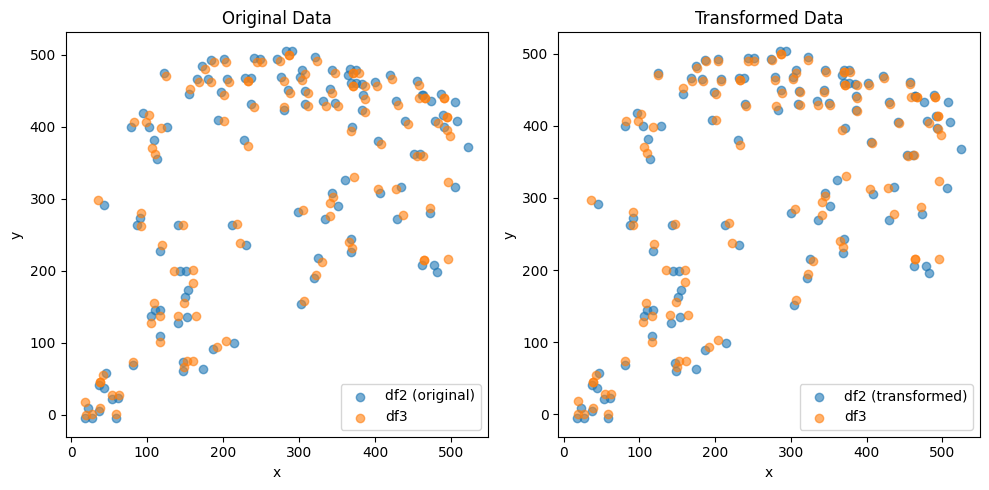

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.584082021923796e-05 , 7.341164032470525e-05 )
Rotation (radians): 0.007120937970988487
Transform Matrix:
 [[ 9.99974646e-01 -7.12087779e-03  1.58408202e-05]
 [ 7.12087779e-03  9.99974646e-01  7.34116403e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


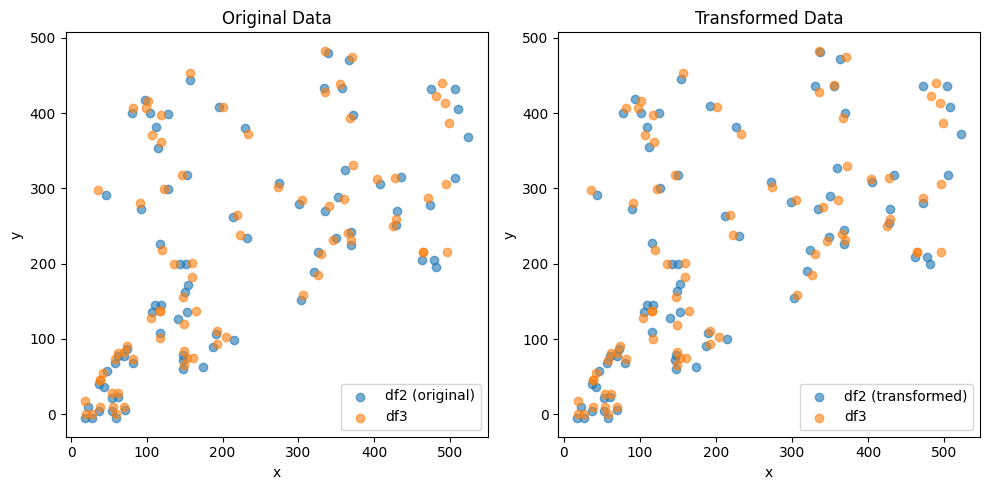

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (177,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4873707659319073e-06 , -2.0549319248344607e-05 )
Rotation (radians): -0.005896973273086867
Transform Matrix:
 [[ 9.99982613e-01  5.89693910e-03 -3.48737077e-06]
 [-5.89693910e-03  9.99982613e-01 -2.05493192e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


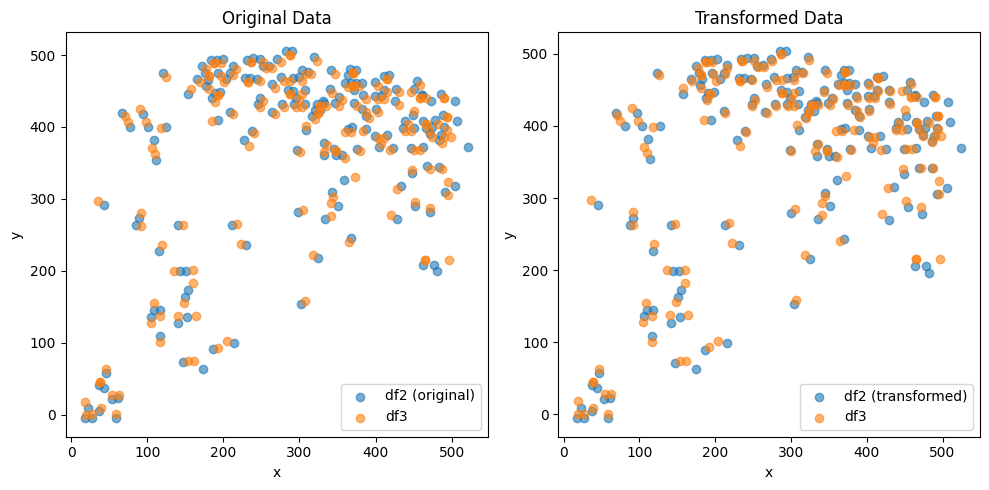

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (72,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.9429475306545847e-05 , 8.948527033612858e-05 )
Rotation (radians): 0.009872980821452213
Transform Matrix:
 [[ 9.99951263e-01 -9.87282043e-03  2.94294753e-05]
 [ 9.87282043e-03  9.99951263e-01  8.94852703e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


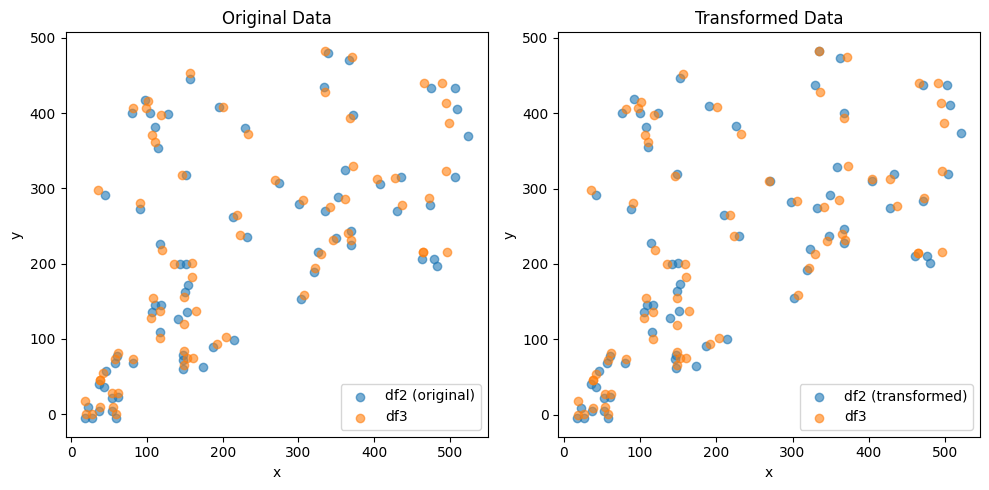

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (327,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.208585811928489e-06 , -1.3158534200602712e-05 )
Rotation (radians): -0.005828417024692604
Transform Matrix:
 [[ 9.99983015e-01  5.82838403e-03  5.20858581e-06]
 [-5.82838403e-03  9.99983015e-01 -1.31585342e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


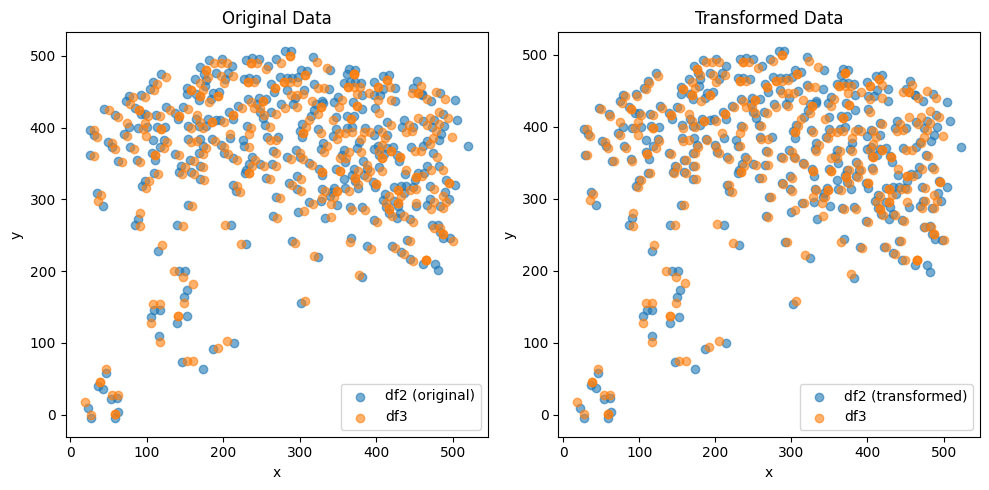

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (115,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.737645071671523e-06 , -2.2025464522672605e-06 )
Rotation (radians): -0.005265711922585892
Transform Matrix:
 [[ 9.99986136e-01  5.26568759e-03  1.73764507e-06]
 [-5.26568759e-03  9.99986136e-01 -2.20254645e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


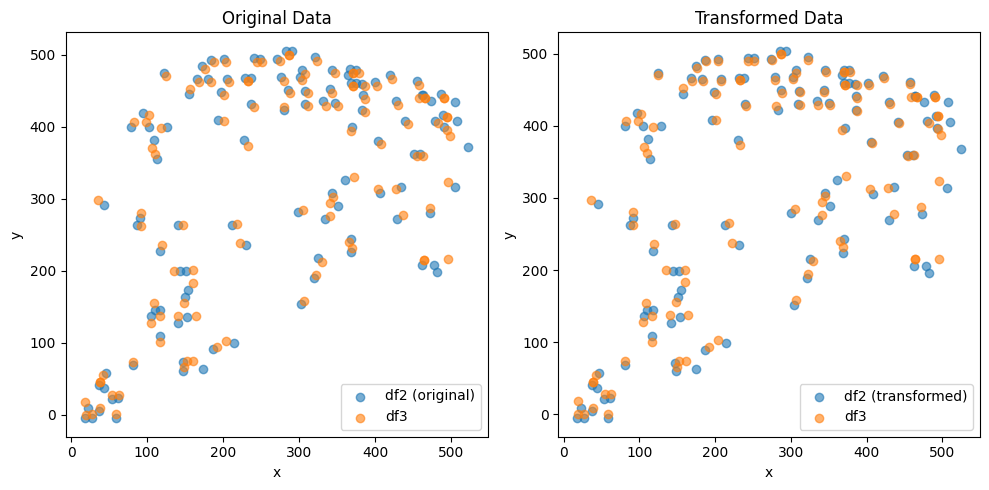

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.5842065468742117e-05 , 7.338222507349346e-05 )
Rotation (radians): 0.00711796698807283
Transform Matrix:
 [[ 9.99974667e-01 -7.11790688e-03  1.58420655e-05]
 [ 7.11790688e-03  9.99974667e-01  7.33822251e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


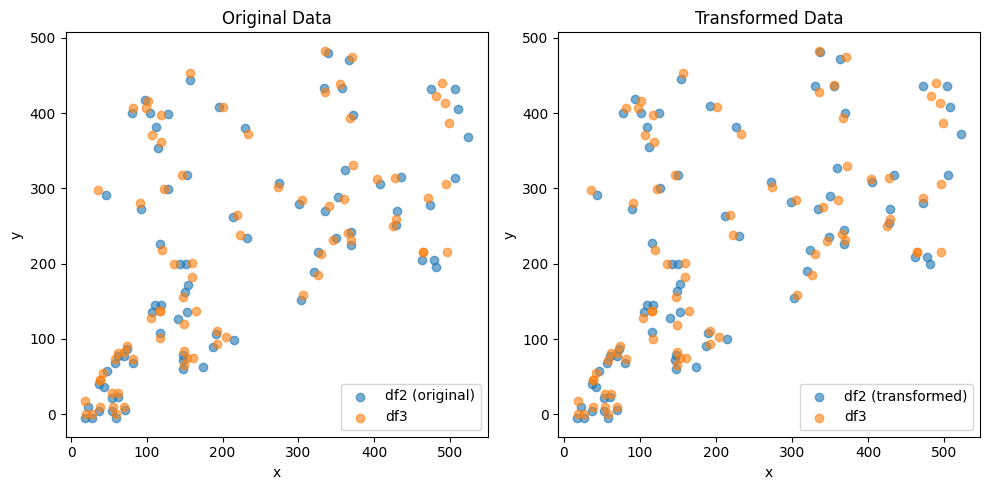

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (177,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4860598482390873e-06 , -2.0552415383756718e-05 )
Rotation (radians): -0.005896921161871017
Transform Matrix:
 [[ 9.99982613e-01  5.89688699e-03 -3.48605985e-06]
 [-5.89688699e-03  9.99982613e-01 -2.05524154e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


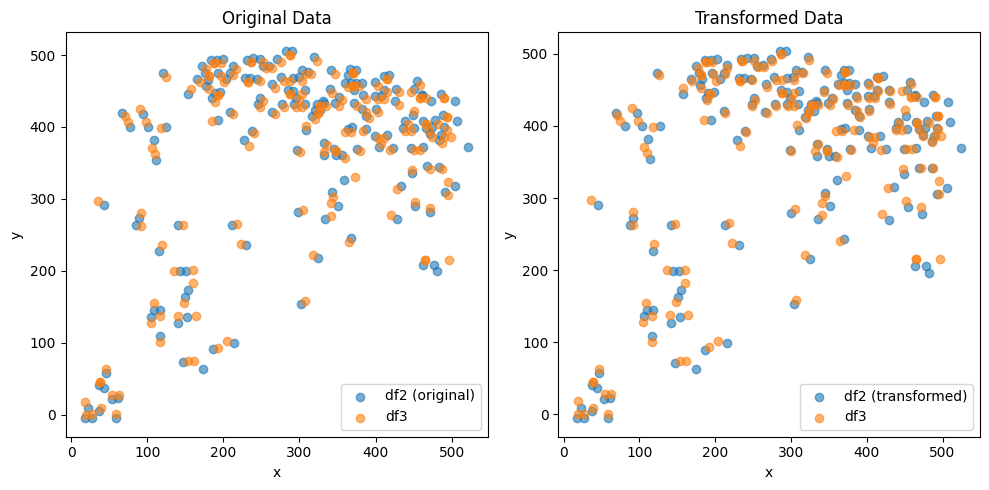

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (72,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.9513693972204524e-05 , 8.946078160631937e-05 )
Rotation (radians): 0.009872914288863627
Transform Matrix:
 [[ 9.99951263e-01 -9.87275390e-03  2.95136940e-05]
 [ 9.87275390e-03  9.99951263e-01  8.94607816e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


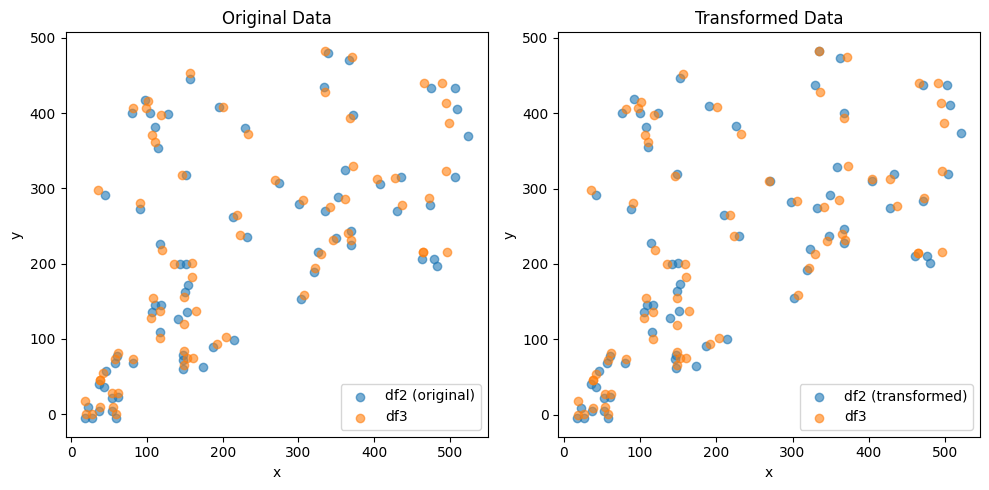

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (327,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.192545447800534e-06 , -1.3158347109854574e-05 )
Rotation (radians): -0.005828387947902929
Transform Matrix:
 [[ 9.99983015e-01  5.82835495e-03  5.19254545e-06]
 [-5.82835495e-03  9.99983015e-01 -1.31583471e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


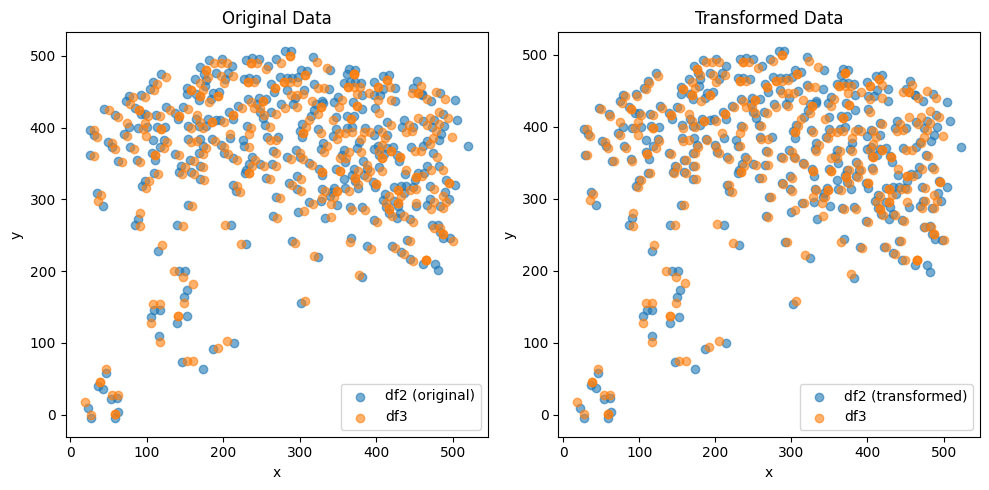

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (115,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.76169770817022e-06 , -2.226478288761285e-06 )
Rotation (radians): -0.005265673522429018
Transform Matrix:
 [[ 9.99986136e-01  5.26564919e-03  1.76169771e-06]
 [-5.26564919e-03  9.99986136e-01 -2.22647829e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


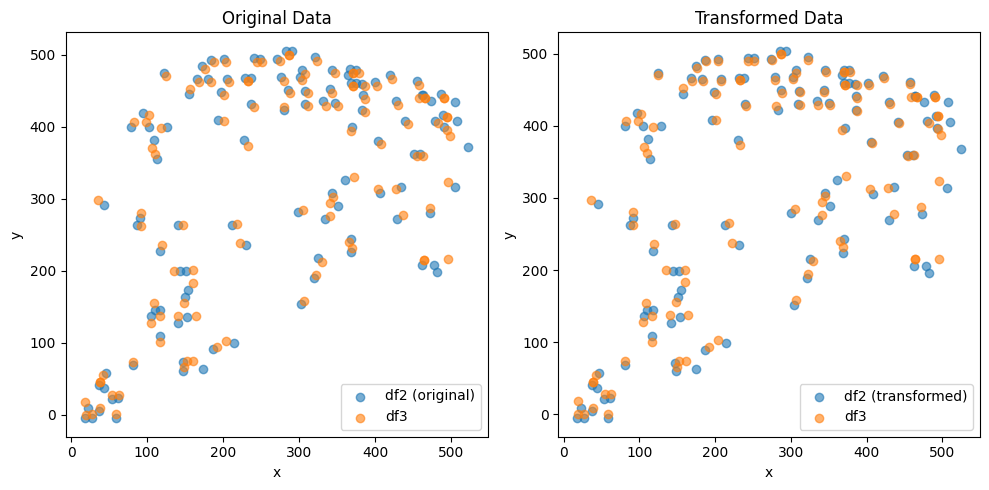

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.5828562336865852e-05 , 7.332638363142304e-05 )
Rotation (radians): 0.007117908614786023
Transform Matrix:
 [[ 9.99974668e-01 -7.11784851e-03  1.58285623e-05]
 [ 7.11784851e-03  9.99974668e-01  7.33263836e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


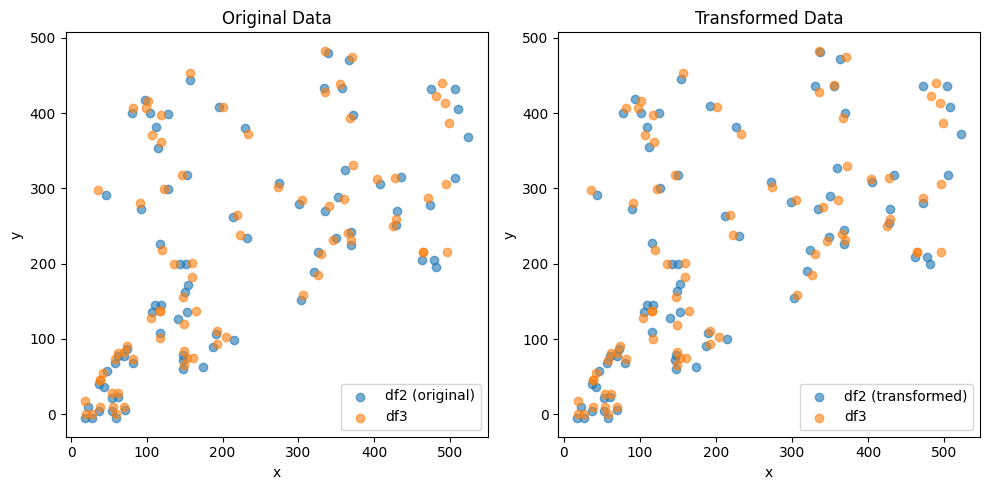

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (177,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.474248047676418e-06 , -2.055812114355044e-05 )
Rotation (radians): -0.005896863067482569
Transform Matrix:
 [[ 9.99982614e-01  5.89682889e-03 -3.47424805e-06]
 [-5.89682889e-03  9.99982614e-01 -2.05581211e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


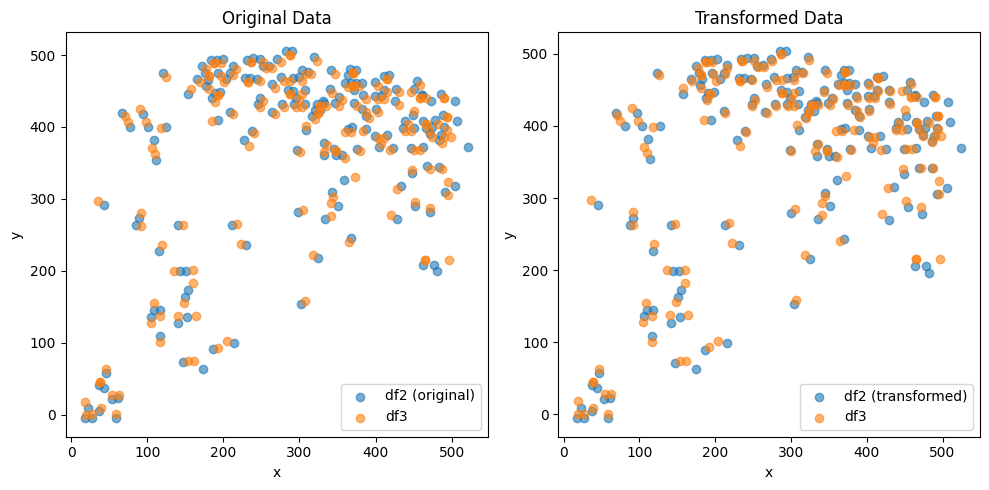

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (72,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.951449056593272e-05 , 8.962385151871427e-05 )
Rotation (radians): 0.009872857619726906
Transform Matrix:
 [[ 9.99951264e-01 -9.87269723e-03  2.95144906e-05]
 [ 9.87269723e-03  9.99951264e-01  8.96238515e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


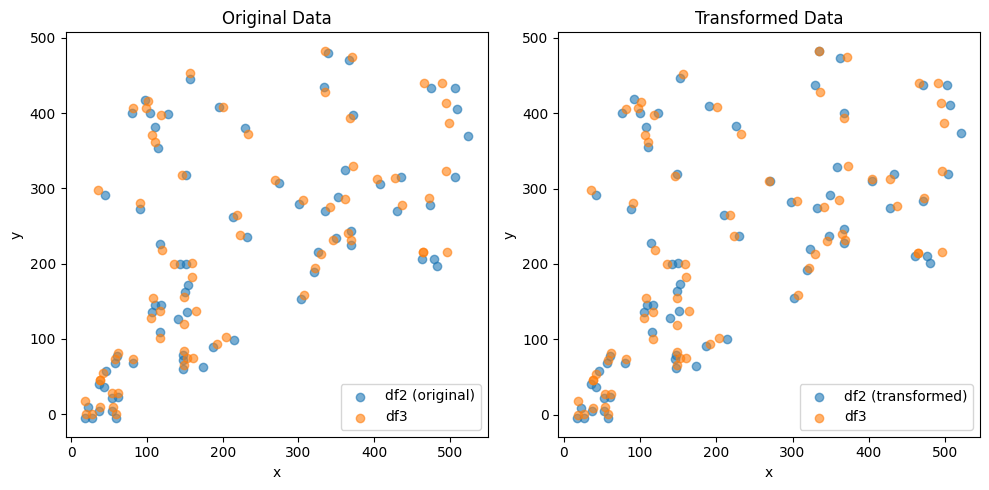

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (327,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.189259700537888e-06 , -1.3122136103052642e-05 )
Rotation (radians): -0.005828339356352742
Transform Matrix:
 [[ 9.99983015e-01  5.82830636e-03  5.18925970e-06]
 [-5.82830636e-03  9.99983015e-01 -1.31221361e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


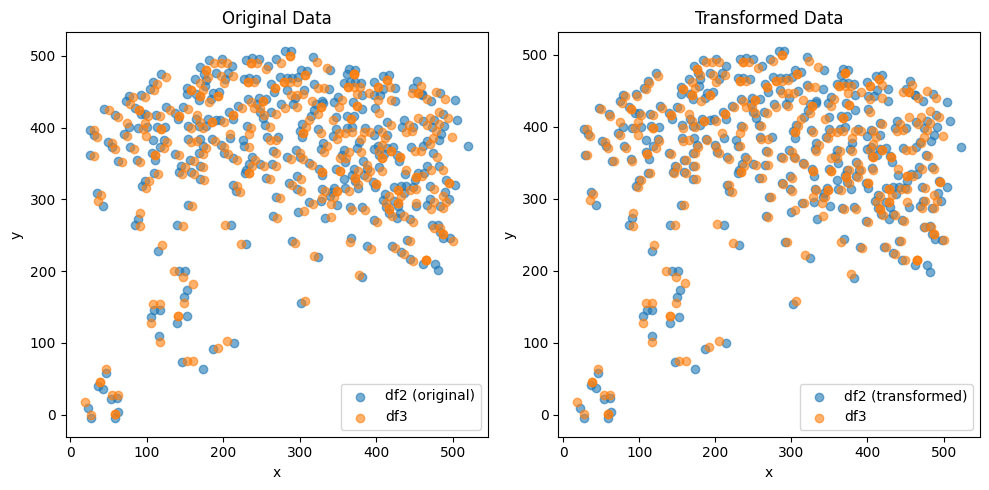

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (115,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.7561466891314043e-06 , -2.1756556039948895e-06 )
Rotation (radians): -0.005265642537033187
Transform Matrix:
 [[ 9.99986137e-01  5.26561820e-03  1.75614669e-06]
 [-5.26561820e-03  9.99986137e-01 -2.17565560e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


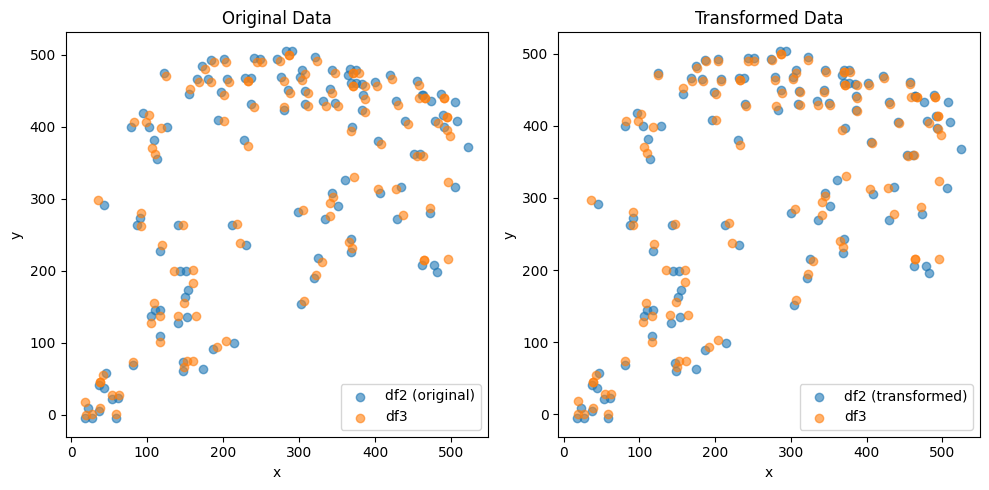

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.584236510214411e-05 , 7.333307255907927e-05 )
Rotation (radians): 0.007117851329147591
Transform Matrix:
 [[ 9.99974668e-01 -7.11779123e-03  1.58423651e-05]
 [ 7.11779123e-03  9.99974668e-01  7.33330726e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


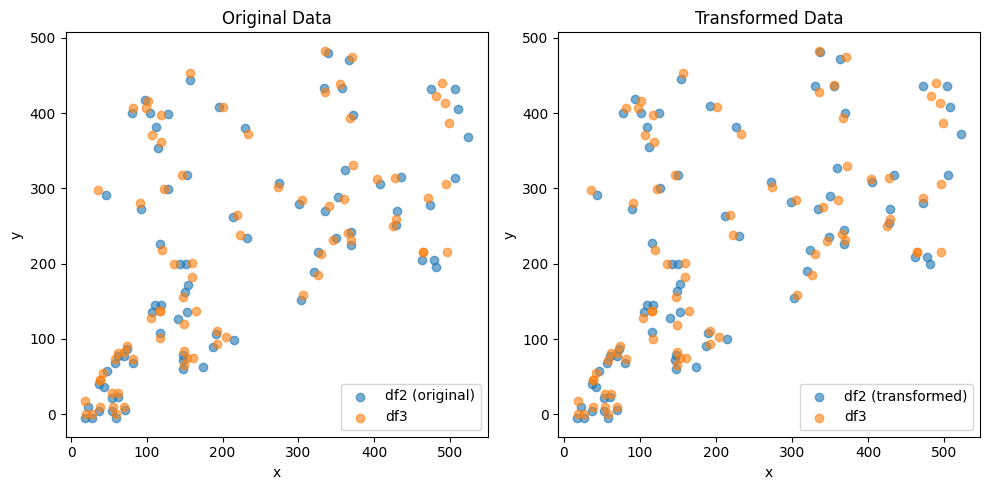

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (177,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.5067936911322516e-06 , -2.0561355969430624e-05 )
Rotation (radians): -0.005896838981073917
Transform Matrix:
 [[ 9.99982614e-01  5.89680481e-03 -3.50679369e-06]
 [-5.89680481e-03  9.99982614e-01 -2.05613560e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


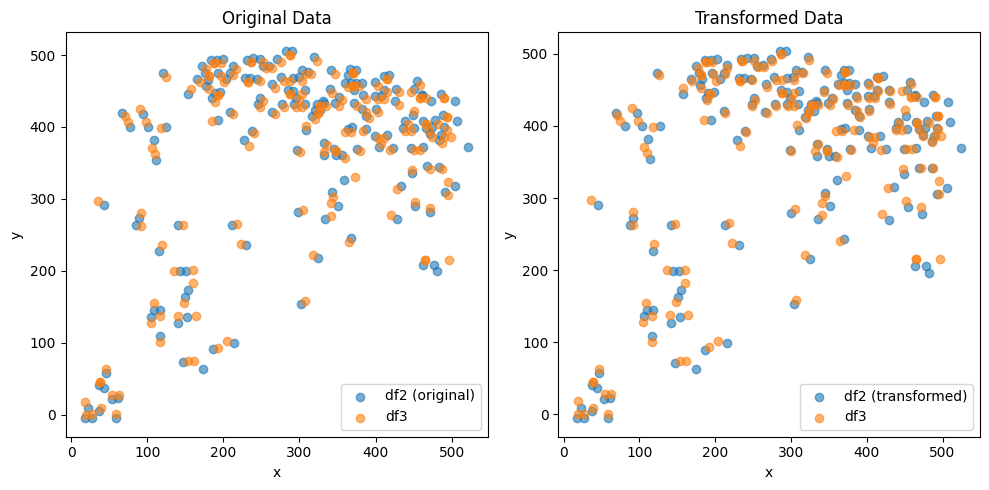

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (72,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.949214139104756e-05 , 8.957010387940758e-05 )
Rotation (radians): 0.009872853972916377
Transform Matrix:
 [[ 9.99951264e-01 -9.87269358e-03  2.94921414e-05]
 [ 9.87269358e-03  9.99951264e-01  8.95701039e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


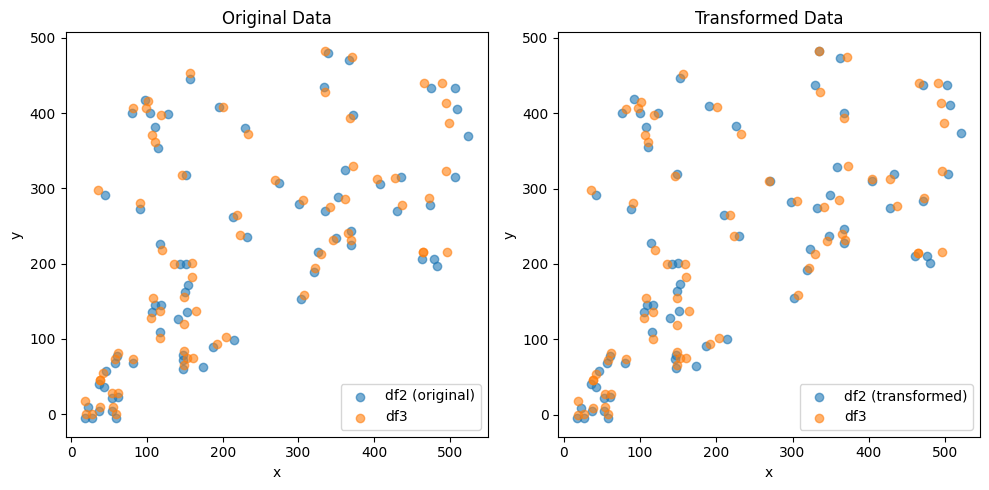

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (327,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.191867288736391e-06 , -1.3188349933024975e-05 )
Rotation (radians): -0.005828349109118377
Transform Matrix:
 [[ 9.99983015e-01  5.82831611e-03  5.19186729e-06]
 [-5.82831611e-03  9.99983015e-01 -1.31883499e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


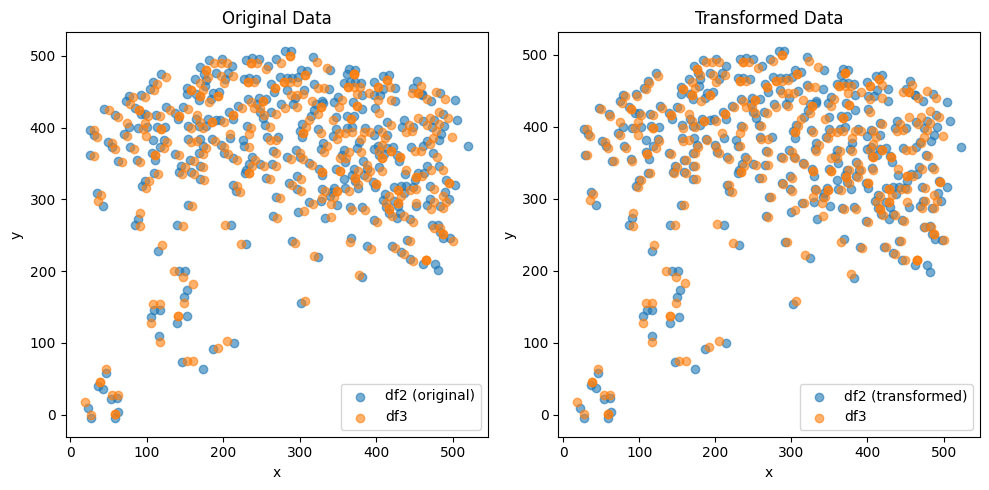

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (115,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.7579762458556279e-06 , -2.2012119506112433e-06 )
Rotation (radians): -0.005265620427681952
Transform Matrix:
 [[ 9.99986137e-01  5.26559609e-03  1.75797625e-06]
 [-5.26559609e-03  9.99986137e-01 -2.20121195e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


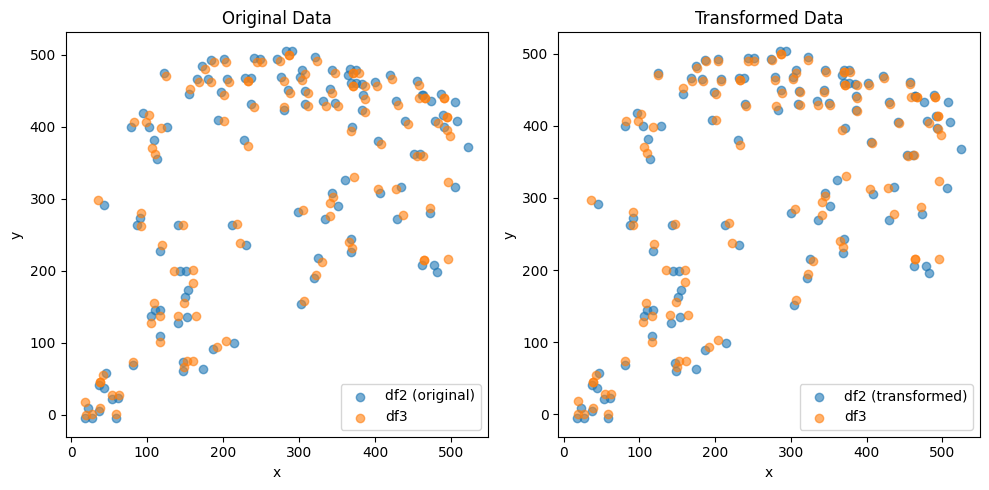

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.579200764735847e-05 , 7.329120978657296e-05 )
Rotation (radians): 0.0071177450898174425
Transform Matrix:
 [[ 9.99974669e-01 -7.11768499e-03  1.57920076e-05]
 [ 7.11768499e-03  9.99974669e-01  7.32912098e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


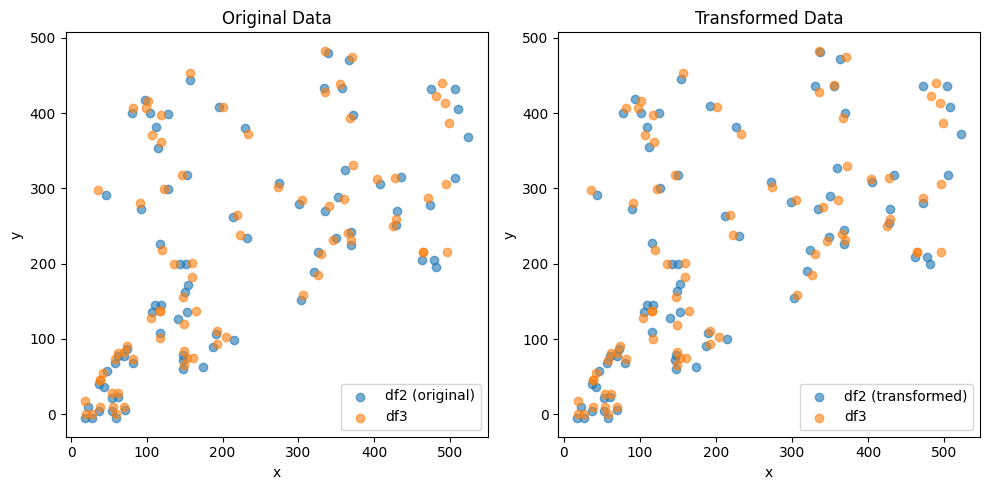

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (177,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4625980923199624e-06 , -2.0541673010979065e-05 )
Rotation (radians): -0.00589674638137237
Transform Matrix:
 [[ 9.99982614e-01  5.89671221e-03 -3.46259809e-06]
 [-5.89671221e-03  9.99982614e-01 -2.05416730e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


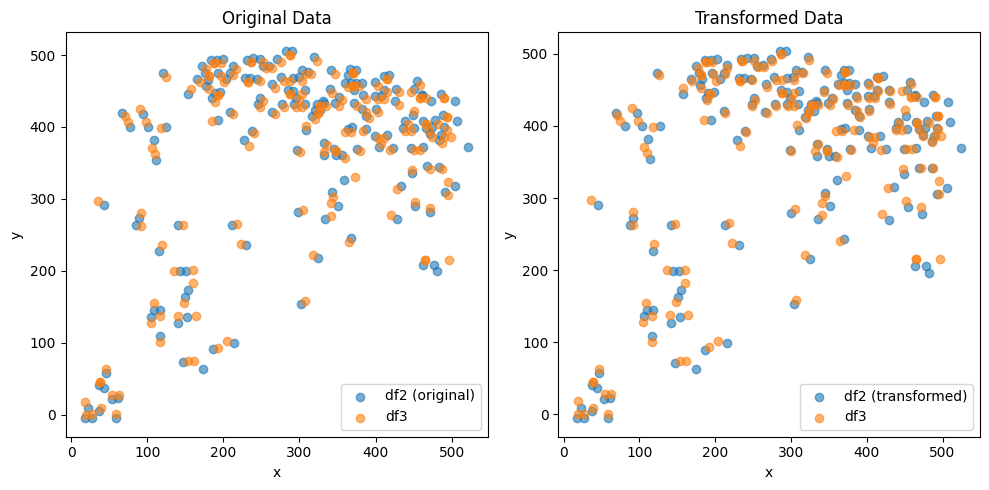

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (72,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.9529086007738584e-05 , 8.951109281474232e-05 )
Rotation (radians): 0.009872763510917574
Transform Matrix:
 [[ 9.99951265e-01 -9.87260313e-03  2.95290860e-05]
 [ 9.87260313e-03  9.99951265e-01  8.95110928e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


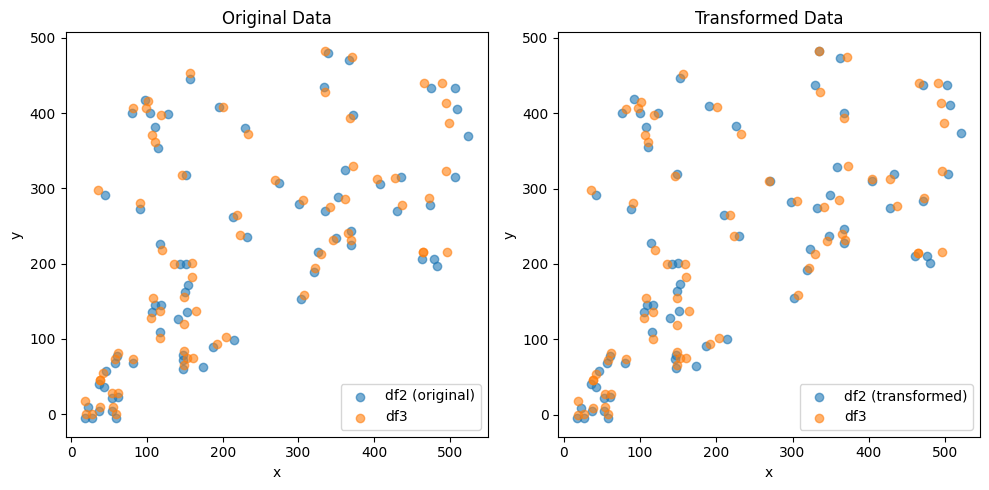

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (327,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.176342804334444e-06 , -1.3166683767369437e-05 )
Rotation (radians): -0.005828283676264083
Transform Matrix:
 [[ 9.99983016e-01  5.82825068e-03  5.17634280e-06]
 [-5.82825068e-03  9.99983016e-01 -1.31666838e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


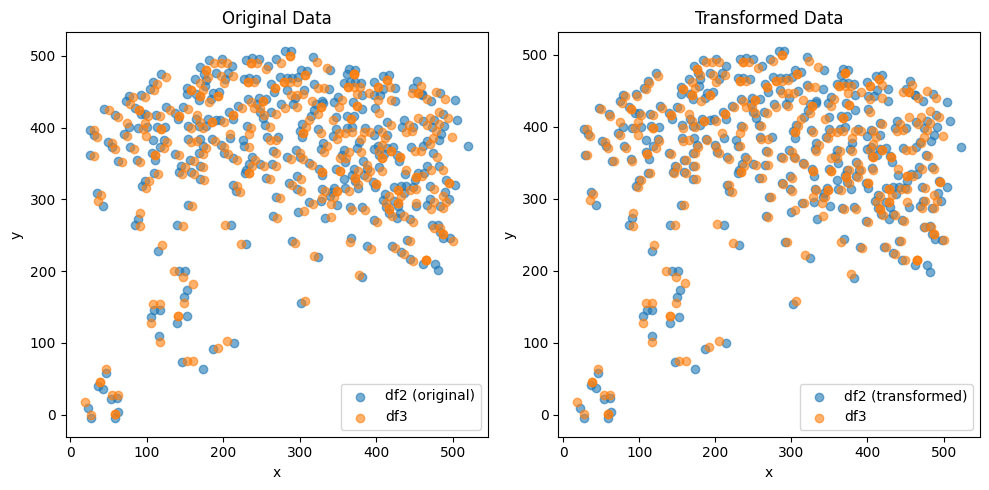

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (115,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.7215416197476873e-06 , -2.2096852251900016e-06 )
Rotation (radians): -0.005265573931735123
Transform Matrix:
 [[ 9.99986137e-01  5.26554960e-03  1.72154162e-06]
 [-5.26554960e-03  9.99986137e-01 -2.20968523e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


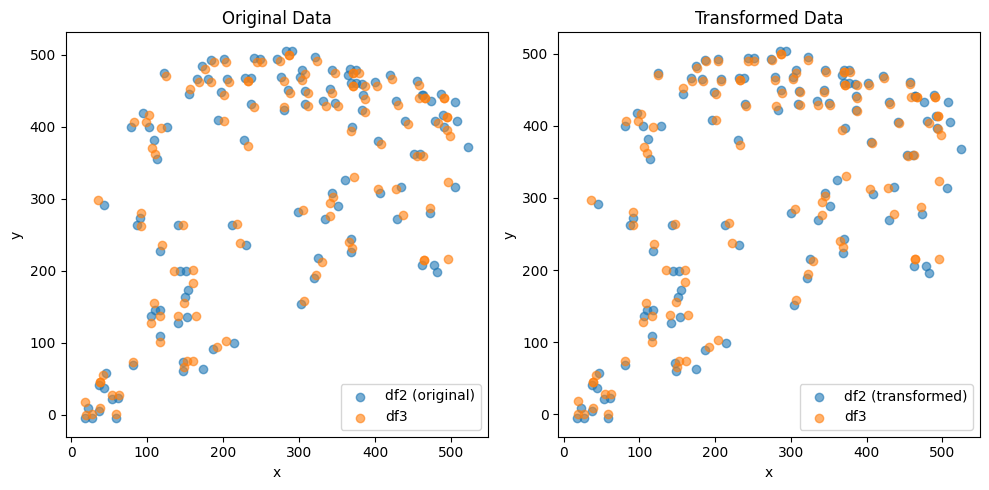

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.590805221277722e-05 , 7.339879275901501e-05 )
Rotation (radians): 0.007117798931302418
Transform Matrix:
 [[ 9.99974669e-01 -7.11773883e-03  1.59080522e-05]
 [ 7.11773883e-03  9.99974669e-01  7.33987928e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


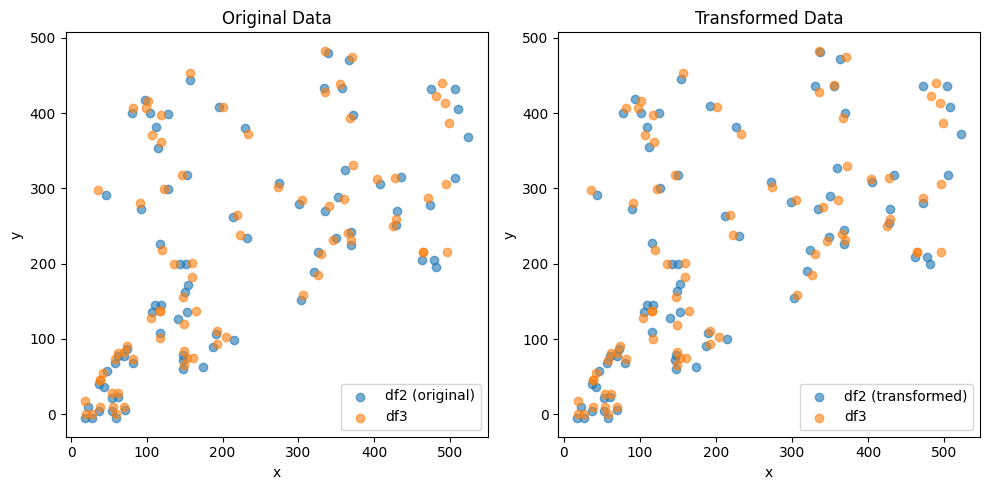

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (176,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.6889488897924084e-06 , -2.105170641288357e-05 )
Rotation (radians): -0.005988808445604104
Transform Matrix:
 [[ 9.99982067e-01  5.98877265e-03 -3.68894889e-06]
 [-5.98877265e-03  9.99982067e-01 -2.10517064e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


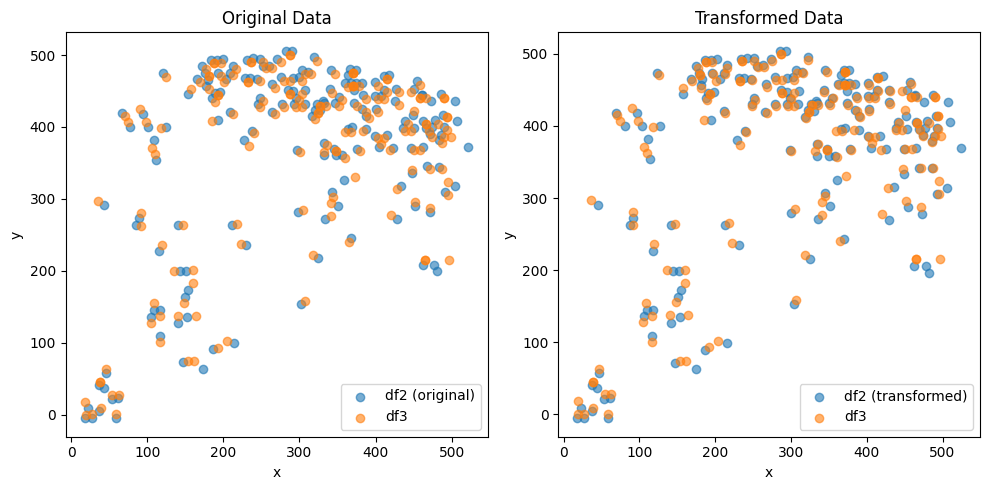

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (73,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.3970395128216837e-05 , 8.284614475542116e-05 )
Rotation (radians): 0.009996409096427593
Transform Matrix:
 [[ 9.99950036e-01 -9.99624261e-03  2.39703951e-05]
 [ 9.99624261e-03  9.99950036e-01  8.28461448e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


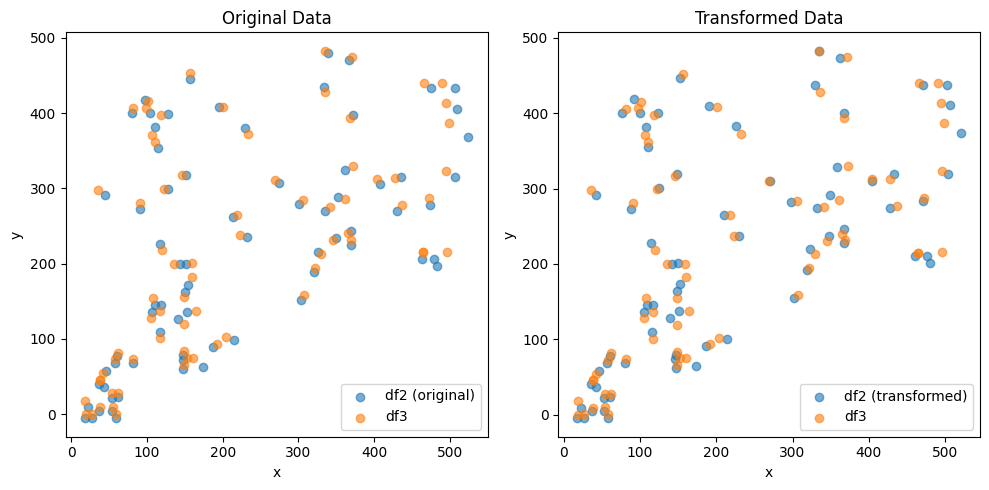

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (326,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.246642547344941e-06 , -1.291448892168359e-05 )
Rotation (radians): -0.005747261329175953
Transform Matrix:
 [[ 9.99983485e-01  5.74722969e-03  5.24664255e-06]
 [-5.74722969e-03  9.99983485e-01 -1.29144889e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


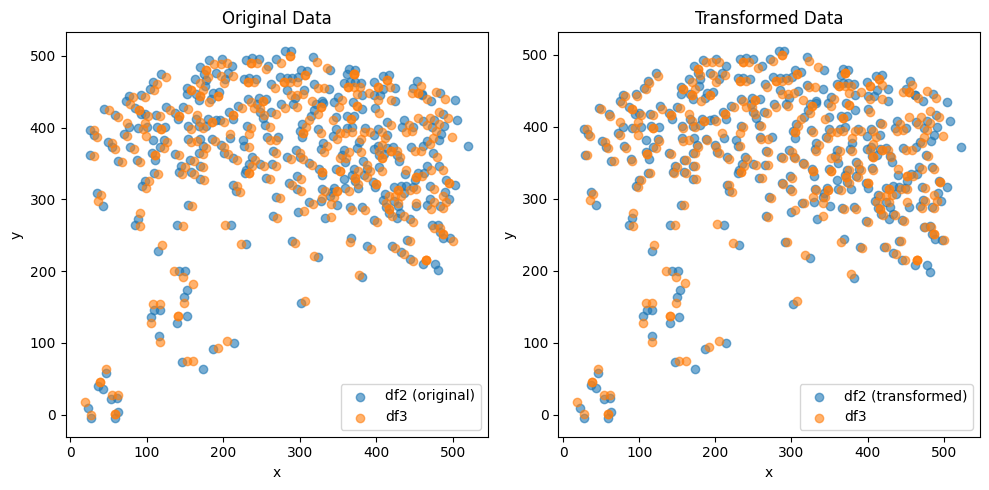

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (116,)
Optimal Translation and Rotation Parameters:
Translation: ( 3.962260702597791e-07 , -4.567783883445738e-06 )
Rotation (radians): -0.005391197192761372
Transform Matrix:
 [[ 9.99985468e-01  5.39117108e-03  3.96226070e-07]
 [-5.39117108e-03  9.99985468e-01 -4.56778388e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


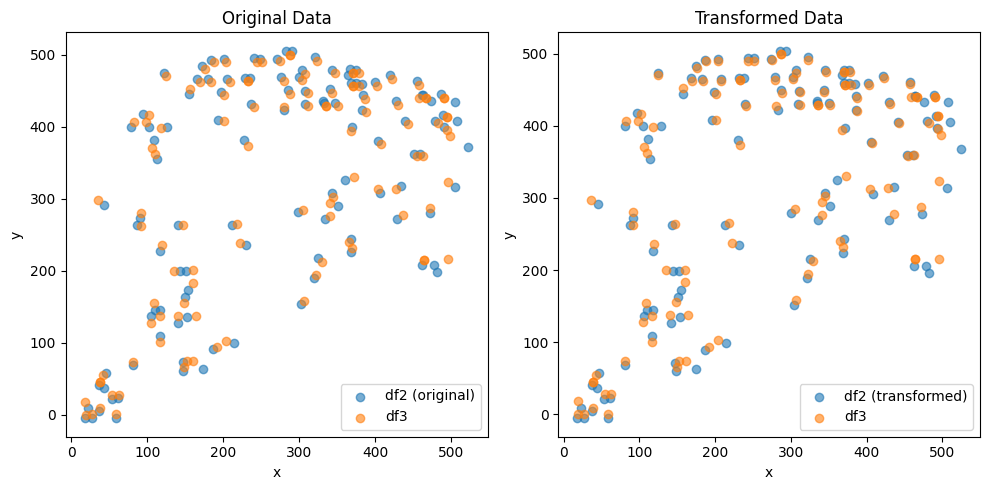

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.578092532861396e-05 , 7.334573414881129e-05 )
Rotation (radians): 0.007130619035900592
Transform Matrix:
 [[ 9.99974577e-01 -7.13055861e-03  1.57809253e-05]
 [ 7.13055861e-03  9.99974577e-01  7.33457341e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


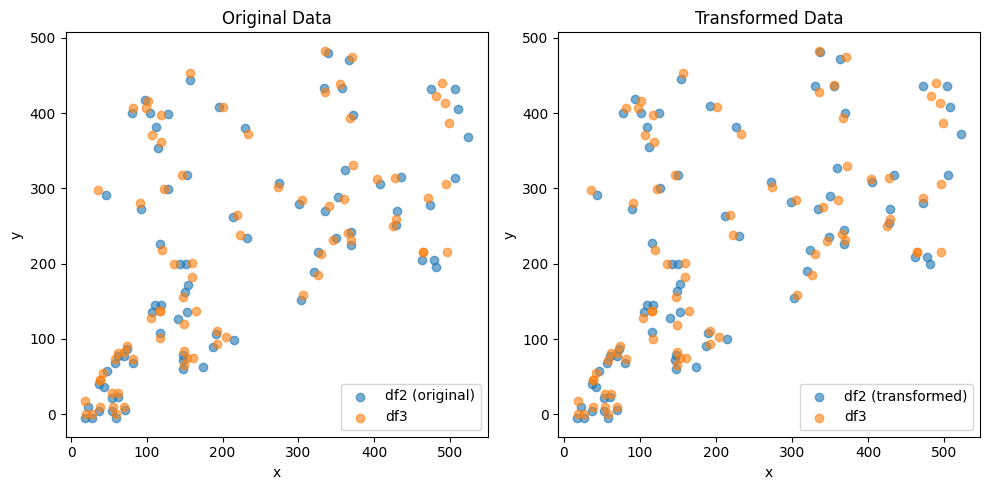

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (176,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.6924849174608554e-06 , -2.1050317595175246e-05 )
Rotation (radians): -0.005988681538364453
Transform Matrix:
 [[ 9.99982068e-01  5.98864574e-03 -3.69248492e-06]
 [-5.98864574e-03  9.99982068e-01 -2.10503176e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


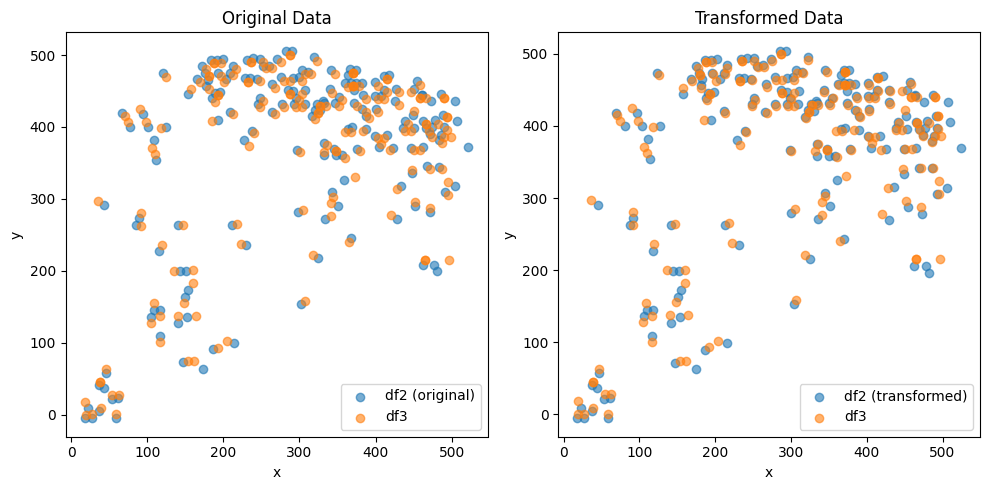

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (73,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.3933686142713138e-05 , 8.281489771464678e-05 )
Rotation (radians): 0.009996370344907851
Transform Matrix:
 [[ 9.99950037e-01 -9.99620386e-03  2.39336861e-05]
 [ 9.99620386e-03  9.99950037e-01  8.28148977e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


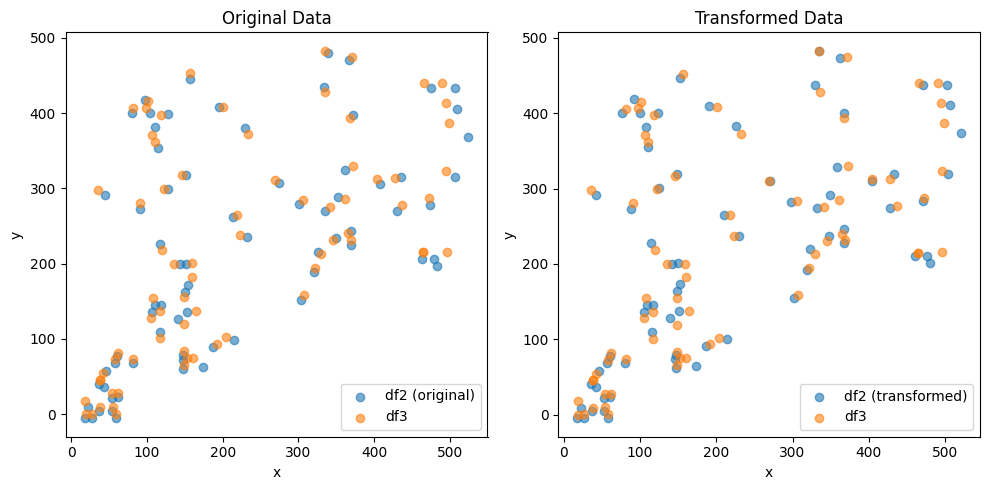

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (326,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.1607369152686684e-06 , -1.297890257785996e-05 )
Rotation (radians): -0.005747232122588349
Transform Matrix:
 [[ 9.99983485e-01  5.74720048e-03  5.16073692e-06]
 [-5.74720048e-03  9.99983485e-01 -1.29789026e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


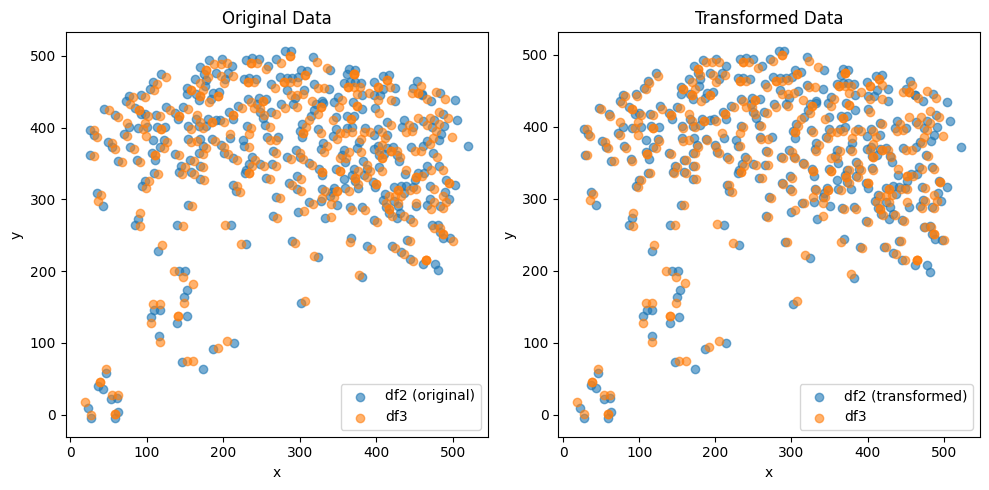

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (116,)
Optimal Translation and Rotation Parameters:
Translation: ( 3.943597999094982e-07 , -4.595490753831058e-06 )
Rotation (radians): -0.005391181495677051
Transform Matrix:
 [[ 9.99985468e-01  5.39115538e-03  3.94359800e-07]
 [-5.39115538e-03  9.99985468e-01 -4.59549075e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


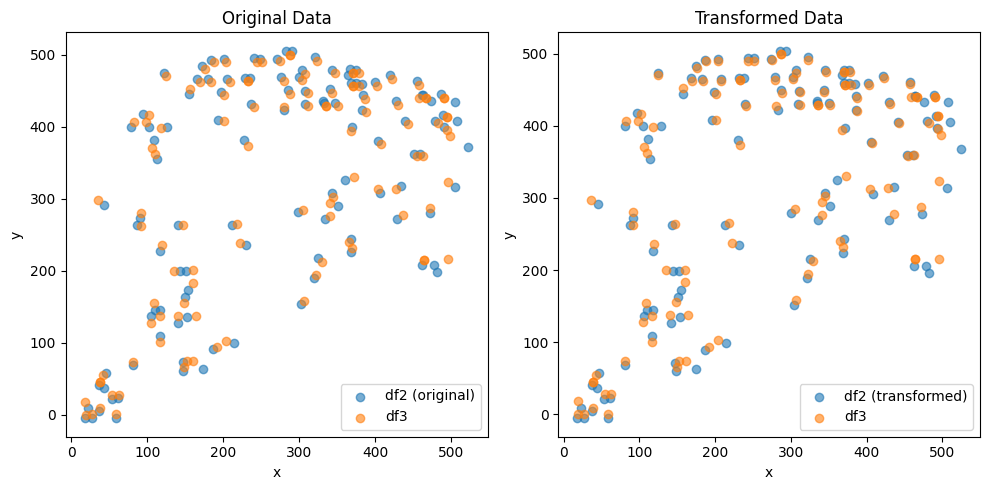

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.578908856203219e-05 , 7.335286332156873e-05 )
Rotation (radians): 0.007130572798620466
Transform Matrix:
 [[ 9.99974578e-01 -7.13051237e-03  1.57890886e-05]
 [ 7.13051237e-03  9.99974578e-01  7.33528633e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


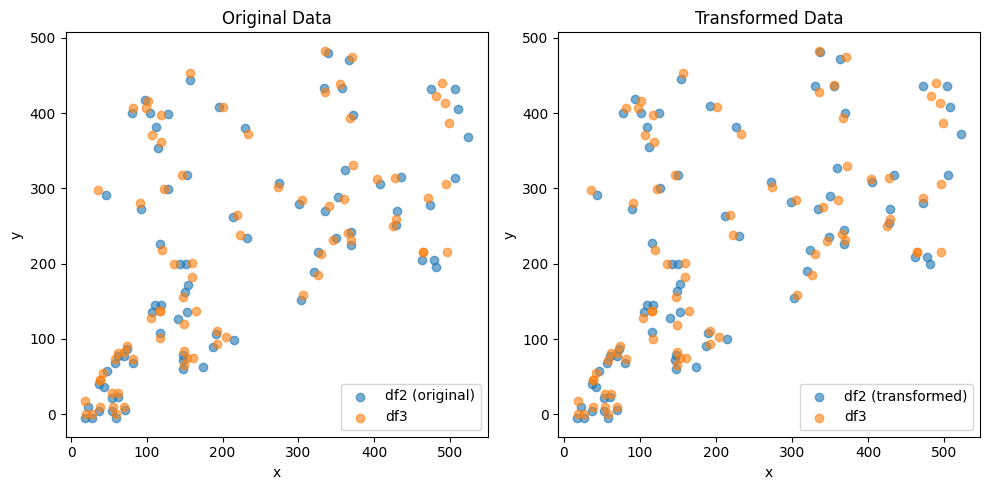

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (176,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.6926858045733557e-06 , -2.105275588951346e-05 )
Rotation (radians): -0.005988631941503676
Transform Matrix:
 [[ 9.99982068e-01  5.98859615e-03 -3.69268580e-06]
 [-5.98859615e-03  9.99982068e-01 -2.10527559e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


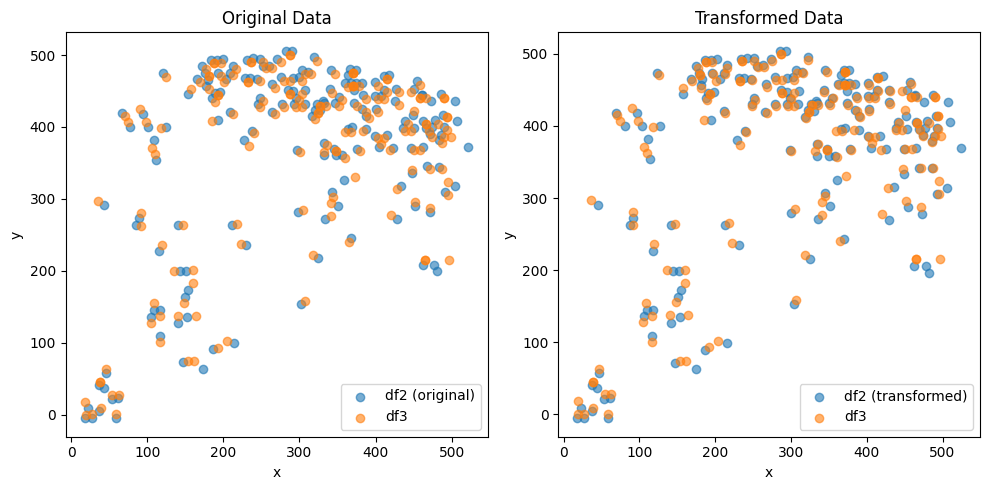

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (73,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.390474926692749e-05 , 8.279066882661299e-05 )
Rotation (radians): 0.009996288059144176
Transform Matrix:
 [[ 9.99950038e-01 -9.99612158e-03  2.39047493e-05]
 [ 9.99612158e-03  9.99950038e-01  8.27906688e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


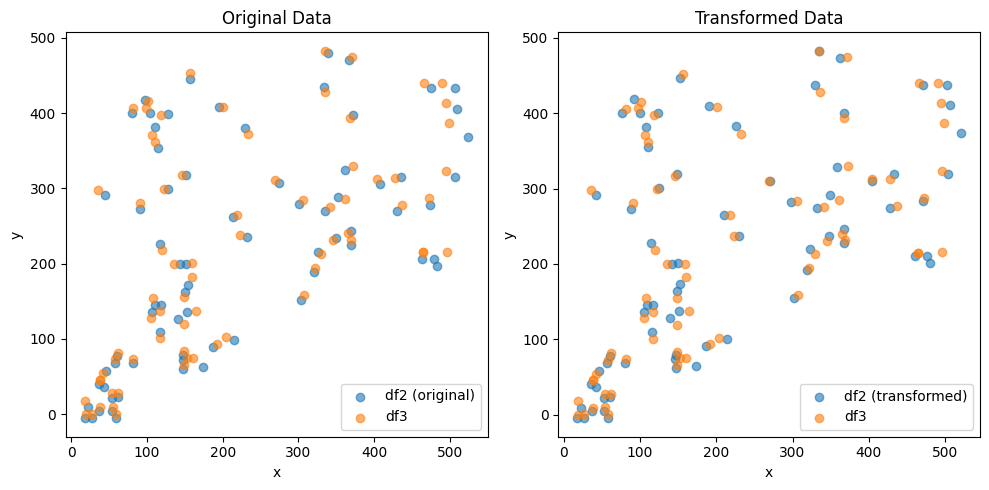

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (326,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.246394422347466e-06 , -1.2898859284625251e-05 )
Rotation (radians): -0.005747171335087654
Transform Matrix:
 [[ 9.99983485e-01  5.74713970e-03  5.24639442e-06]
 [-5.74713970e-03  9.99983485e-01 -1.28988593e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


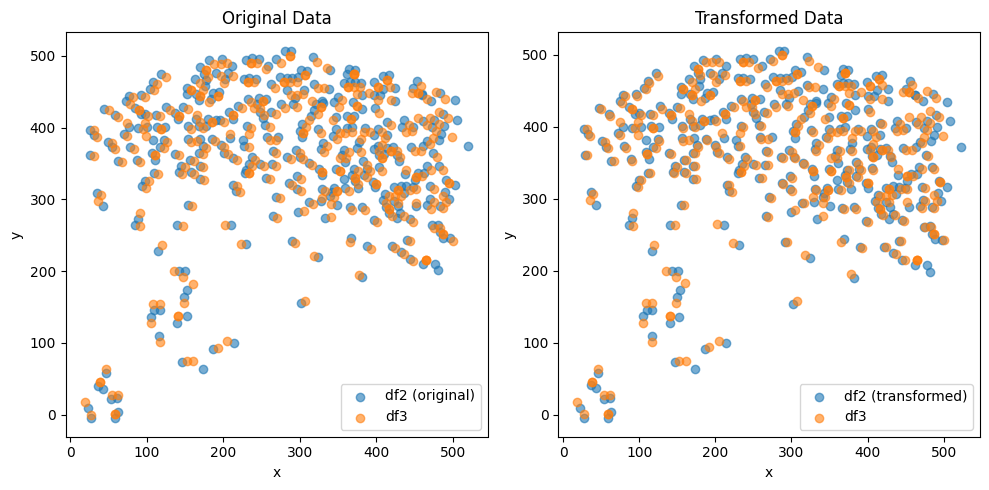

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (116,)
Optimal Translation and Rotation Parameters:
Translation: ( 4.361968761360888e-07 , -4.598560915718345e-06 )
Rotation (radians): -0.005391151621129808
Transform Matrix:
 [[ 9.99985468e-01  5.39112551e-03  4.36196876e-07]
 [-5.39112551e-03  9.99985468e-01 -4.59856092e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


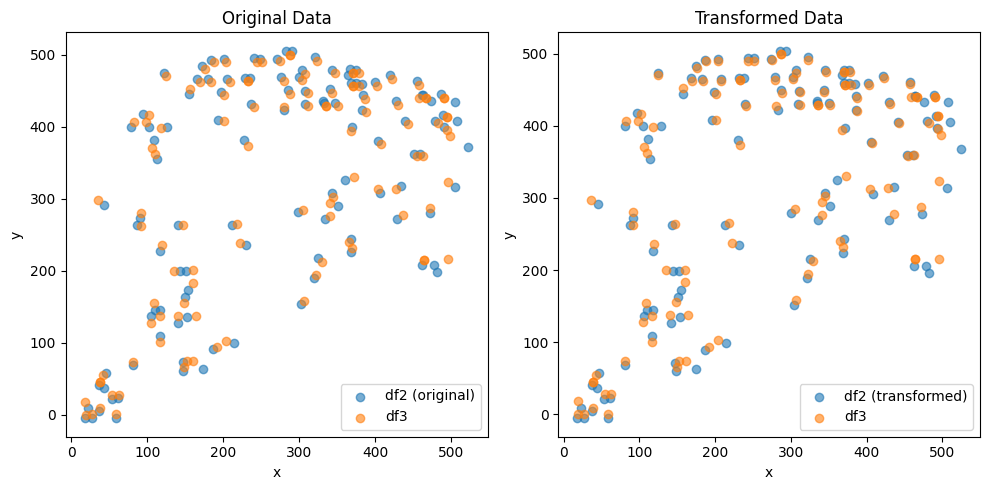

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (79,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.5771504758739247e-05 , 7.331682751683336e-05 )
Rotation (radians): 0.007130530426217703
Transform Matrix:
 [[ 9.99974578e-01 -7.13047000e-03  1.57715048e-05]
 [ 7.13047000e-03  9.99974578e-01  7.33168275e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


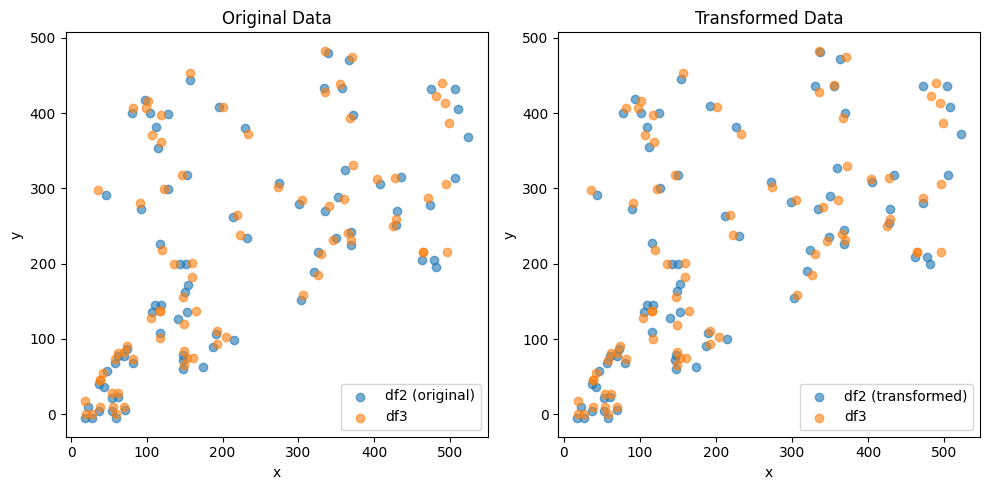

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (176,)
Optimal Translation and Rotation Parameters:
Translation: ( -3.668858560268605e-06 , -2.1056341584899915e-05 )
Rotation (radians): -0.005988606875636538
Transform Matrix:
 [[ 9.99982068e-01  5.98857108e-03 -3.66885856e-06]
 [-5.98857108e-03  9.99982068e-01 -2.10563416e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


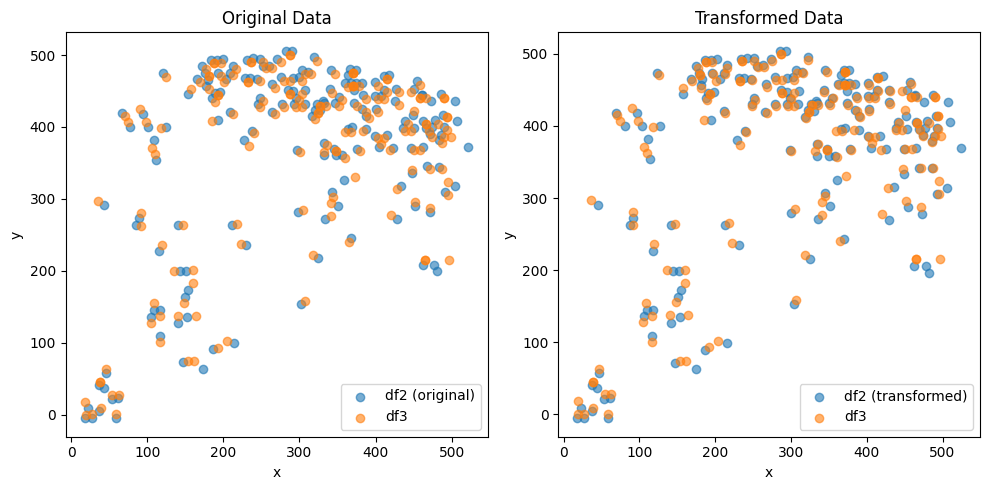

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (73,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.3848186549836772e-05 , 8.276894999032016e-05 )
Rotation (radians): 0.009996237431400809
Transform Matrix:
 [[ 9.99950038e-01 -9.99607095e-03  2.38481865e-05]
 [ 9.99607095e-03  9.99950038e-01  8.27689500e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


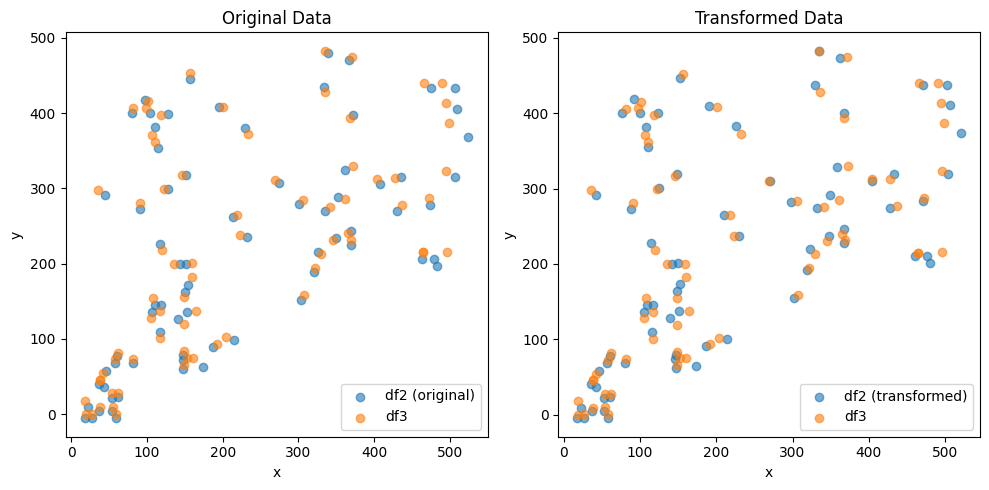

              0           1
0    323.806753  324.264703
1    318.809364  424.747877
2    403.588713  361.353125
3    308.652871  255.403609
4     57.919286   50.927111
..          ...         ...
995  195.922016  200.742846
996  329.237798  437.541559
997   49.654317  380.342590
998  282.653655  452.029964
999  243.493958  201.893744

[1000 rows x 2 columns]


In [1297]:
dist_min = 5  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

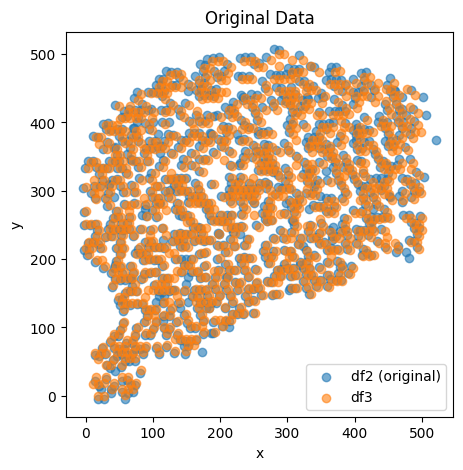

In [1298]:
plt.figure(figsize=(5, 5))

plt.scatter(data2_spatial_results[0], data2_spatial_results[1], label='df2 (original)', alpha=0.6)
plt.scatter(data3_spatial_results[0], data3_spatial_results[1], label='df3', alpha=0.6)
plt.title('Original Data')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()



C:\Users\28123\AppData\Local\Temp\ipykernel_15748\3497988853.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0     323.806753     324.264703           0                1             -1   
1     318.809364     424.747877           1                9             -1   
2     403.588713     361.353125           2                6             -1   
3     308.652871     255.403609           3               11             -1   
4      57.919286      50.927111           4                5             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0       320.858896       320.512821            48                  3   
1       323.926380       419.604701             1                  9   
2       407.770961       357.905983             2                  6   
3       309.611452       257.211538           693                 12   
4        58.077710        54.754274             4                  5   

   matabolic.CCA.Z 

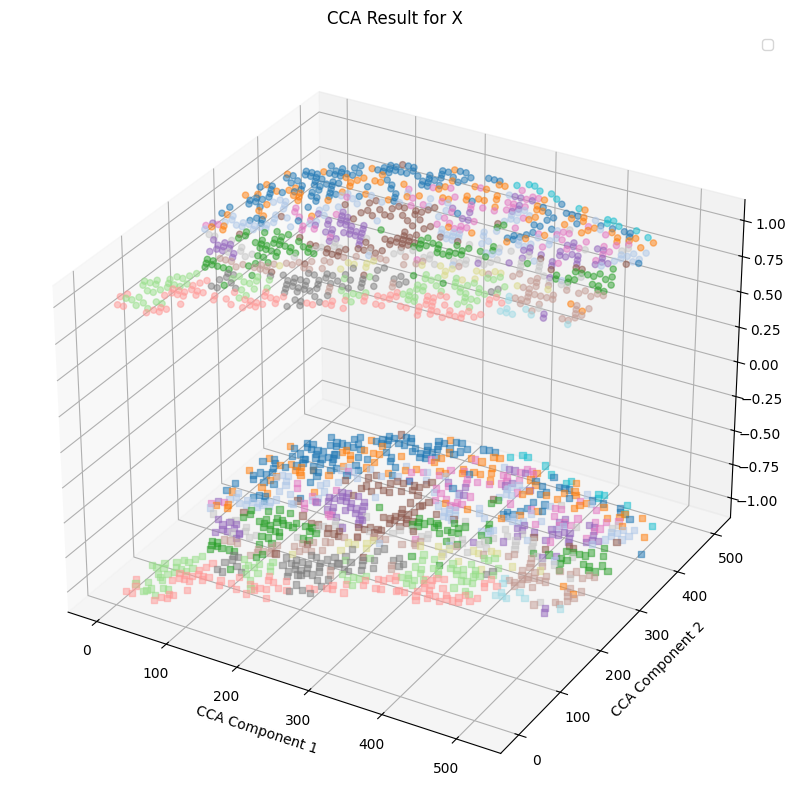

In [1299]:
Y_c = data2_spatial_results
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(data3_spatial_results, data2_spatial_results, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()


In [1300]:
same_values_mask_fine = pairs['spatial_cluster'] == pairs['matabolic_cluster']

# 计算相同值的个数
same_values_count_fine = same_values_mask_fine.sum()
same_values_count_fine

807

In [1301]:
#pairs.to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\no_anchorpair_run2.csv", index=False)

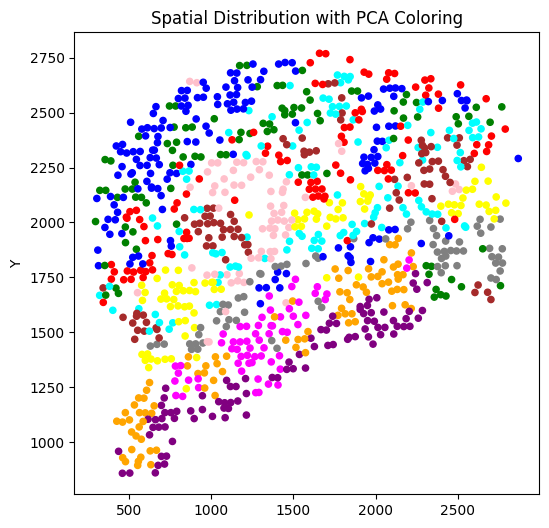

In [1302]:
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\rat\\furtheralignment.pdf")
plt.show()


In [1303]:
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
Accruracy_furtheralignment = same_values_count_fine

In [1304]:
dist_min = 2 ## min euclidean distance
from scipy.spatial.distance import cdist
distances = cdist(data3_spatial_results, data2_spatial_results, metric='euclidean')
dist_df = pd.DataFrame(distances)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
row_indices, col_indices = np.where(distances <dist_min)
unique_row_indices = np.unique(row_indices)
unique_col_indices = np.unique(col_indices)
#############plot
####Z_C is metablic and is at 1
Y_C_=Y_c.iloc[col_indices,]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_=Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str[col_indices].astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_=Y_C_.drop(columns=['index'])
Y_C_=Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})

Z_C_=Z_c.iloc[row_indices,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[row_indices].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})

pairs = pd.concat([Y_C_,Z_C_],axis=1)
pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  
print(pairs.head())


def calculate_simpson_index(values):
    total_count = len(values)
    unique_values = set(values)
    simpson_index = 1 - sum((values.count(value) / total_count) ** 2 for value in unique_values)
    return simpson_index

def main(df):
    # 保存每个 X1 中值对应的 X2 中值的列表
    x1_x2_lists = df.groupby('spatial_ID')['matabolic_cluster'].apply(list).reset_index()

    # 计算每个 X1 中值的辛普森指数
    simpson_indices = x1_x2_lists['matabolic_cluster'].apply(calculate_simpson_index)

    # 保存每个 X1 中值对应的 X2 中出现频率最高的值
    max_x2_values = x1_x2_lists['matabolic_cluster'].apply(lambda x: max(set(x), key=x.count))

    # 生成新的 DataFrame
    new_df = pd.DataFrame({'spatial_ID': x1_x2_lists['spatial_ID'], 'Most_freq_metabolic_cluster': max_x2_values, 'Simpson_Index': simpson_indices})

    # 合并 X3 列
    new_df = pd.merge(new_df, df[['spatial_ID',"spatial_cluster"]].drop_duplicates(), on='spatial_ID', how='left')

    return new_df

# 示例输入数据
data = pairs
df = pd.DataFrame(data)

# 调用主函数
result_df = main(df)
result_df

   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0     250.360259     282.759417         641                7             -1   
1     332.927495     148.953138          36                5             -1   
2      88.325796     125.759314          38               10             -1   
3      91.658780     117.070535          67               10             -1   
4     123.279863     153.557016          92                8             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0       249.897751       283.119658            29                 11   
1       334.560327       149.572650            36                  5   
2        89.161554       127.403846            38                 10   
3        93.047035       118.322650            67                 10   
4       124.539877       154.914530            92                  8   

   matabolic.CCA.Z  distance  
0                1  0.586249  
1                1  1.746407  

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\237650377.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_15748\237650377.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


,spatial_ID,Most_freq_metabolic_cluster,Simpson_Index,spatial_cluster
0,36,5,0.0,5
1,38,10,0.0,10
2,60,4,0.0,4
3,67,10,0.0,10
4,92,8,0.0,8
5,97,3,0.0,3
6,106,6,0.0,6
7,114,8,0.0,8
8,122,6,0.0,6
9,146,4,0.0,4


<bound method NDFrame.head of     spatial_ID  Most_freq_metabolic_cluster  Simpson_Index  spatial_cluster
0           36                            5            0.0                5
1           38                           10            0.0               10
2           60                            4            0.0                4
3           67                           10            0.0               10
4           92                            8            0.0                8
5           97                            3            0.0                3
6          106                            6            0.0                6
7          114                            8            0.0                8
8          122                            6            0.0                6
9          146                            4            0.0                4
10         169                           10            0.0               10
11         241                           10            0.0

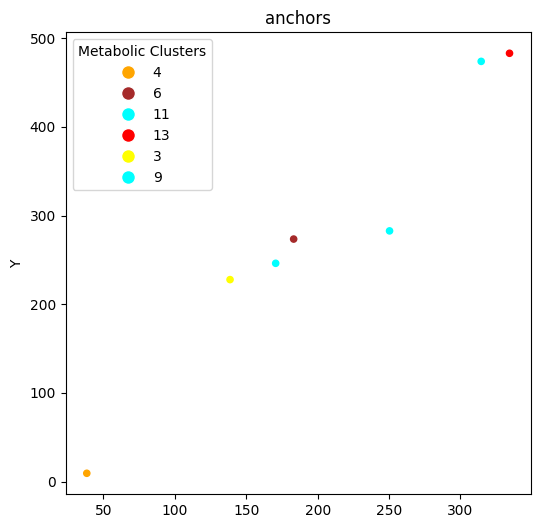

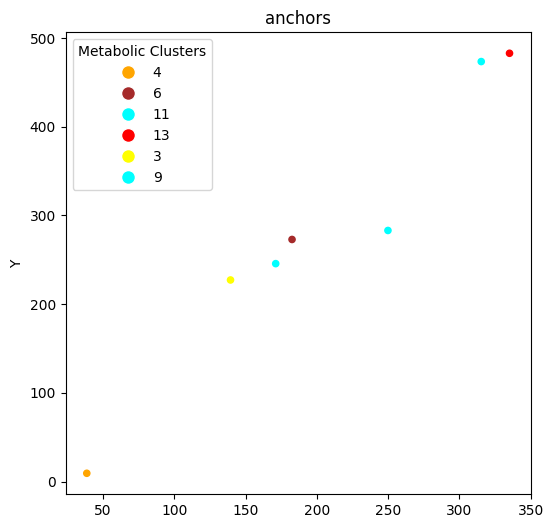

In [1305]:
###### find transcript-metaboic pairs anchors by filtering: 
######1/simpson index less than 0.2 2/Most_freq_metabolic_cluster==matabolic_cluster
print(result_df.head)
#print(pairs.head)
merged_df = pd.merge(result_df, pairs, on='spatial_ID', how='inner')
merged_df = pd.DataFrame(merged_df)
print(merged_df)
merged_df = merged_df[(merged_df['Simpson_Index'] < 0.5) &(merged_df['distance'] < 1) ]
#merged_df = merged_df[(merged_df['Simpson_Index'] < 0.5) & (merged_df['Most_freq_metabolic_cluster'] == merged_df['matabolic_cluster'])&(merged_df['distance'] < 0.5) ]
merged_df = merged_df.drop_duplicates(subset="matabolic_ID")
print(merged_df["spatial_ID"])

plt.figure(figsize=(6, 6))
plt.scatter(data2_spatial_results.iloc[merged_df["spatial_ID"], 0],data2_spatial_results.iloc[merged_df["spatial_ID"], 1], 
            c=[color_mapping[category] for category in merged_df["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('anchors')
unique_categories = merged_df["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\anchor_spatial.pdf")
plt.show()

plt.figure(figsize=(6, 6))
plt.scatter(data3_spatial_results.iloc[merged_df["matabolic_ID"], 0],data3_spatial_results.iloc[merged_df["matabolic_ID"], 1], 
            c=[color_mapping[category] for category in merged_df["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('anchors')
unique_categories = merged_df["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\anchor_metabolic.pdf")
plt.show()


In [1306]:
def convert_to_array(x):
    if isinstance(x, csr_matrix):
        return x.toarray()
    elif isinstance(x, np.ndarray):
        return x
    else:
        raise ValueError("Unsupported input type. Must be csr_matrix or ndarray.")
def tpm_normalize(counts_matrix):
    # 计算每个细胞的总表达量
    total_counts_per_cell = counts_matrix.sum(axis=1)
    # 计算每个基因的 TPM
    tpm_matrix = (counts_matrix.div(total_counts_per_cell, axis=0)) * 1e4
    return tpm_matrix
scaler = MinMaxScaler(feature_range=(-1, 1))
DF1 = convert_to_array(adata2.X)
DF1 = pd.DataFrame(DF1)
DF1 = tpm_normalize(DF1)
DF1 = np.log2(DF1 + 1)
#DF1 = scaler.fit_transform(DF1)
DF1 = pd.DataFrame(DF1)

DF2 = convert_to_array(adata1.X)
DF2 = pd.DataFrame(DF2)
DF2 = tpm_normalize(DF2)
#DF2 = scaler.fit_transform(DF2)
DF2 = np.log2(DF2+1)
DF2 = pd.DataFrame(DF2)

print(DF1.shape,DF2.shape)
spatial_ID_list = merged_df['spatial_ID'].tolist()
metabolic_ID_list = merged_df['matabolic_ID'].tolist()

# 从 DF1 和 DF2 中提取对应的样本
spatial_samples = DF1.loc[spatial_ID_list,:]
index_strings = adata2.var.index.astype(str)
column_mapping = {old_name: new_name for old_name, new_name in zip(spatial_samples.columns, index_strings)}
spatial_samples.rename(columns=column_mapping, inplace=True)
rowindex = spatial_samples.shape[0]
spatial_samples.index = range(rowindex)

metabolic_samples = DF2.loc[metabolic_ID_list,:]
rowindex = metabolic_samples.shape[0]
index_strings = adata1.var.index.astype(str)
column_mapping = {old_name: new_name for old_name, new_name in zip(metabolic_samples.columns, index_strings)}
metabolic_samples.rename(columns=column_mapping, inplace=True)
metabolic_samples.index = range(rowindex)

print(spatial_samples.shape,metabolic_samples.shape,pd.concat([spatial_samples, metabolic_samples], axis=0).shape)
# 计算特征之间的相关性

(1000, 2500) (1000, 2499)
(7, 2500) (7, 2499) (14, 4999)


(7, 4999)


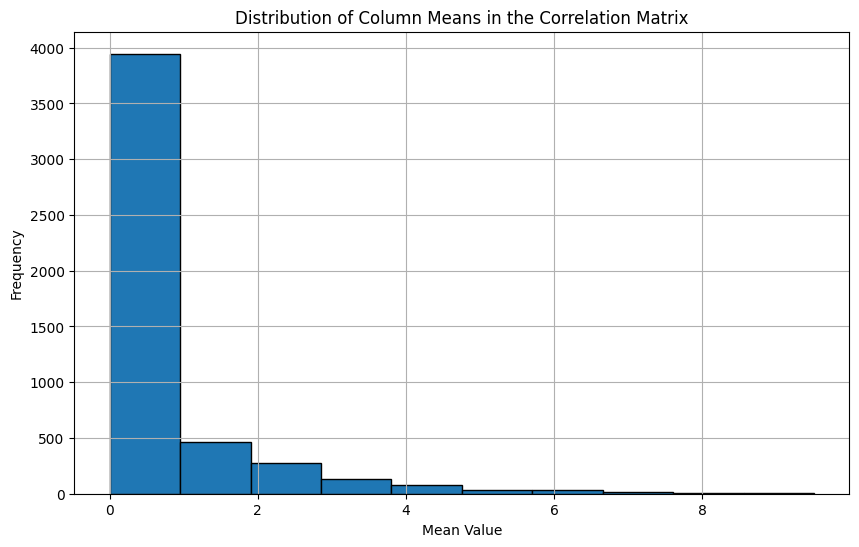

DF1 列变量与 DF2 列变量之间的相关性矩阵：


In [1307]:
correlation_matrix = pd.concat([spatial_samples, metabolic_samples], axis=1)
print(correlation_matrix.shape)
column_means = correlation_matrix.mean(axis=0)
plt.figure(figsize=(10, 6))
plt.hist(column_means, bins=10, edgecolor='black')
plt.title('Distribution of Column Means in the Correlation Matrix')
plt.xlabel('Mean Value')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()
correlation_matrix = correlation_matrix.corr()
# 显示相关性矩阵
print("DF1 列变量与 DF2 列变量之间的相关性矩阵：")

# 显示 DF3
#print(DF3)

(2500, 2499)


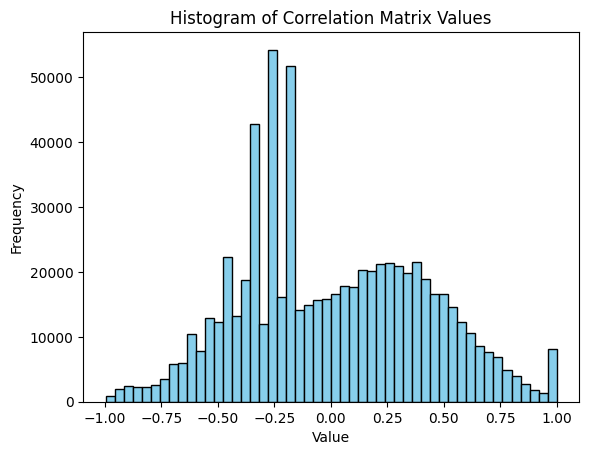

In [1308]:
correlation_matrix2 = correlation_matrix.iloc[:2500, -2499:]
print(correlation_matrix2.shape)

values = correlation_matrix2.values.flatten()
plt.hist(values, bins=50, color='skyblue', edgecolor='black')
plt.title('Histogram of Correlation Matrix Values')
plt.xlabel('Value')
plt.ylabel('Frequency')

# 显示图形
plt.show()
high_correlation_spatial = []
high_correlation_metabolic = []



In [1309]:
import pandas as pd
import numpy as np

# Example correlation matrix with NaN values
correlation_matrix2[correlation_matrix2 > 0.95] = np.nan
# Flatten the correlation matrix and keep track of the row and column indices, excluding NaNs
flattened = correlation_matrix2.values.flatten()
non_nan_indices = ~np.isnan(flattened)
flattened_non_nan = flattened[non_nan_indices]
original_indices = np.dstack(np.unravel_index(np.where(non_nan_indices)[0], correlation_matrix2.shape))[0]

# Sort the non-NaN flattened array to find the top 20 highest values
sorted_indices = np.argsort(flattened_non_nan)[::-1]
top_n = 200
top_indices = original_indices[sorted_indices[:top_n]]

# Retrieve the corresponding row and column indices
top_rows = top_indices[:, 0]
top_cols = top_indices[:, 1]

# Get the top 20 highest values
top_values = flattened_non_nan[sorted_indices[:top_n]]

# Convert to lists if needed
top_rows = list(top_rows)
top_cols = list(top_cols)
top_values = list(top_values)

# Display results
print("Top 20 highest correlation values (excluding NaNs):")
for i in range(len(top_values)):
    print(f"Value: {top_values[i]}, Row: {top_rows[i]}, Column: {top_cols[i]}")

# Optionally, convert to a DataFrame for easier viewing
top_correlations_df = pd.DataFrame({
    'Value': top_values,
    'Row': top_rows,
    'Column': top_cols
})

print("\nTop 20 highest correlation values in DataFrame format:")
print(top_correlations_df)

unique_top_correlations_df = top_correlations_df.drop_duplicates(subset=['Column'])
unique_top_correlations_df = unique_top_correlations_df.drop_duplicates(subset=['Row'])
# 转换为列表（如果需要）
unique_top_rows = list(unique_top_correlations_df['Row'])
unique_top_cols = list(unique_top_correlations_df['Column'])
unique_top_values = list(unique_top_correlations_df['Value'])

print("\nTop correlation values in DataFrame format (unique pairs):")
print(unique_top_correlations_df)


Top 20 highest correlation values (excluding NaNs):
Value: 0.9499836570013047, Row: 1275, Column: 489
Value: 0.9499058315981826, Row: 1457, Column: 946
Value: 0.9499058315981826, Row: 1457, Column: 264
Value: 0.9498805296278726, Row: 1744, Column: 1041
Value: 0.9498617305476991, Row: 1172, Column: 985
Value: 0.9498343616583912, Row: 803, Column: 2184
Value: 0.9497784629450847, Row: 2180, Column: 815
Value: 0.9497298469805893, Row: 915, Column: 758
Value: 0.9497298469805893, Row: 1454, Column: 758
Value: 0.9497116386557639, Row: 35, Column: 2433
Value: 0.949708192509357, Row: 717, Column: 1580
Value: 0.9496963362384174, Row: 1392, Column: 979
Value: 0.94963775479582, Row: 899, Column: 2184
Value: 0.9495767854038122, Row: 742, Column: 874
Value: 0.9494996811660749, Row: 1880, Column: 49
Value: 0.9494758617205515, Row: 1155, Column: 1579
Value: 0.9493440719537375, Row: 552, Column: 1421
Value: 0.9493366953356557, Row: 2051, Column: 1580
Value: 0.9493236669055589, Row: 1457, Column: 938
Va

In [1310]:
import numpy as np
import matplotlib.pyplot as plt
scaler = MinMaxScaler(feature_range=(-1, 1))
metabolic_select_high_corr_variant = convert_to_array(adata1.X)
metabolic_select_high_corr_variant = pd.DataFrame(metabolic_select_high_corr_variant)
metabolic_select_high_corr_variant = scaler.fit_transform(metabolic_select_high_corr_variant)
metabolic_select_high_corr_variant = pd.DataFrame(metabolic_select_high_corr_variant)
metabolic_select_high_corr_variant = metabolic_select_high_corr_variant.iloc[:,top_cols]
metabolic_select_high_corr_variant = pd.concat([data3_spatial_results, metabolic_select_high_corr_variant], axis=1)

spatial_select_high_corr_variant = convert_to_array(adata2.X)
spatial_select_high_corr_variant = pd.DataFrame(spatial_select_high_corr_variant)
spatial_select_high_corr_variant = scaler.fit_transform(spatial_select_high_corr_variant)
spatial_select_high_corr_variant = pd.DataFrame(spatial_select_high_corr_variant)
spatial_select_high_corr_variant = spatial_select_high_corr_variant.iloc[:,top_rows]
spatial_select_high_corr_variant = pd.concat([data2_spatial_results, spatial_select_high_corr_variant], axis=1)

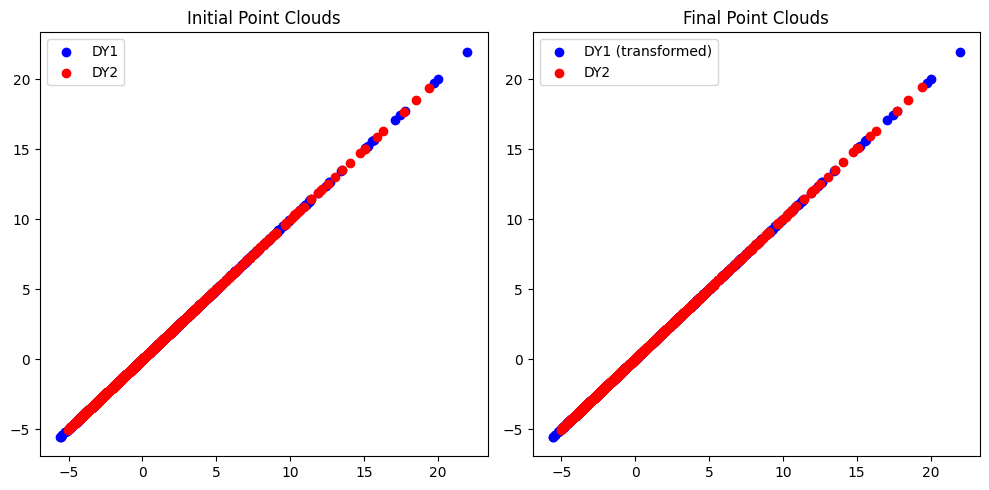

Final transformation matrix:
[[-1.07128016e-06]]


In [1311]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

#DY1 = data2_spatial_results.T.values  # Example DY1 point cloud (2D points
#DY1 = data2_spatial_results.T.values
#DY2 = data3_spatial_results.T.values # Example DY2 point cloud (2D points)
DY1 = spatial_select_high_corr_variant.iloc[:,2:].T.to_numpy()  # Example DYGW1 features
DY2 = metabolic_select_high_corr_variant.iloc[:,2:].T.to_numpy()  # Example DYGW2 features
scaler1 = StandardScaler()
scaler2 = StandardScaler()
DY1 = scaler1.fit_transform(DY1.T).T
DY2 = scaler2.fit_transform(DY2.T).T

# Perform CCA
cca = CCA(n_components=1)
DY1_c, DY2_c = cca.fit_transform(DY1.T, DY2.T)
DY1 = DY1_c.T
DY2 = DY2_c.T
# 初始变换估计
transformation = np.eye(2)  # 初始变换矩阵为2x2的单位矩阵

# 设定迭代次数和收敛阈值
max_iterations = 500
tolerance = 1e-5

# 创建一个新的图形窗口
plt.figure(figsize=(10, 5))

# 绘制初始的DY1和DY2点云
plt.subplot(1, 2, 1)
plt.title('Initial Point Clouds')
plt.scatter(DY1[0], DY1[0], color='blue', label='DY1')
plt.scatter(DY2[0], DY2[0], color='red', label='DY2')
plt.legend()

iteration = 0
converged = False

while not converged and iteration < max_iterations:
    # Step 1: Find correspondences based on spatial proximity
    tree = cKDTree(DY2.T)
    distances, indices = tree.query(DY1.T)
    
    corresponding_target_points = DY2[:, indices]

    # Step 2: Optimize transformation using spatial and feature distances
    # Example: simple averaging transformation for illustration
    transformation = np.mean(corresponding_target_points - DY1, axis=1, keepdims=True)

    # Step 3: Apply transformation to DY1
    DY1_transformed = DY1 + transformation

    # Step 4: Update DY1 for the next iteration
    DY1 = DY1_transformed

    # Step 5: Check convergence
    if np.linalg.norm(transformation) < tolerance:
        converged = True

    iteration += 1

# 绘制最终的DY1和DY2点云
plt.subplot(1, 2, 2)
plt.title('Final Point Clouds')
plt.scatter(DY1[0], DY1[0], color='blue', label='DY1 (transformed)')
plt.scatter(DY2[0], DY2[0], color='red', label='DY2')
plt.legend()

plt.tight_layout()
plt.show()

print("Final transformation matrix:")
print(transformation)

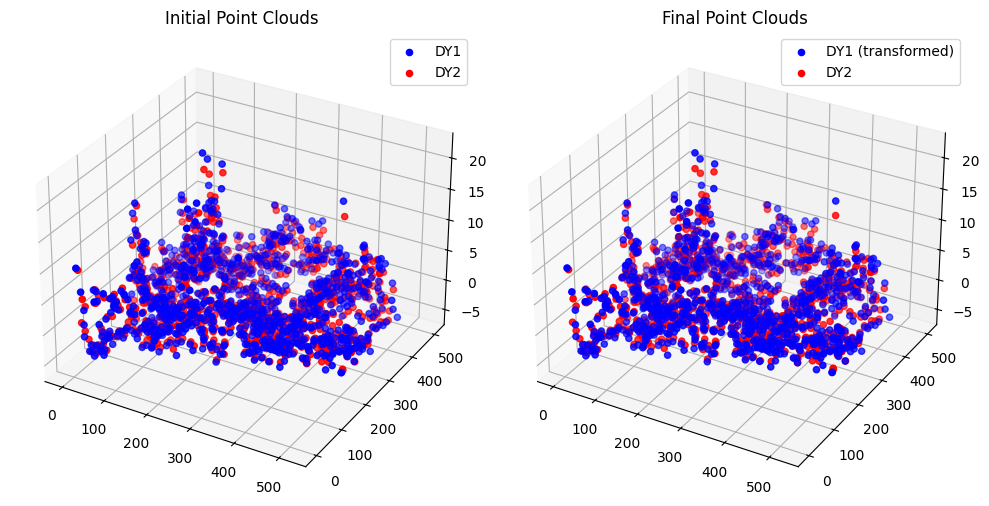

Final transformation matrix:
[[ 1.00000000e+00 -3.90799872e-17  1.28286734e-18  8.52651283e-14]
 [ 9.57886091e-17  1.00000000e+00 -7.87996465e-19  2.27373675e-13]
 [ 4.46924902e-18  1.46005681e-18  1.00000000e+00 -1.37910516e-15]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [1312]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
DY1CCA = DY1
DY2CCA = DY2
# Example 3D point cloud data (replace with your actual data)
DY1 = spatial_select_high_corr_variant.iloc[:,0:2].T.to_numpy()  # 3D point cloud DY1 (3 x N)
DY2 = metabolic_select_high_corr_variant.iloc[:,0:2].T.to_numpy()   # 3D point cloud DY2 (3 x M)
DY1 = np.vstack((DY1, DY1CCA))
DY2 = np.vstack((DY2, DY2CCA))

# 初始变换矩阵
transformation_matrix = np.eye(4)  # 初始变换矩阵为4x4单位矩阵

# 设置迭代参数
max_iterations = 500
tolerance = 1e-5

# 绘制初始点云
fig = plt.figure(figsize=(10, 5))

ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(DY1[0], DY1[1], DY1[2], color='blue', label='DY1')
ax1.scatter(DY2[0], DY2[1], DY2[2], color='red', label='DY2')
ax1.set_title('Initial Point Clouds')
ax1.legend()

iteration = 0
converged = False

while not converged and iteration < max_iterations:
    # Step 1: Find correspondences based on spatial proximity
    tree = cKDTree(DY2.T)
    distances, indices = tree.query(DY1.T)

    corresponding_target_points = DY2[:, indices]

    # Step 2: Calculate centroids
    centroid_DY1 = np.mean(DY1, axis=1, keepdims=True)
    centroid_DY2 = np.mean(corresponding_target_points, axis=1, keepdims=True)

    # Step 3: Center the points
    DY1_centered = DY1 - centroid_DY1
    DY2_centered = corresponding_target_points - centroid_DY2

    # Step 4: Compute the covariance matrix
    H = DY1_centered @ DY2_centered.T

    # Step 5: Compute the Singular Value Decomposition (SVD)
    U, S, Vt = np.linalg.svd(H)
    R = Vt.T @ U.T

    # Step 6: Ensure a proper rotation matrix (det(R) = 1)
    if np.linalg.det(R) < 0:
        Vt[2, :] *= -1
        R = Vt.T @ U.T

    # Step 7: Compute the translation vector
    t = centroid_DY2 - R @ centroid_DY1

    # Step 8: Form the transformation matrix
    transformation = np.eye(4)
    transformation[:3, :3] = R
    transformation[:3, 3] = t.flatten()

    # Step 9: Apply the transformation
    DY1_homogeneous = np.vstack((DY1, np.ones((1, DY1.shape[1]))))
    DY1_transformed_homogeneous = transformation @ DY1_homogeneous
    DY1_transformed = DY1_transformed_homogeneous[:3, :]

    # Step 10: Update DY1|
    DY1 = DY1_transformed

    # Step 11: Check convergence
    if np.linalg.norm(transformation[:3, 3]) < tolerance:
        converged = True

    iteration += 1

# 绘制最终点云
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(DY1[0], DY1[1], DY1[2], color='blue', label='DY1 (transformed)')
ax2.scatter(DY2[0], DY2[1], DY2[2], color='red', label='DY2')
ax2.set_title('Final Point Clouds')
ax2.legend()

plt.tight_layout()
plt.show()

print("Final transformation matrix:")
print(transformation)

C:\Users\28123\AppData\Local\Temp\ipykernel_15748\2748365551.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 3) (1000, 3)
(1000, 1000)
(1000, 3) (1000, 3)
(1000, 3) (1000, 3)
   spatial.CCA.X  spatial.CCA.Y         2  spatial_ID  spatial_cluster  \
0     327.910441     321.617054 -4.051232           0                1   
1     324.078268     422.151580 -1.126459           1                9   
2     408.113720     357.777478  4.806408           2                6   
3     311.958721     252.936431 -4.715709           3               11   
4      58.865097      51.383876  4.653965           4                5   

   spatial.CCA.Z  metabolic.CCA.X  metabolic.CCA.Y         2  matabolic_ID  \
0             -1       328.834356       320.512821 -3.378975             0   
1             -1       323.926380       419.604701 -1.384722             1   
2             -1       407.770961       357.905983  4.638717             2   
3             -1       313.701431       248.397436 -4.033764           134   
4             -1        58.077710        54.754274  4.591921             4   

   matabolic_

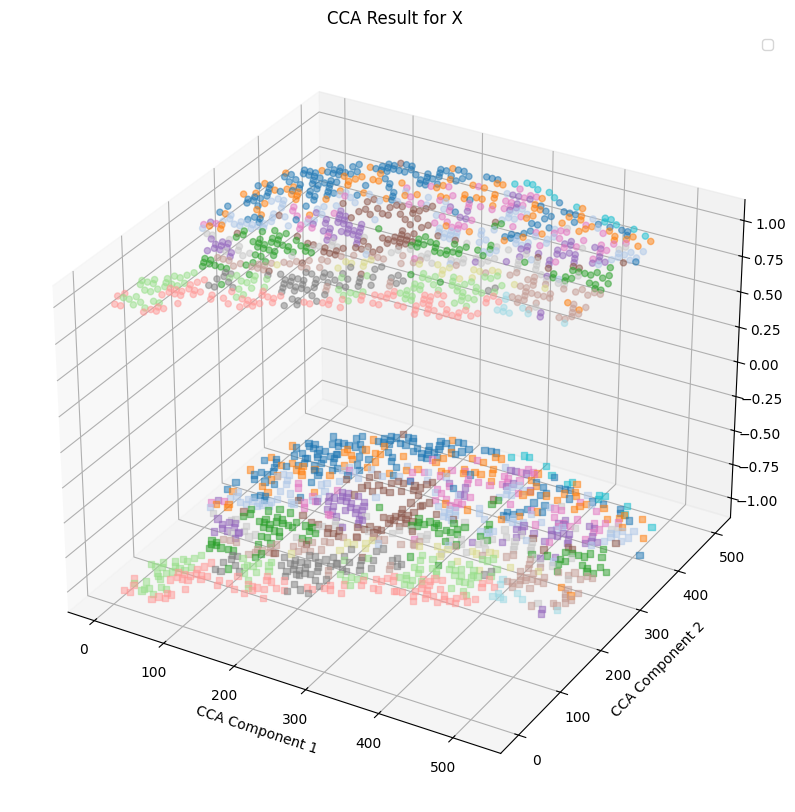

In [1313]:
Y_c = pd.DataFrame(DY1).T
Z_c = pd.DataFrame(DY2).T
#Y_c = pd.DataFrame(G)
#Z_c = data3_spatial_results
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(Z_c, Y_c, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices_ = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices_,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices_].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()

In [1314]:
same_values_mask = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
Accruracy_haCCA = same_values_mask.sum()
print(same_values_mask.sum())
print(same_values_count_fine)
print("SOTA: ",same_values_mask.sum()-same_values_count_fine )
print("directalignment: ",accruracy_directmerge)
print("grossalignment: ",Accruracy_grossalignment)
print("furtheralignment: ",Accruracy_furtheralignment)
print("ICP",accruracy_ICP)
print("haCCA: ",Accruracy_haCCA)


937
807
SOTA:  130
directalignment:  632
grossalignment:  904
furtheralignment:  807
ICP 684
haCCA:  937


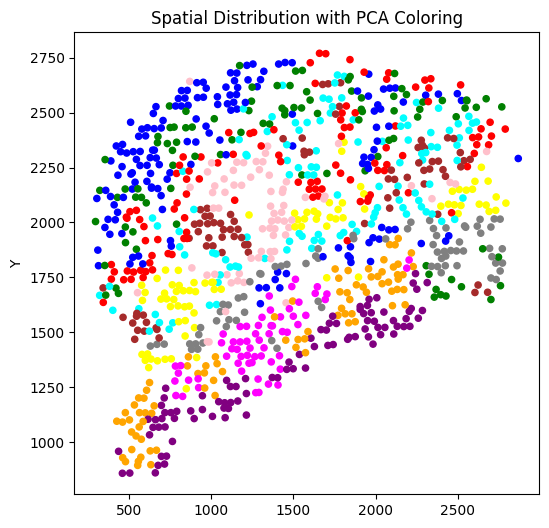

In [1315]:
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\rat\\CCA_IPCalignment.pdf")
plt.show()


In [1316]:
#pairs.to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\run2.csv", index=False)

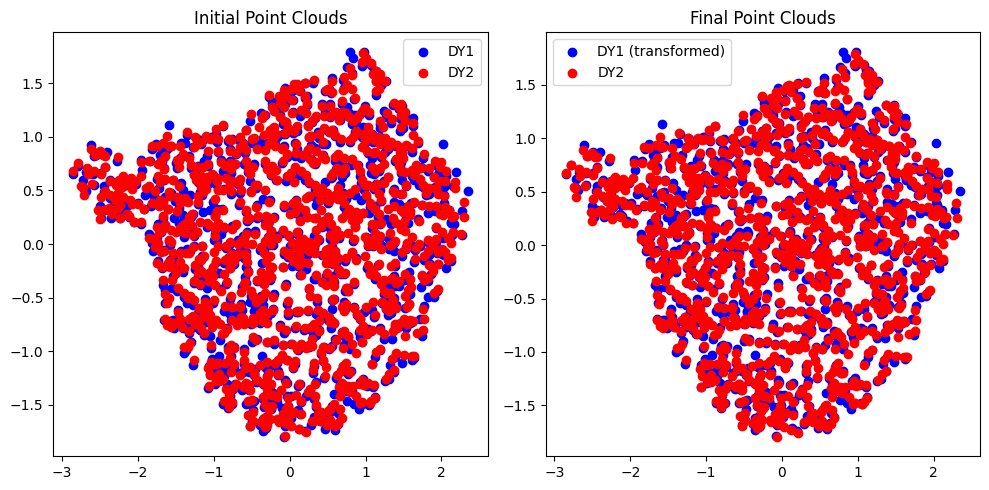

Final transformation matrix:
[[2.04142259e-17]
 [6.21724894e-18]]


In [1317]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

#DY1 = data2_spatial_results.T.values  # Example DY1 point cloud (2D points
#DY1 = data2_spatial_results.T.values
#DY2 = data3_spatial_results.T.values # Example DY2 point cloud (2D points)
DY1 = spatial_select_high_corr_variant.T.to_numpy()  # Example DYGW1 features
DY2 = metabolic_select_high_corr_variant.T.to_numpy()  # Example DYGW2 features
scaler1 = StandardScaler()
scaler2 = StandardScaler()
DY1 = scaler1.fit_transform(DY1.T).T
DY2 = scaler2.fit_transform(DY2.T).T

# Perform CCA
cca = CCA(n_components=2)
DY1_c, DY2_c = cca.fit_transform(DY1.T, DY2.T)
DY1 = DY1_c.T
DY2 = DY2_c.T
# 初始变换估计
transformation = np.eye(2)  # 初始变换矩阵为2x2的单位矩阵

# 设定迭代次数和收敛阈值
max_iterations = 500
tolerance = 1e-5

# 创建一个新的图形窗口
plt.figure(figsize=(10, 5))

# 绘制初始的DY1和DY2点云
plt.subplot(1, 2, 1)
plt.title('Initial Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

iteration = 0
converged = False

while not converged and iteration < max_iterations:
    # Step 1: Find correspondences based on spatial proximity
    tree = cKDTree(DY2.T)
    distances, indices = tree.query(DY1.T)
    
    corresponding_target_points = DY2[:, indices]

    # Step 2: Optimize transformation using spatial and feature distances
    # Example: simple averaging transformation for illustration
    transformation = np.mean(corresponding_target_points - DY1, axis=1, keepdims=True)

    # Step 3: Apply transformation to DY1
    DY1_transformed = DY1 + transformation

    # Step 4: Update DY1 for the next iteration
    DY1 = DY1_transformed

    # Step 5: Check convergence
    if np.linalg.norm(transformation) < tolerance:
        converged = True

    iteration += 1

# 绘制最终的DY1和DY2点云
plt.subplot(1, 2, 2)
plt.title('Final Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1 (transformed)')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

plt.tight_layout()
plt.show()

print("Final transformation matrix:")
print(transformation)

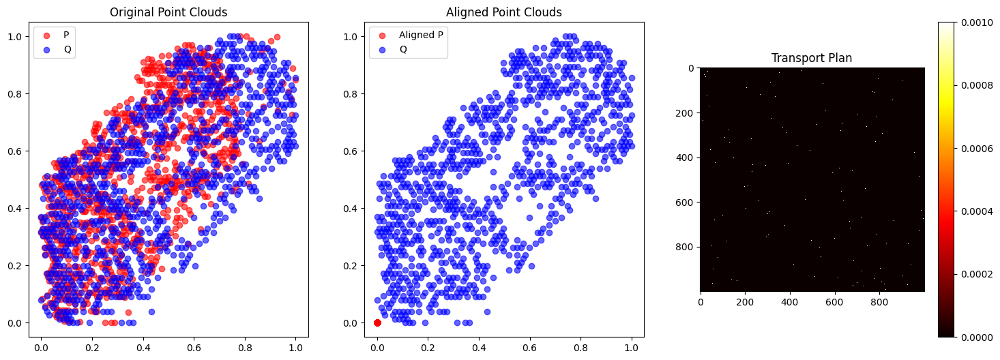

In [1083]:
import numpy as np
import ot
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# 假设 P 和 Q 是两个点云，形状分别为 (n, d) 和 (m, d)
np.random.seed(0)
P = spatial_select_high_corr_variant.iloc[:,0:2].to_numpy()  # 3D point cloud DY1 (3 x N)
Q = metabolic_select_high_corr_variant.iloc[:,0:2].to_numpy()   # 3D point cloud DY2 (3 x M)
# 特征矩阵（这里假设特征与坐标相同）
F_P = DY1CCA 
F_Q = DY2CCA

# 数据标准化
scaler = StandardScaler()
P = scaler.fit_transform(P)
Q = scaler.fit_transform(Q)

# 数据归一化
scaler = MinMaxScaler()
P = scaler.fit_transform(P)
Q = scaler.fit_transform(Q)

# 计算几何距离矩阵
C_P = np.linalg.norm(P[:, None, :] - P[None, :, :], axis=2)
C_Q = np.linalg.norm(Q[:, None, :] - Q[None, :, :], axis=2)

# 计算特征距离矩阵
M = np.linalg.norm(F_P[:, None, :] - F_Q[None, :, :], axis=2)

# 初始化权重，均匀分布
a = np.ones((P.shape[0],)) / P.shape[0]
b = np.ones((Q.shape[0],)) / Q.shape[0]

# 设置平衡参数
alpha = 0.5

# 设置参数
params = {
    'max_iter': 2000,    # 增加最大迭代次数
    'tol_rel': 1e-7,     # 调整相对容差
    'tol_abs': 1e-9,     # 调整绝对容差
    'armijo': True       # 使用Armijo线搜索
}

# 计算FGW最优传输计划
pi, log = ot.gromov.fused_gromov_wasserstein(M, C_P, C_Q, a, b, alpha=alpha, log=True, **params)

# 对齐点云 P 到 Q
P_aligned = np.dot(pi, Q)

# 可视化
plt.figure(figsize=(18, 6))

# 原始点云
plt.subplot(1, 3, 1)
plt.scatter(P[:, 0], P[:, 1], color='red', label='P', alpha=0.6)
plt.scatter(Q[:, 0], Q[:, 1], color='blue', label='Q', alpha=0.6)
plt.title('Original Point Clouds')
plt.legend()

# 对齐后的点云
plt.subplot(1, 3, 2)
plt.scatter(P_aligned[:, 0], P_aligned[:, 1], color='red', label='Aligned P', alpha=0.6)
plt.scatter(Q[:, 0], Q[:, 1], color='blue', label='Q', alpha=0.6)
plt.title('Aligned Point Clouds')
plt.legend()

# 可视化传输计划
plt.subplot(1, 3, 3)
plt.imshow(pi, cmap='hot', interpolation='nearest')
plt.title('Transport Plan')
plt.colorbar()

plt.show()


In [1084]:
np.dot(pi, Q)

array([[3.13964513e-05, 2.67010524e-05],
       [7.39970202e-04, 4.99791602e-04],
       [4.41365236e-04, 7.89699880e-04],
       ...,
       [7.89110116e-05, 2.89908305e-04],
       [5.90977703e-04, 9.08018133e-04],
       [9.76323987e-04, 7.89126811e-04]])

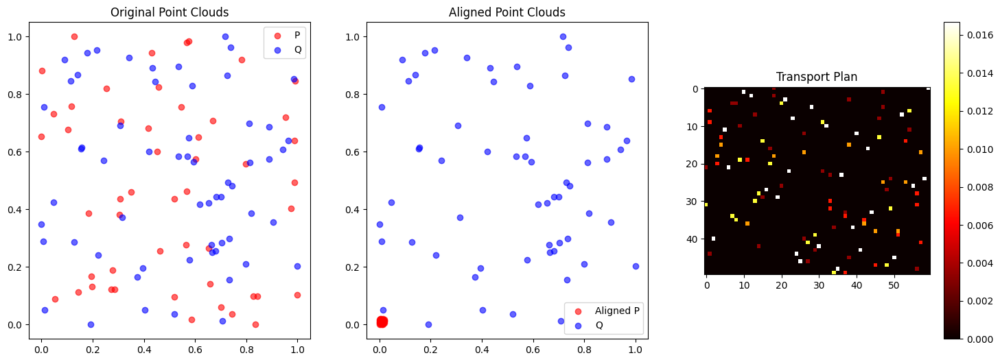

In [1085]:
import numpy as np
import ot
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# 假设 P 和 Q 是两个点云，形状分别为 (n, d) 和 (m, d)
np.random.seed(0)
P = np.random.rand(50, 2)
Q = np.random.rand(60, 2)

# 特征矩阵（这里假设特征与坐标相同）
F_P = P
F_Q = Q

# 数据标准化
scaler = StandardScaler()
P = scaler.fit_transform(P)
Q = scaler.fit_transform(Q)

# 数据归一化
scaler = MinMaxScaler()
P = scaler.fit_transform(P)
Q = scaler.fit_transform(Q)

# 计算几何距离矩阵
C_P = np.linalg.norm(P[:, None, :] - P[None, :, :], axis=2)
C_Q = np.linalg.norm(Q[:, None, :] - Q[None, :, :], axis=2)

# 计算特征距离矩阵
M = np.linalg.norm(F_P[:, None, :] - F_Q[None, :, :], axis=2)

# 初始化权重，均匀分布
a = np.ones((P.shape[0],)) / P.shape[0]
b = np.ones((Q.shape[0],)) / Q.shape[0]

# 设置平衡参数
alpha = 0.5

# 设置参数
params = {
    'max_iter': 2000,    # 增加最大迭代次数
    'tol_rel': 1e-7,     # 调整相对容差
    'tol_abs': 1e-9,     # 调整绝对容差
    'armijo': True       # 使用Armijo线搜索
}

# 计算FGW最优传输计划
pi, log = ot.gromov.fused_gromov_wasserstein(M, C_P, C_Q, a, b, alpha=alpha, log=True, **params)

# 对齐点云 P 到 Q
P_aligned = np.dot(pi, Q)

# 计算新的点云表示（避免收敛到一个点）
P_new = np.zeros_like(P)
for i in range(P.shape[0]):
    P_new[i, :] = np.sum(pi[i, :, None] * Q, axis=0)

# 可视化
plt.figure(figsize=(18, 6))

# 原始点云
plt.subplot(1, 3, 1)
plt.scatter(P[:, 0], P[:, 1], color='red', label='P', alpha=0.6)
plt.scatter(Q[:, 0], Q[:, 1], color='blue', label='Q', alpha=0.6)
plt.title('Original Point Clouds')
plt.legend()

# 对齐后的点云
plt.subplot(1, 3, 2)
plt.scatter(P_new[:, 0], P_new[:, 1], color='red', label='Aligned P', alpha=0.6)
plt.scatter(Q[:, 0], Q[:, 1], color='blue', label='Q', alpha=0.6)
plt.title('Aligned Point Clouds')
plt.legend()

# 可视化传输计划
plt.subplot(1, 3, 3)
plt.imshow(pi, cmap='hot', interpolation='nearest')
plt.title('Transport Plan')
plt.colorbar()

plt.show()
